#Predictive maintenance: RUL regression and failure classification

Authors:
* Francesca Boccardi, francesca.boccardi@studio.unibo.it
* Luigi Podda, luigi.podda@studio.unibo.it

**Summary**: The purpose of this work is to inspect different approaches to solve a predictive maintenance problem.

Experimenting with different methods and architectures, the problem is approached as a regression task through the prediction of Remaining Useful Life (RUL) and as a classification task to classify which component will fail in the following hours.




# Install & imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%capture
! pip install --upgrade tensorflow
! pip install keras-self-attention

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/AI4I/Project")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
import sklearn
from sklearn.metrics import r2_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GroupShuffleSplit, StratifiedGroupKFold
import tensorflow as tf
import keras
from tensorflow.keras import callbacks

import utils
import models

# Dataset manipulation

In this project, we make use of the [Microsoft Azure Predictive Maintenance dataset](https://www.kaggle.com/datasets/arnabbiswas1/microsoft-azure-predictive-maintenance). It consists of the following data:

* Operating conditions of the machines e.g. data collected from sensors.
* Failure history of the machines or components within the machines.
* Maintenance history of the machines, e.g. error codes, previous maintenance activities or component replacements.
* Features of machines, e.g. engine size, make and model, location.


All this information are stored in 5 different .csv files.

Let's start importing the first table of data. It consists of hourly average of voltage, rotation, pressure, vibration collected from 100 machines for the year 2015.

In [ ]:
# Volt, rotate, pressure and vibration dataset

df_sensor = pd.read_csv('drive/MyDrive/AI4I/Project/data/PdM_telemetry.csv')
df_sensor

,datetime,machineID,volt,rotate,pressure,vibration
0,2015-01-01 06:00:00,1,176.217853,418.504078,113.077935,45.087686
1,2015-01-01 07:00:00,1,162.879223,402.747490,95.460525,43.413973
2,2015-01-01 08:00:00,1,170.989902,527.349825,75.237905,34.178847
3,2015-01-01 09:00:00,1,162.462833,346.149335,109.248561,41.122144
4,2015-01-01 10:00:00,1,157.610021,435.376873,111.886648,25.990511
...,...,...,...,...,...,...
876095,2016-01-01 02:00:00,100,179.438162,395.222827,102.290715,50.771941
876096,2016-01-01 03:00:00,100,189.617555,446.207972,98.180607,35.123072
876097,2016-01-01 04:00:00,100,192.483414,447.816524,94.132837,48.314561
876098,2016-01-01 05:00:00,100,165.475310,413.771670,104.081073,44.835259


Then, let's load the data about the model type and age of the machines and merge it with the table of sensor values.

In [ ]:
# Model and age per machine dataset

df_features = pd.read_csv('drive/MyDrive/AI4I/Project/data/PdM_machines.csv')
df_features

,machineID,model,age
0,1,model3,18
1,2,model4,7
2,3,model3,8
3,4,model3,7
4,5,model3,2
...,...,...,...
95,96,model2,10
96,97,model2,14
97,98,model2,20
98,99,model1,14


In [ ]:
# Merge sensors values and features

df = df_sensor.merge(df_features)
df

,datetime,machineID,volt,rotate,pressure,vibration,model,age
0,2015-01-01 06:00:00,1,176.217853,418.504078,113.077935,45.087686,model3,18
1,2015-01-01 07:00:00,1,162.879223,402.747490,95.460525,43.413973,model3,18
2,2015-01-01 08:00:00,1,170.989902,527.349825,75.237905,34.178847,model3,18
3,2015-01-01 09:00:00,1,162.462833,346.149335,109.248561,41.122144,model3,18
4,2015-01-01 10:00:00,1,157.610021,435.376873,111.886648,25.990511,model3,18
...,...,...,...,...,...,...,...,...
876095,2016-01-01 02:00:00,100,179.438162,395.222827,102.290715,50.771941,model4,5
876096,2016-01-01 03:00:00,100,189.617555,446.207972,98.180607,35.123072,model4,5
876097,2016-01-01 04:00:00,100,192.483414,447.816524,94.132837,48.314561,model4,5
876098,2016-01-01 05:00:00,100,165.475310,413.771670,104.081073,44.835259,model4,5


In [ ]:
# 2016 check --> some data also from 2016

data_2016 = df[df['datetime'].str.contains('2016-01-01')]['datetime']
print(data_2016.unique())
print(data_2016.shape[0])

['2016-01-01 00:00:00' '2016-01-01 01:00:00' '2016-01-01 02:00:00'
 '2016-01-01 03:00:00' '2016-01-01 04:00:00' '2016-01-01 05:00:00'
 '2016-01-01 06:00:00']
700


In the failures dataset each record represents replacement of a component due to failure.

In [ ]:
# Failures dataset

df_fail = pd.read_csv('drive/MyDrive/AI4I/Project/data//PdM_failures.csv')
df_fail

,datetime,machineID,failure
0,2015-01-05 06:00:00,1,comp4
1,2015-03-06 06:00:00,1,comp1
2,2015-04-20 06:00:00,1,comp2
3,2015-06-19 06:00:00,1,comp4
4,2015-09-02 06:00:00,1,comp4
...,...,...,...
756,2015-11-29 06:00:00,99,comp3
757,2015-12-14 06:00:00,99,comp4
758,2015-02-12 06:00:00,100,comp1
759,2015-09-10 06:00:00,100,comp1


If a component of a machine is replaced, that is captured as a record of the maintenance table.

Maintenance data has both 2014 and 2015 records.

In [ ]:
# Maintenance dataset

df_maintenance = pd.read_csv('drive/MyDrive/AI4I/Project/data/PdM_maint.csv')
df_maintenance

,datetime,machineID,comp
0,2014-06-01 06:00:00,1,comp2
1,2014-07-16 06:00:00,1,comp4
2,2014-07-31 06:00:00,1,comp3
3,2014-12-13 06:00:00,1,comp1
4,2015-01-05 06:00:00,1,comp4
...,...,...,...
3281,2015-10-10 06:00:00,100,comp3
3282,2015-10-25 06:00:00,100,comp4
3283,2015-11-09 06:00:00,100,comp4
3284,2015-12-09 06:00:00,100,comp2


The errors dataset contains information about the errors encountered by the machines while in operating condition. These errors don't shut down the machines and are not considered as failures.

In [ ]:
# Error dataset

df_err = pd.read_csv('drive/MyDrive/AI4I/Project/data/PdM_errors.csv')
df_err

,datetime,machineID,errorID
0,2015-01-03 07:00:00,1,error1
1,2015-01-03 20:00:00,1,error3
2,2015-01-04 06:00:00,1,error5
3,2015-01-10 15:00:00,1,error4
4,2015-01-22 10:00:00,1,error4
...,...,...,...
3914,2015-11-21 08:00:00,100,error2
3915,2015-12-04 02:00:00,100,error1
3916,2015-12-08 06:00:00,100,error2
3917,2015-12-08 06:00:00,100,error3


In [ ]:
# df_fail is not a subset of df_maintenance

fail_not_maint = df_maintenance.merge(df_fail, left_on = ['datetime', 'machineID','comp'], right_on=['datetime', 'machineID','failure'], how='outer', indicator = True)
fail_not_maint[fail_not_maint['_merge']=='right_only']

,datetime,machineID,comp,failure,_merge
3286,2015-01-02 03:00:00,16,NaN,comp1,right_only
3287,2015-01-02 03:00:00,16,NaN,comp3,right_only
3288,2015-01-02 03:00:00,17,NaN,comp4,right_only
3289,2015-01-02 03:00:00,22,NaN,comp1,right_only
3290,2015-01-02 03:00:00,35,NaN,comp1,right_only
3291,2015-01-02 03:00:00,45,NaN,comp1,right_only
3292,2015-01-02 03:00:00,51,NaN,comp1,right_only
3293,2015-01-02 03:00:00,56,NaN,comp3,right_only
3294,2015-01-02 03:00:00,58,NaN,comp2,right_only
3295,2015-01-02 03:00:00,59,NaN,comp1,right_only


It can be easily checked that all the failures that happened on the 2015-01-02 at 03:00:00 don't have a recorded maintenance.

We can then suppose that something went wrong that day, but the failed components have been anyway replaced.


In [ ]:
df_fail[df_fail['datetime']=="2015-01-02 03:00:00"]

,datetime,machineID,failure
94,2015-01-02 03:00:00,16,comp1
95,2015-01-02 03:00:00,16,comp3
107,2015-01-02 03:00:00,17,comp4
161,2015-01-02 03:00:00,22,comp1
256,2015-01-02 03:00:00,35,comp1
331,2015-01-02 03:00:00,45,comp1
373,2015-01-02 03:00:00,51,comp1
409,2015-01-02 03:00:00,56,comp3
422,2015-01-02 03:00:00,58,comp2
430,2015-01-02 03:00:00,59,comp1


We merge all the table together to come up with a single dataset.

In particular, all information relating to a specific moment in time are contained in one single entry.
Categorical features as `errorID`, which gives information about the type of error occured, and `failure`, which reports which component has failed, have been converted into binary features, by mapping each category to a binary variable containing either 0 or 1.

* The 5 types of `errorID` are mapped into `error1`, `error2`, `error3`, `error4` and `error5` binary variables
* The 4 categories of `failure` are mapped into `fail_comp1`, `fail_comp2`, `fail_comp3` and `fail_comp4` binary variables, one for each component.


The same happened for the maintenance features, which report which component underwent maintenance, and has been mapped to `rm_comp1`, `rm_comp2`, `rm_comp3` and `rm_comp4` binary variables.

At the end, we also generated the `binary_failure` variable, which contains 0 if in that particular moment in time no component failed, 1 otherwise.

It must be noticed that, due to how we design the features, one single entry can report the failure, the maintenance or the error of more than one component.

In [ ]:
# Merge features and sensors with failures data
df_sensor_fail = df.merge(df_fail, on =['datetime', 'machineID'], how='left') #  failure = NaN for each datetime on which no failure occurred
df_sensor_fail['failure'] = df_sensor_fail['failure'].fillna(0) # failure = 0 when no failure occurred, failure = compn otherwise
df_sensor_fail['binary_failure'] = np.where(df_sensor_fail['failure']==0,0,1)
dummies_fail = pd.get_dummies(df_sensor_fail['failure'], prefix='fail', drop_first=False) # one hot encoding
df_sensor_fail = pd.concat([df_sensor_fail, dummies_fail], axis=1)
df_sensor_fail = df_sensor_fail.groupby(['datetime','machineID']).agg({'volt': 'first', 'rotate': 'first', 'pressure': 'first', 'vibration': 'first',
                                                                           'model':'first', 'age':'first', 'fail_comp1':'sum', 'fail_comp2':'sum',
                                                                           'fail_comp3':'sum', 'fail_comp4':'sum'}).reset_index() #squeeze info in one single row per datetime and machineID


# Merge features and sensors with error data
df_sensor_err = df.merge(df_err, on =['datetime', 'machineID'], how='left') # errorID = NaN for each datetime on which no error occurred
df_sensor_err['errorID'] = df_sensor_err['errorID'].fillna(0) # errorID = 0 when the no error occurs
dummies_err = pd.get_dummies(df_sensor_err['errorID'], drop_first=False) # one hot encoding
df_sensor_err = pd.concat([df_sensor_err, dummies_err], axis=1)
df_sensor_err = df_sensor_err.groupby(['datetime','machineID']).agg({'volt': 'first', 'rotate': 'first', 'pressure': 'first', 'vibration': 'first',
                                                                           'model':'first', 'age':'first', 'error1':'sum', 'error2':'sum',
                                                                           'error3':'sum', 'error4':'sum', 'error5':'sum'}).reset_index() #squeeze info in one single row per datetime and machineID


# Merge features and sensors with maintenance for failure cases
df_sensor_rm = df.merge(df_maintenance, right_on =['datetime', 'machineID'], left_on=['datetime', 'machineID'], how ='left') # comp = NaN when no maintenance occurred
df_sensor_rm['comp'] = df_sensor_rm['comp'].fillna(0) # comp = 0 when no maintenance occurred
df_sensor_rm = df_sensor_rm.rename(columns = {'comp':'comp_reac_maint'}) # comp refers only to failed components now (see how the merge was done)
dummies_rm = pd.get_dummies(df_sensor_rm['comp_reac_maint'], prefix='rm', drop_first=False) # one hot encoding
df_sensor_rm = pd.concat([df_sensor_rm, dummies_rm], axis=1)
df_sensor_rm = df_sensor_rm.groupby(['datetime','machineID']).agg({'volt': 'first', 'rotate': 'first', 'pressure': 'first', 'vibration': 'first',
                                                                           'model':'first', 'age':'first', 'rm_comp1':'sum', 'rm_comp2':'sum',
                                                                           'rm_comp3':'sum', 'rm_comp4':'sum'}).reset_index() #squeeze info in one single row per datetime and machineID


# Merge everything
df_final = df_sensor_fail.merge(df_sensor_err, on=['datetime','machineID', 'volt','rotate','pressure','vibration','model','age'])
df_final = df_final.merge(df_sensor_rm, on=['datetime','machineID', 'volt','rotate','pressure','vibration','model','age'])

# Convert model to categorical
df_final['model'].replace(to_replace=['model1','model2', 'model3','model4'], value=[1,2,3,4], inplace=True)

# Convert datetime format
df_final['datetime'] = pd.to_datetime(df_final['datetime'], infer_datetime_format=True)
df_final['binary_failure'] = np.where((df_final['fail_comp1']==1) | (df_final['fail_comp2']==1) |
                                      (df_final['fail_comp3']==1) | (df_final['fail_comp4']==1), 1, 0)
df_final = df_final.sort_values(by=['machineID','datetime']).reset_index(drop=True)
df_final

,datetime,machineID,volt,rotate,pressure,vibration,model,age,fail_comp1,fail_comp2,...,error1,error2,error3,error4,error5,rm_comp1,rm_comp2,rm_comp3,rm_comp4,binary_failure
0,2015-01-01 06:00:00,1,176.217853,418.504078,113.077935,45.087686,3,18,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2015-01-01 07:00:00,1,162.879223,402.747490,95.460525,43.413973,3,18,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2015-01-01 08:00:00,1,170.989902,527.349825,75.237905,34.178847,3,18,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2015-01-01 09:00:00,1,162.462833,346.149335,109.248561,41.122144,3,18,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2015-01-01 10:00:00,1,157.610021,435.376873,111.886648,25.990511,3,18,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
876095,2016-01-01 02:00:00,100,179.438162,395.222827,102.290715,50.771941,4,5,0,0,...,0,0,0,0,0,0,0,0,0,0
876096,2016-01-01 03:00:00,100,189.617555,446.207972,98.180607,35.123072,4,5,0,0,...,0,0,0,0,0,0,0,0,0,0
876097,2016-01-01 04:00:00,100,192.483414,447.816524,94.132837,48.314561,4,5,0,0,...,0,0,0,0,0,0,0,0,0,0
876098,2016-01-01 05:00:00,100,165.475310,413.771670,104.081073,44.835259,4,5,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's double check that everything worked out fine.

In [ ]:
# Check that each row corresponds to a single machine status (one row per datetime and machineID)
len(df_final.groupby(['machineID','datetime']).size()) == df_final.shape[0]

True

In [ ]:
# Sanity check
prefix = ['fail','rm']

for p in prefix:
  for i in range(1,5):
    print(f'{p}_comp{i} unique values:', df_final[f'{p}_comp{i}'].unique())

for i in range(1,6):
  print(f'error{i} unique values:', df_final[f'error{i}'].unique())

fail_comp1 unique values: [0 1]
fail_comp2 unique values: [0 1]
fail_comp3 unique values: [0 1]
fail_comp4 unique values: [0 1]
rm_comp1 unique values: [0 1]
rm_comp2 unique values: [0 1]
rm_comp3 unique values: [0 1]
rm_comp4 unique values: [0 1]
error1 unique values: [0 1]
error2 unique values: [0 1]
error3 unique values: [0 1]
error4 unique values: [0 1]
error5 unique values: [0 1]


In [ ]:
# Check time uniformity

interval = {}

for id, grp in df_final.groupby('machineID'):
  grp = grp.reset_index(drop=True)
  interval[id] = set([grp.loc[i+1]['datetime'] - grp.loc[i]['datetime'] for i in range(1, grp.shape[1])])

print(np.unique(list(interval.values())))

[{Timedelta('0 days 01:00:00')}]


### Generate RUL feature

For each component, we generated the remaining useful life (RUL), computing for each moment in time how far the next component failure is. Thus, we added 4 new columns to the dataset, `rul_comp1`, `rul_comp2`, `rul_comp3` and `rul_comp4`, which give information about the RUL of each component at a specific moment in time.

Assuming that a component "cycle" is the time period between the maintenance of the component and the first next time it fails again, we kept track of the total duration of each cycle by recording in each row the maximum RUL value for that particular cycle, and stored it in the `max_rul_comp1`, `max_rul_comp2`, `max_rul_comp3` or `max_rul_comp4` column.

After that, we dropped all the rows for which we couldn't compute the RUL value of any component, as the components cycles didn't terminate within the time frame covered by the dataset.

In [ ]:
# create a RUL column for each component

def generate_rul(df, limit_rul=None, comp=None):

  if comp is not None:
    comps = [comp]
  else:
    comps = [1,2,3,4]

  df_tot = pd.DataFrame(columns=df.columns)
  machine_ids = df['machineID'].unique()

  for c in comps:

    rul = np.array([-1]*df.shape[0])
    max_rul = np.array([-1]*df.shape[0])

    for idx in machine_ids:

      df_machine = df[df['machineID']==idx].reset_index(drop=True)
      ids_fail = df_machine[df_machine[f'fail_comp{c}']==1].index.values
      pos_machine = df[df['machineID']==idx].index.values

      if len(ids_fail) != 0:

        tot_life = [ids_fail[0]]

        for i in range(1, len(ids_fail)):
          tot_life.append(ids_fail[i] - ids_fail[i-1] - 1) # -1 otherwise they overlap

        k = 0
        for i in tot_life:
          for j in range(0,i+1):
            rul[pos_machine[k]] = (i - j) # 96-0, 96-1, ..., 96-96_rul = []
            max_rul[pos_machine[k]] = i
            k+=1

        if limit_rul is not None:
          df[f'rul_comp{c}'] = np.where(rul <= limit_rul, rul, limit_rul)
        else:
          df[f'rul_comp{c}'] = rul

        df[f'max_rul_comp{c}'] = max_rul

  # drop rows without RUL information (after that time no comp failed)

  if comp is not None:
    df.drop((df[df[f'rul_comp{comp}'] == -1].index), inplace=True)
  else:
    df.drop((df[(df.rul_comp1 == -1) & (df.rul_comp2 == -1) &
                (df.rul_comp3 == -1) & (df.rul_comp4 == -1)].index), inplace=True)

  df = df.reset_index(drop=True)

  return df

In [ ]:
df_final = generate_rul(df_final)

In [ ]:
# Sanity check

df_final[(df_final['binary_failure']==1) & (df_final['rul_comp1']!=0) & (df_final['rul_comp2']!=0) & (df_final['rul_comp3']!=0) & (df_final['rul_comp4']!=0)]

,datetime,machineID,volt,rotate,pressure,vibration,model,age,fail_comp1,fail_comp2,...,rm_comp4,binary_failure,rul_comp1,max_rul_comp1,rul_comp2,max_rul_comp2,rul_comp3,max_rul_comp3,rul_comp4,max_rul_comp4


In [ ]:
# Sanity check

df_final[(df_final['binary_failure']==0) & ((df_final['rul_comp1']==0) | (df_final['rul_comp2']==0) | (df_final['rul_comp3']==0) | (df_final['rul_comp4']==0))]

,datetime,machineID,volt,rotate,pressure,vibration,model,age,fail_comp1,fail_comp2,...,rm_comp4,binary_failure,rul_comp1,max_rul_comp1,rul_comp2,max_rul_comp2,rul_comp3,max_rul_comp3,rul_comp4,max_rul_comp4


### RUL post-processing

As mentioned, the dataset contains data for the year 2015. Thus, all the records until the first failure of 2015 belong to a component cycle that started in 2014. Since we don't have any information about 2014 records, we decided to keep all the components cycles which started and ended in 2015 and to apply a rule of thumb for all the others. We chose not to discard the incomplete cycles a priori, since the number of failures was already quite low and we didn't want to lose useful information.

In [ ]:
# Extract RUL values of the 2015-01-01 06:00:00
first_ruls_comp1 = df_final[(df_final['datetime']=='2015-01-01 06:00:00') & (df_final['max_rul_comp1']!=-1)]['max_rul_comp1'].value_counts()
first_ruls_comp2 = df_final[(df_final['datetime']=='2015-01-01 06:00:00') & (df_final['max_rul_comp2']!=-1)]['max_rul_comp2'].value_counts()
first_ruls_comp3 = df_final[(df_final['datetime']=='2015-01-01 06:00:00') & (df_final['max_rul_comp3']!=-1)]['max_rul_comp3'].value_counts()
first_ruls_comp4 = df_final[(df_final['datetime']=='2015-01-01 06:00:00') & (df_final['max_rul_comp4']!=-1)]['max_rul_comp4'].value_counts()

print('Number of RULs starting on 2015-01-01 06:00:00:')
print('Comp1', len(first_ruls_comp1.index.unique()))
print('Comp2', len(first_ruls_comp2.index.unique()))
print('Comp3', len(first_ruls_comp3.index.unique()))
print('Comp4', len(first_ruls_comp4.index.unique()))
print('Number of total failures:')
print('Comp1', df_final['fail_comp1'].sum())
print('Comp2', df_final['fail_comp2'].sum())
print('Comp3', df_final['fail_comp3'].sum())
print('Comp4', df_final['fail_comp4'].sum())

Number of RULs starting on 2015-01-01 06:00:00:
Comp1 66
Comp2 74
Comp3 27
Comp4 40
Number of total failures:
Comp1 192
Comp2 259
Comp3 131
Comp4 179


In [ ]:
# Extract all RUL unique values
ruls_comp1 = df_final[df_final['max_rul_comp1']!=-1]['max_rul_comp1'].value_counts()
ruls_comp2 = df_final[df_final['max_rul_comp2']!=-1]['max_rul_comp2'].value_counts()
ruls_comp3 = df_final[df_final['max_rul_comp3']!=-1]['max_rul_comp3'].value_counts()
ruls_comp4 = df_final[df_final['max_rul_comp4']!=-1]['max_rul_comp4'].value_counts()

# Filter out the invalid ones, i.e. the one starting the first day of the year
valid_ruls_comp1 = list(set(ruls_comp1.index) - set(first_ruls_comp1.index))
valid_ruls_comp2 = list(set(ruls_comp2.index) - set(first_ruls_comp2.index))
valid_ruls_comp3 = list(set(ruls_comp3.index) - set(first_ruls_comp3.index))
valid_ruls_comp4 = list(set(ruls_comp4.index) - set(first_ruls_comp4.index))

# Not to lose the correspondence between RUL values and frequencies contained in ruls_compn, we need the ids of valid RUL values
# Get ids of valid RUL values
ids_valid_comp1 = np.sort([list(ruls_comp1.index).index(r) for r in valid_ruls_comp1])
ids_valid_comp2 = np.sort([list(ruls_comp2.index).index(r) for r in valid_ruls_comp2])
ids_valid_comp3 = np.sort([list(ruls_comp3.index).index(r) for r in valid_ruls_comp3])
ids_valid_comp4 = np.sort([list(ruls_comp4.index).index(r) for r in valid_ruls_comp4])

# Extract only valid RUL values...
rul_comp1_values = ruls_comp1.index[ids_valid_comp1]
rul_comp2_values = ruls_comp2.index[ids_valid_comp2]
rul_comp3_values = ruls_comp3.index[ids_valid_comp3]
rul_comp4_values = ruls_comp4.index[ids_valid_comp4]

# ... and the corresponding frequency values
rul_comp1_freq = ruls_comp1.values[ids_valid_comp1] // (rul_comp1_values+1)
rul_comp2_freq = ruls_comp2.values[ids_valid_comp2] // (rul_comp2_values+1)
rul_comp3_freq = ruls_comp3.values[ids_valid_comp3] // (rul_comp3_values+1)
rul_comp4_freq = ruls_comp4.values[ids_valid_comp4] // (rul_comp4_values+1)

For each component, we plot the distribution of the total duration of individual cycles.

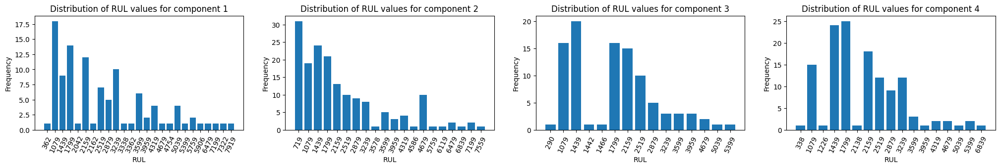

In [ ]:
def get_rul_plot(rul_values, rul_freq, ax):

  ids = np.argsort(rul_values)
  rul_values_sorted = np.sort(rul_values)
  rul_freq_sorted = []

  for idx in ids:
      rul_freq_sorted.append(rul_freq[idx])

  ax.bar(range(len(rul_values)), rul_freq_sorted)
  ax.set_xticks(ticks=range(len(rul_values)), labels=rul_values_sorted, rotation=65)
  ax.set_title(f'Distribution of RUL values for component {i+1}')
  ax.set_xlabel("RUL")
  ax.set_ylabel("Frequency")


rul_dict = {'comp1':[rul_comp1_values,rul_comp1_freq],
            'comp2':[rul_comp2_values,rul_comp2_freq],
            'comp3':[rul_comp3_values,rul_comp3_freq],
            'comp4':[rul_comp4_values,rul_comp4_freq]}

fig, ax = plt.subplots(1,4, figsize=(25,3))

for i, (k, v) in enumerate(rul_dict.items()):
  get_rul_plot(v[0], v[1], ax=ax[i])

plt.show()

Then, for each distribution of cycle duration, we calculated the 0.1 quantile, which is the value that includes the 10% of cycles. This means that the other 90% of cycles have a longer duration.

In [ ]:
# Create ad-hoc arrays for computing quantiles
repeat_rul_comp1 = np.repeat(rul_comp1_values, rul_comp1_freq)
repeat_rul_comp2 = np.repeat(rul_comp2_values, rul_comp2_freq)
repeat_rul_comp3 = np.repeat(rul_comp3_values, rul_comp3_freq)
repeat_rul_comp4 = np.repeat(rul_comp4_values, rul_comp4_freq)

q_comp1 = np.quantile(repeat_rul_comp1, 0.1)
q_comp2 = np.quantile(repeat_rul_comp2, 0.1)
q_comp3 = np.quantile(repeat_rul_comp3, 0.1)
q_comp4 = np.quantile(repeat_rul_comp4, 0.1)

print("Comp1:", q_comp1)
print("Comp2:", q_comp2)
print("Comp3:", q_comp3)
print("Comp4:", q_comp4)

Comp1: 1079.0
Comp2: 719.0
Comp3: 1079.0
Comp4: 1079.0


As a first trial, we deleted all the incomplete cycles and we analized the impact on the number of remaining failures.

In [ ]:
# Delete all initial RUL < q_compn
df_quant = df_final.copy()
q_comp = [q_comp1, q_comp2, q_comp3, q_comp4]

for i in range(4):
  ids_invalid = []
  rul_invalid = []
  comp = i+1
  ids_invalid.append(df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') &
                    (df_quant[f'max_rul_comp{comp}'] < q_comp[i]) &
                    (df_quant[f'max_rul_comp{comp}'] != -1)].index.values)
  rul_invalid.append(df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') &
                    (df_quant[f'max_rul_comp{comp}'] < q_comp[i]) &
                    (df_quant[f'max_rul_comp{comp}'] != -1)][f'max_rul_comp{comp}'])

  ids_invalid = np.concatenate(ids_invalid)
  rul_invalid = np.concatenate(rul_invalid)

  for i, id in enumerate(ids_invalid):
    df_quant.loc[id:id+rul_invalid[i], f'max_rul_comp{comp}']  = -1
    df_quant.loc[id:id+rul_invalid[i], f'fail_comp{comp}'] = 0
    df_quant.loc[id:id+rul_invalid[i], f'rul_comp{comp}'] = -1

df_quant = df_quant.reset_index(drop=True)
df_quant

,datetime,machineID,volt,rotate,pressure,vibration,model,age,fail_comp1,fail_comp2,...,rm_comp4,binary_failure,rul_comp1,max_rul_comp1,rul_comp2,max_rul_comp2,rul_comp3,max_rul_comp3,rul_comp4,max_rul_comp4
0,2015-01-01 06:00:00,1,176.217853,418.504078,113.077935,45.087686,3,18,0,0,...,0,0,1536,1536,2616,2616,-1,-1,-1,-1
1,2015-01-01 07:00:00,1,162.879223,402.747490,95.460525,43.413973,3,18,0,0,...,0,0,1535,1536,2615,2616,-1,-1,-1,-1
2,2015-01-01 08:00:00,1,170.989902,527.349825,75.237905,34.178847,3,18,0,0,...,0,0,1534,1536,2614,2616,-1,-1,-1,-1
3,2015-01-01 09:00:00,1,162.462833,346.149335,109.248561,41.122144,3,18,0,0,...,0,0,1533,1536,2613,2616,-1,-1,-1,-1
4,2015-01-01 10:00:00,1,157.610021,435.376873,111.886648,25.990511,3,18,0,0,...,0,0,1532,1536,2612,2616,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755349,2015-12-09 02:00:00,100,154.764808,362.514598,88.304637,33.997760,4,5,0,0,...,0,0,-1,-1,4,8208,-1,-1,-1,-1
755350,2015-12-09 03:00:00,100,169.520950,386.937494,110.906433,41.636435,4,5,0,0,...,0,0,-1,-1,3,8208,-1,-1,-1,-1
755351,2015-12-09 04:00:00,100,161.175695,422.498178,90.986648,44.406312,4,5,0,0,...,0,0,-1,-1,2,8208,-1,-1,-1,-1
755352,2015-12-09 05:00:00,100,182.762004,388.960329,114.030188,39.135241,4,5,0,0,...,0,0,-1,-1,1,8208,-1,-1,-1,-1


Then, as a second trial, we deleted all the incomplete cycles that were shorter than the 90% of the cycles.

In [ ]:
# Delete all initial RUL out of the range of valid RUL values

df_range = df_final.copy()

for i in range(4):
  ids_invalid = []
  rul_invalid = []
  comp = i+1
  min_rul = rul_dict[f'comp{comp}'][0].min()

  ids_invalid.append(df_range[(df_range['datetime']=='2015-01-01 06:00:00') &
                    (df_range[f'max_rul_comp{comp}'] < min_rul) &
                    (df_range[f'max_rul_comp{comp}'] != -1)].index.values)
  rul_invalid.append(df_range[(df_range['datetime']=='2015-01-01 06:00:00') &
                    (df_range[f'max_rul_comp{comp}'] < min_rul) &
                    (df_range[f'max_rul_comp{comp}'] != -1)][f'max_rul_comp{comp}'])

  ids_invalid = np.concatenate(ids_invalid)
  rul_invalid = np.concatenate(rul_invalid)

  for i, id in enumerate(ids_invalid):
    df_range.loc[id:id+rul_invalid[i], f'max_rul_comp{comp}']  = -1
    df_range.loc[id:id+rul_invalid[i], f'fail_comp{comp}'] = 0
    df_range.loc[id:id+rul_invalid[i], f'rul_comp{comp}'] = -1

df_range = df_range.reset_index(drop=True)
df_range

,datetime,machineID,volt,rotate,pressure,vibration,model,age,fail_comp1,fail_comp2,...,rm_comp4,binary_failure,rul_comp1,max_rul_comp1,rul_comp2,max_rul_comp2,rul_comp3,max_rul_comp3,rul_comp4,max_rul_comp4
0,2015-01-01 06:00:00,1,176.217853,418.504078,113.077935,45.087686,3,18,0,0,...,0,0,1536,1536,2616,2616,-1,-1,-1,-1
1,2015-01-01 07:00:00,1,162.879223,402.747490,95.460525,43.413973,3,18,0,0,...,0,0,1535,1536,2615,2616,-1,-1,-1,-1
2,2015-01-01 08:00:00,1,170.989902,527.349825,75.237905,34.178847,3,18,0,0,...,0,0,1534,1536,2614,2616,-1,-1,-1,-1
3,2015-01-01 09:00:00,1,162.462833,346.149335,109.248561,41.122144,3,18,0,0,...,0,0,1533,1536,2613,2616,-1,-1,-1,-1
4,2015-01-01 10:00:00,1,157.610021,435.376873,111.886648,25.990511,3,18,0,0,...,0,0,1532,1536,2612,2616,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755349,2015-12-09 02:00:00,100,154.764808,362.514598,88.304637,33.997760,4,5,0,0,...,0,0,-1,-1,4,8208,-1,-1,-1,-1
755350,2015-12-09 03:00:00,100,169.520950,386.937494,110.906433,41.636435,4,5,0,0,...,0,0,-1,-1,3,8208,-1,-1,-1,-1
755351,2015-12-09 04:00:00,100,161.175695,422.498178,90.986648,44.406312,4,5,0,0,...,0,0,-1,-1,2,8208,-1,-1,-1,-1
755352,2015-12-09 05:00:00,100,182.762004,388.960329,114.030188,39.135241,4,5,0,0,...,0,0,-1,-1,1,8208,-1,-1,-1,-1


In [ ]:
# Extract RUL values of the 2015-01-01 06:00:00
first_ruls_comp1_quant = df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') & (df_quant['max_rul_comp1']!=-1)]['max_rul_comp1'].value_counts()
first_ruls_comp2_quant = df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') & (df_quant['max_rul_comp2']!=-1)]['max_rul_comp2'].value_counts()
first_ruls_comp3_quant = df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') & (df_quant['max_rul_comp3']!=-1)]['max_rul_comp3'].value_counts()
first_ruls_comp4_quant = df_quant[(df_quant['datetime']=='2015-01-01 06:00:00') & (df_quant['max_rul_comp4']!=-1)]['max_rul_comp4'].value_counts()

first_ruls_comp1_range = df_range[(df_range['datetime']=='2015-01-01 06:00:00') & (df_range['max_rul_comp1']!=-1)]['max_rul_comp1'].value_counts()
first_ruls_comp2_range = df_range[(df_range['datetime']=='2015-01-01 06:00:00') & (df_range['max_rul_comp2']!=-1)]['max_rul_comp2'].value_counts()
first_ruls_comp3_range = df_range[(df_range['datetime']=='2015-01-01 06:00:00') & (df_range['max_rul_comp3']!=-1)]['max_rul_comp3'].value_counts()
first_ruls_comp4_range = df_range[(df_range['datetime']=='2015-01-01 06:00:00') & (df_range['max_rul_comp4']!=-1)]['max_rul_comp4'].value_counts()

print('Number of old RULs starting on 2015-01-01 06:00:00:')
print('Comp1', len(first_ruls_comp1.index.unique()))
print('Comp2', len(first_ruls_comp2.index.unique()))
print('Comp3', len(first_ruls_comp3.index.unique()))
print('Comp4', len(first_ruls_comp4.index.unique()))
print('Number of old total failures:')
print('Comp1', df_final['fail_comp1'].sum())
print('Comp2', df_final['fail_comp2'].sum())
print('Comp3', df_final['fail_comp3'].sum())
print('Comp4', df_final['fail_comp4'].sum())
print()
print('Number of new RULs starting on 2015-01-01 06:00:00 after dropping initial RUL < q(0.1):')
print('Comp1', len(first_ruls_comp1_quant.index.unique()))
print('Comp2', len(first_ruls_comp2_quant.index.unique()))
print('Comp3', len(first_ruls_comp3_quant.index.unique()))
print('Comp4', len(first_ruls_comp4_quant.index.unique()))
print('Number of total failures after dropping initial RUL < q(0.1):')
print('Comp1', df_quant['fail_comp1'].sum())
print('Comp2', df_quant['fail_comp2'].sum())
print('Comp3', df_quant['fail_comp3'].sum())
print('Comp4', df_quant['fail_comp4'].sum())
print()
print('Number of new RULs starting on 2015-01-01 06:00:00 after dropping initial RUL < min_valid_rul:')
print('Comp1', len(first_ruls_comp1_range.index.unique()))
print('Comp2', len(first_ruls_comp2_range.index.unique()))
print('Comp3', len(first_ruls_comp3_range.index.unique()))
print('Comp4', len(first_ruls_comp4_range.index.unique()))
print('Number of total failures after dropping initial RUL < min_valid_rul:')
print('Comp1', df_range['fail_comp1'].sum())
print('Comp2', df_range['fail_comp2'].sum())
print('Comp3', df_range['fail_comp3'].sum())
print('Comp4', df_range['fail_comp4'].sum())

Number of old RULs starting on 2015-01-01 06:00:00:
Comp1 66
Comp2 74
Comp3 27
Comp4 40
Number of old total failures:
Comp1 192
Comp2 259
Comp3 131
Comp4 179

Number of new RULs starting on 2015-01-01 06:00:00 after dropping initial RUL < q(0.1):
Comp1 46
Comp2 56
Comp3 12
Comp4 21
Number of total failures after dropping initial RUL < q(0.1):
Comp1 157
Comp2 230
Comp3 111
Comp4 152

Number of new RULs starting on 2015-01-01 06:00:00 after dropping initial RUL < min_valid_rul:
Comp1 61
Comp2 56
Comp3 24
Comp4 35
Number of total failures after dropping initial RUL < min_valid_rul:
Comp1 176
Comp2 230
Comp3 126
Comp4 171


Comparing the two situations, we decided to only drop those cases that were shorter than the 90% of the total number of cycles, as not to lose too much information.

In [ ]:
# Choose which strategy to apply

df_final = df_range.copy()

In [ ]:
# Fix binary failure
df_final.loc[(df_final['fail_comp1']==0) & (df_final['fail_comp2']==0) & (df_final['fail_comp3']==0) & (df_final['fail_comp4']==0), 'binary_failure'] = 0

# Sanity check
df_final.loc[(df_final['fail_comp1']==0) & (df_final['fail_comp2']==0) & (df_final['fail_comp3']==0) & (df_final['fail_comp4']==0), 'binary_failure'].unique()

array([0])

In [ ]:
# Drop rows with no rul
print("Before:", df_final.shape)

df_final.drop((df_final[(df_final.rul_comp1 == -1) & (df_final.rul_comp2 == -1) &
                        (df_final.rul_comp3 == -1) & (df_final.rul_comp4 == -1)].index), inplace=True)

df_final = df_final.reset_index(drop=True)
print("After:", df_final.shape)

Before: (755354, 30)
After: (754443, 30)


# Data visualization


## Data Inspection


Let's check the total number of failures

In [ ]:
fail = df_final['fail_comp1'].sum()+df_final['fail_comp2'].sum()+df_final['fail_comp3'].sum()+df_final['fail_comp4'].sum()
not_fail = df_final.shape[0]-df_final.binary_failure.sum()

print('Failures:', fail)
print('Not failures:', not_fail)

Failures: 703
Not failures: 753776


Checking the distribution of the failures for each single component

Text(0.5, 1.0, 'Number of failures per component')

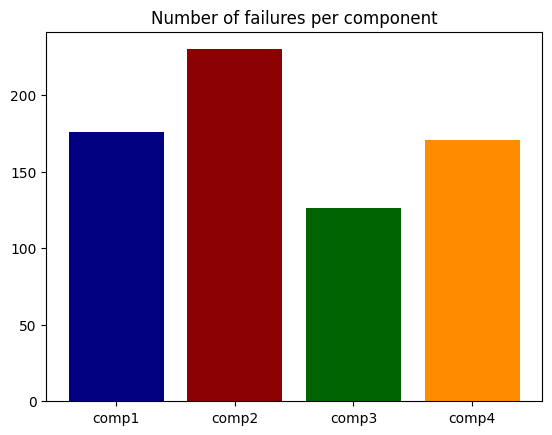

In [ ]:
x = [1,2,3,4]
y = [df_final['fail_comp1'].sum(), df_final['fail_comp2'].sum(), df_final['fail_comp3'].sum(), df_final['fail_comp4'].sum()]

labels = ['comp1','comp2','comp3','comp4']

plt.bar(x, y, tick_label=labels, color = ['navy','darkred','darkgreen','darkorange'])
plt.title('Number of failures per component')

In [ ]:
print('Number of machines:', len(df_final['machineID'].unique()))

Number of machines: 98


Each machine can be of 4 different models

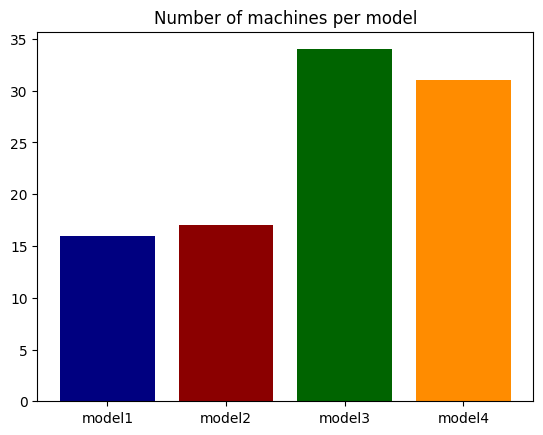

In [ ]:
x = [1,2,3,4]
y = df_final.groupby(['model'])['machineID'].nunique().values
labels = ['model1','model2', 'model3','model4']

plt.bar(x, y, tick_label=labels, color = ['navy','darkred','darkgreen','darkorange'])
plt.title('Number of machines per model')
plt.show()

Let's inspect how the mean and the standard deviation of each feature  change with respect to the models of the machines.

It can be noticed that there is no significant difference

In [ ]:
df_m1 = df_final[(df_final['model'] == 1)].reset_index(drop=True)
df_m2 = df_final[(df_final['model'] == 2)].reset_index(drop=True)
df_m3 = df_final[(df_final['model'] == 3)].reset_index(drop=True)
df_m4 = df_final[(df_final['model'] == 4)].reset_index(drop=True)

columns = ['volt',	'rotate', 'pressure', 'vibration', 'age']
# model 1
bf_0_m1 = df_m1[df_m1['binary_failure'] == 0]
bf_1_m1 = df_m1[df_m1['binary_failure'] == 1]
bf_0_means_m1 = round(bf_0_m1[columns].mean(),2)
bf_1_means_m1 = round(bf_1_m1[columns].mean(),2)
bf_0_stds_m1 = round(bf_0_m1[columns].std(),2)
bf_1_stds_m1 = round(bf_1_m1[columns].std(),2)

bf_0_m2 = df_m2[df_m2['binary_failure'] == 0]
bf_1_m2 = df_m2[df_m2['binary_failure'] == 1]
bf_0_means_m2 = round(bf_0_m2[columns].mean(),2)
bf_1_means_m2 = round(bf_1_m2[columns].mean(),2)
bf_0_stds_m2 = round(bf_0_m2[columns].std(),2)
bf_1_stds_m2 = round(bf_1_m2[columns].std(),2)

bf_0_m3 = df_m3[df_m3['binary_failure'] == 0]
bf_1_m3 = df_m3[df_m3['binary_failure'] == 1]
bf_0_means_m3 = round(bf_0_m3[columns].mean(),2)
bf_1_means_m3 = round(bf_1_m3[columns].mean(),2)
bf_0_stds_m3 = round(bf_0_m3[columns].std(),2)
bf_1_stds_m3 = round(bf_1_m3[columns].std(),2)

bf_0_m4 = df_m4[df_m4['binary_failure'] == 0]
bf_1_m4 = df_m4[df_m4['binary_failure'] == 1]
bf_0_means_m4 = round(bf_0_m4[columns].mean(),2)
bf_1_means_m4 = round(bf_1_m4[columns].mean(),2)
bf_0_stds_m4 = round(bf_0_m4[columns].std(),2)
bf_1_stds_m4 = round(bf_1_m4[columns].std(),2)


for i in range(bf_0_means_m4.shape[0]):

  print(f'\n                                 {columns[i]}')
  print('                     bf = 0         |         bf = 1')
  print('               mean         stdev   |    mean         stdev')
  print(f'model 1:       {bf_0_means_m1[i]}        {bf_0_stds_m1[i]}  |     {bf_1_means_m1[i]}       {bf_1_stds_m1[i]}')
  print(f'model 2:       {bf_0_means_m2[i]}        {bf_0_stds_m2[i]}   |     {bf_1_means_m2[i]}       {bf_1_stds_m2[i]}')
  print(f'model 3:       {bf_0_means_m3[i]}         {bf_0_stds_m3[i]}  |     {bf_1_means_m3[i]}       {bf_1_stds_m3[i]}')
  print(f'model 4:       {bf_0_means_m4[i]}        {bf_0_stds_m4[i]}   |     {bf_1_means_m4[i]}       {bf_1_stds_m4[i]}')


                                 volt
                     bf = 0         |         bf = 1
               mean         stdev   |    mean         stdev
model 1:       170.79        15.57  |     173.86       18.71
model 2:       170.76        15.51   |     176.44       18.24
model 3:       170.88         15.51  |     176.57       18.68
model 4:       170.8        15.5   |     175.29       17.45

                                 rotate
                     bf = 0         |         bf = 1
               mean         stdev   |    mean         stdev
model 1:       446.49        52.86  |     428.66       60.36
model 2:       446.68        52.59   |     435.57       56.57
model 3:       446.18         52.9  |     417.33       69.04
model 4:       446.61        52.63   |     409.08       64.53

                                 pressure
                     bf = 0         |         bf = 1
               mean         stdev   |    mean         stdev
model 1:       101.3        11.51  |     111.83

Let's inspect how the mean and the standard deviation of each feature change with respect to the components of the machines.

From this analysis it can be noticed that there is a high correlation between a component and a feature. This means that when the value of a certain feature is paricularly high or low there is also a higher probablity that the correspinding component is going to fail.

The correlations are between:



*   Component 1 and Volt
*   Component 2 and Rotate
*   Component 3 and Pressure
*   Component 4 and Vibration



In [ ]:
df_c1 = df_final[(df_final['fail_comp1'] != 0)].reset_index(drop=True)
df_c2 = df_final[(df_final['fail_comp2'] != 0)].reset_index(drop=True)
df_c3 = df_final[(df_final['fail_comp3'] != 0)].reset_index(drop=True)
df_c4 = df_final[(df_final['fail_comp4'] != 0)].reset_index(drop=True)
df_no_fail = df_final[(df_final['binary_failure'] == 0)].reset_index(drop=True)

columns = ['volt',	'rotate', 'pressure', 'vibration', 'age']
# model 1
no_fail_means = round(df_no_fail[columns].mean(),2)
no_fail_stds = round(df_no_fail[columns].std(),2)

c1_means = round(df_c1[columns].mean(),2)
c1_stds = round(df_c1[columns].std(),2)

c2_means = round(df_c2[columns].mean(),2)
c2_stds = round(df_c2[columns].std(),2)

c3_means = round(df_c3[columns].mean(),2)
c3_stds = round(df_c3[columns].std(),2)

c4_means = round(df_c4[columns].mean(),2)
c4_stds = round(df_c4[columns].std(),2)


for i in range(c1_means.shape[0]):

  print(f'\n                                 {columns[i]}')
  print('                     failed         |         no failed')
  print('               mean         stdev   |    mean         stdev')
  print(f'comp 1:       {c1_means[i]}        {c1_stds[i]}   |     {no_fail_means[i]}       {no_fail_stds[i]}')
  print(f'comp 2:       {c2_means[i]}        {c2_stds[i]}   |     {no_fail_means[i]}       {no_fail_stds[i]}')
  print(f'comp 3:       {c3_means[i]}         {c3_stds[i]}  |     {no_fail_means[i]}       {no_fail_stds[i]}')
  print(f'comp 4:       {c4_means[i]}        {c4_stds[i]}   |     {no_fail_means[i]}       {no_fail_stds[i]}')


                                 volt
                     failed         |         no failed
               mean         stdev   |    mean         stdev
comp 1:       190.21        16.77   |     170.82       15.52
comp 2:       169.51        16.08   |     170.82       15.52
comp 3:       172.6         17.45  |     170.82       15.52
comp 4:       170.89        15.76   |     170.82       15.52

                                 rotate
                     failed         |         no failed
               mean         stdev   |    mean         stdev
comp 1:       450.28        57.56   |     446.46       52.75
comp 2:       370.77        49.55   |     446.46       52.75
comp 3:       445.42         46.71  |     446.46       52.75
comp 4:       442.67        56.53   |     446.46       52.75

                                 pressure
                     failed         |         no failed
               mean         stdev   |    mean         stdev
comp 1:       100.86        12.42   |     

Let's inspect how the mean and the standard deviation of each feature change with respect to the errors of the components.

In [ ]:
df_no_err = df_final[(df_final['error1'] == 0) & (df_final['error2'] == 0) & (df_final['error3'] == 0) &
                     (df_final['error4'] == 0) & (df_final['error5'] == 0)].reset_index(drop=True)
df_e1 = df_final[(df_final['error1'] == 1)].reset_index(drop=True)
df_e2 = df_final[(df_final['error2'] == 1)].reset_index(drop=True)
df_e3 = df_final[(df_final['error3'] == 1)].reset_index(drop=True)
df_e4 = df_final[(df_final['error4'] == 1)].reset_index(drop=True)
df_e5 = df_final[(df_final['error5'] == 1)].reset_index(drop=True)

columns = ['volt',	'rotate', 'pressure', 'vibration', 'age']
# model 1
failure = 'fail_comp4'

bf_0_no_err = df_no_err[df_no_err[failure] == 0]
bf_1_no_err = df_no_err[df_no_err[failure] == 1]
no_err_means_0 = round(bf_0_no_err[columns].mean(),2)
no_err_stds_0 = round(bf_0_no_err[columns].std(),2)
no_err_means_1 = round(bf_1_no_err[columns].mean(),2)
no_err_stds_1 = round(bf_1_no_err[columns].std(),2)

bf_0_e1 = df_e1[df_e1[failure] == 0]
bf_1_e1 = df_e1[df_e1[failure] == 1]
e1_means_0 = round(bf_0_e1[columns].mean(),2)
e1_stds_0 = round(bf_0_e1[columns].std(),2)
e1_means_1 = round(bf_1_e1[columns].mean(),2)
e1_stds_1 = round(bf_1_e1[columns].std(),2)

bf_0_e2 = df_e2[df_e2[failure] == 0]
bf_1_e2 = df_e2[df_e2[failure] == 1]
e2_means_0 = round(bf_0_e2[columns].mean(),2)
e2_stds_0 = round(bf_0_e2[columns].std(),2)
e2_means_1 = round(bf_1_e2[columns].mean(),2)
e2_stds_1 = round(bf_1_e2[columns].std(),2)

bf_0_e3 = df_e3[df_e3[failure] == 0]
bf_1_e3 = df_e3[df_e3[failure] == 1]
e3_means_0 = round(bf_0_e3[columns].mean(),2)
e3_stds_0 = round(bf_0_e3[columns].std(),2)
e3_means_1 = round(bf_1_e3[columns].mean(),2)
e3_stds_1 = round(bf_1_e3[columns].std(),2)

bf_0_e4 = df_e4[df_e4[failure] == 0]
bf_1_e4 = df_e4[df_e4[failure] == 1]
e4_means_0 = round(bf_0_e4[columns].mean(),2)
e4_stds_0 = round(bf_0_e4[columns].std(),2)
e4_means_1 = round(bf_1_e4[columns].mean(),2)
e4_stds_1 = round(bf_1_e4[columns].std(),2)

bf_0_e5 = df_e5[df_e5[failure] == 0]
bf_1_e5 = df_e5[df_e5[failure] == 1]
e5_means_0 = round(bf_0_e5[columns].mean(),2)
e5_stds_0 = round(bf_0_e5[columns].std(),2)
e5_means_1 = round(bf_1_e5[columns].mean(),2)
e5_stds_1 = round(bf_1_e5[columns].std(),2)


for i in range(e5_means_0.shape[0]):

  print(f'\n                                  {columns[i]}')
  print('                   no failed         |         failed')
  print('                mean         stdev   |    mean         stdev')
  print(f'error 0:       {no_err_means_0[i]}        {no_err_stds_0[i]}   |     {no_err_means_1[i]}       {no_err_stds_1[i]}')
  print(f'error 1:       {e1_means_0[i]}        {e1_stds_0[i]}   |     {e1_means_1[i]}       {e1_stds_1[i]}')
  print(f'error 2:       {e2_means_0[i]}         {e2_stds_0[i]}  |     {e2_means_1[i]}       {e2_stds_1[i]}')
  print(f'error 3:       {e3_means_0[i]}        {e3_stds_0[i]}   |     {e3_means_1[i]}       {e3_stds_1[i]}')
  print(f'error 4:       {e4_means_0[i]}         {e4_stds_0[i]}  |     {e4_means_1[i]}       {e4_stds_1[i]}')
  print(f'error 5:       {e5_means_0[i]}        {e5_stds_0[i]}   |     {e5_means_1[i]}       {e5_stds_1[i]}')


                                  volt
                   no failed         |         failed
                mean         stdev   |    mean         stdev
error 0:       170.81        15.52   |     170.87       15.8
error 1:       175.05        18.19   |     173.52       nan
error 2:       170.86         15.58  |     nan       nan
error 3:       171.98        14.91   |     nan       nan
error 4:       171.18         15.93  |     nan       nan
error 5:       172.22        15.65   |     nan       nan

                                  rotate
                   no failed         |         failed
                mean         stdev   |    mean         stdev
error 0:       446.47        52.75   |     442.28       56.46
error 1:       443.47        54.54   |     509.31       nan
error 2:       427.66         64.78  |     nan       nan
error 3:       418.83        61.81   |     nan       nan
error 4:       442.83         52.66  |     nan       nan
error 5:       438.38        56.17   |     nan

Let's check if some features are correlated.

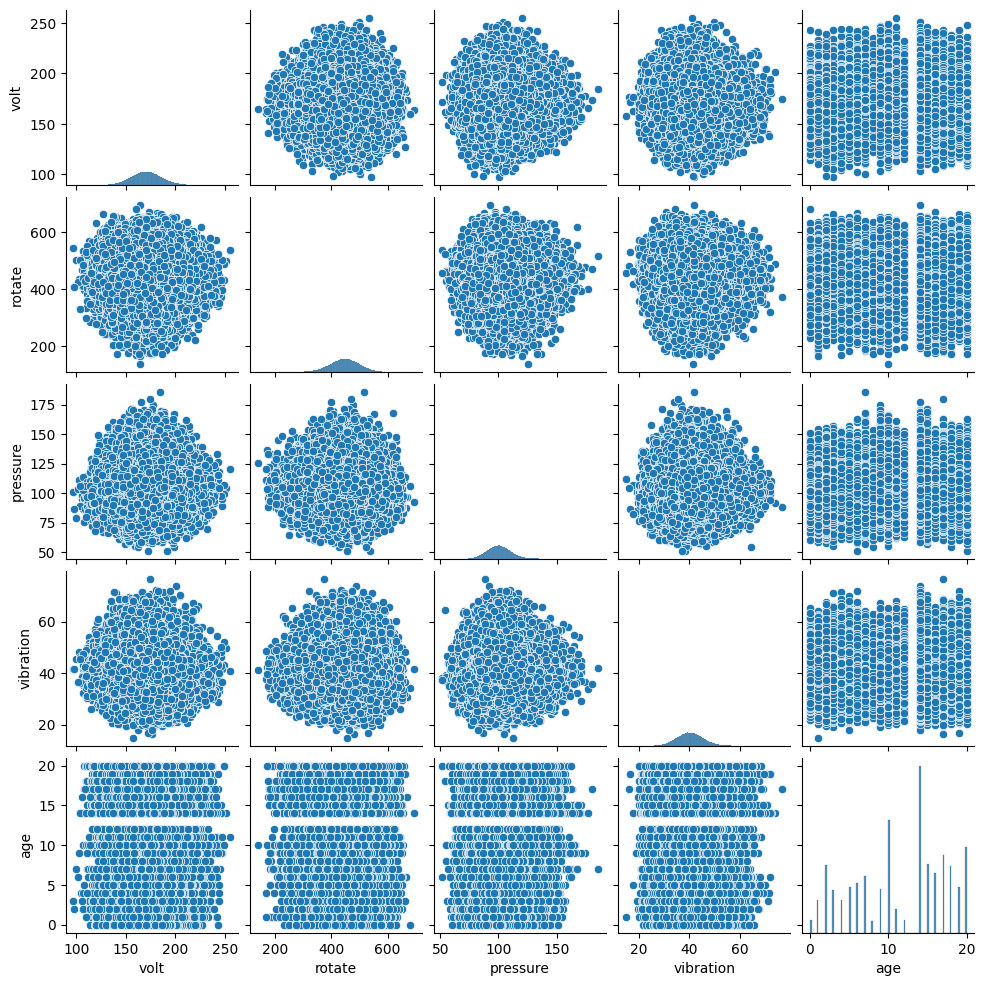

In [ ]:
sns.pairplot(df_final[df_final['binary_failure'] == 0][columns], height=2, aspect=1)

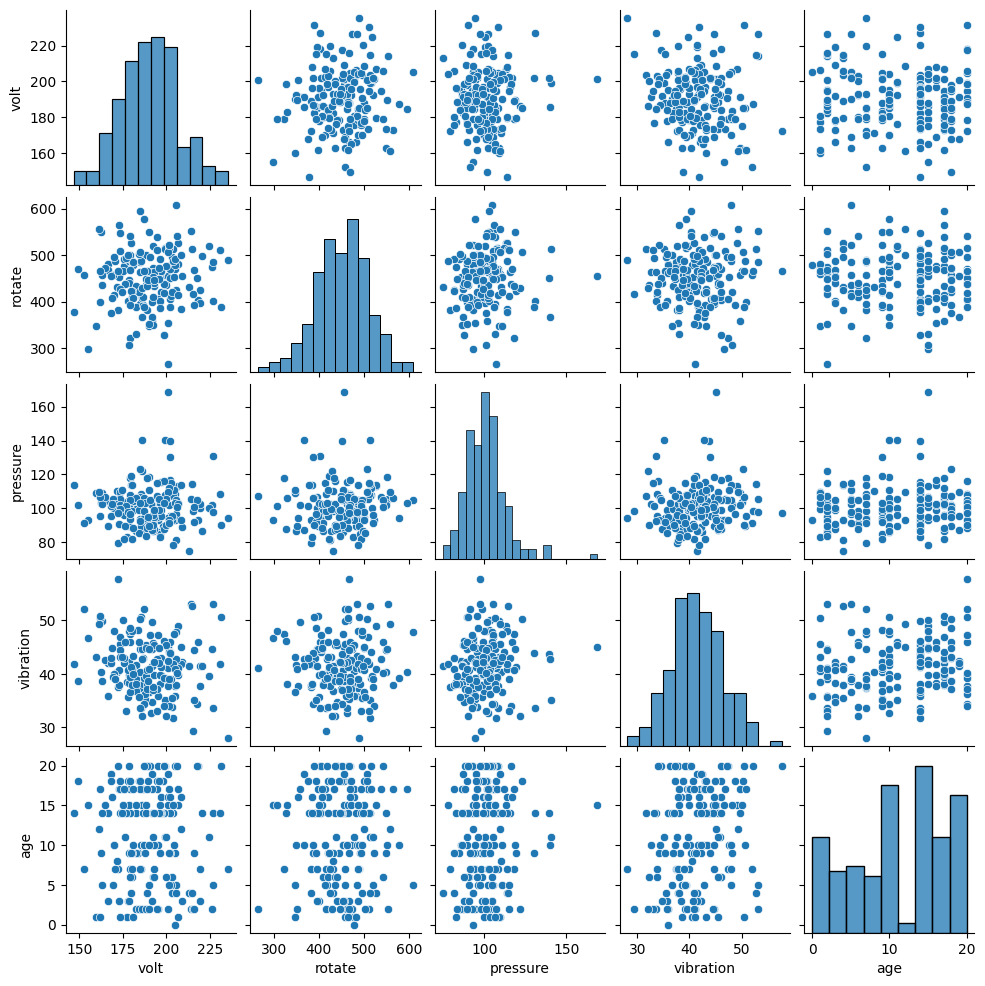

In [ ]:
sns.pairplot(df_final[df_final['fail_comp1'] == 1][columns], height=2, aspect=1)

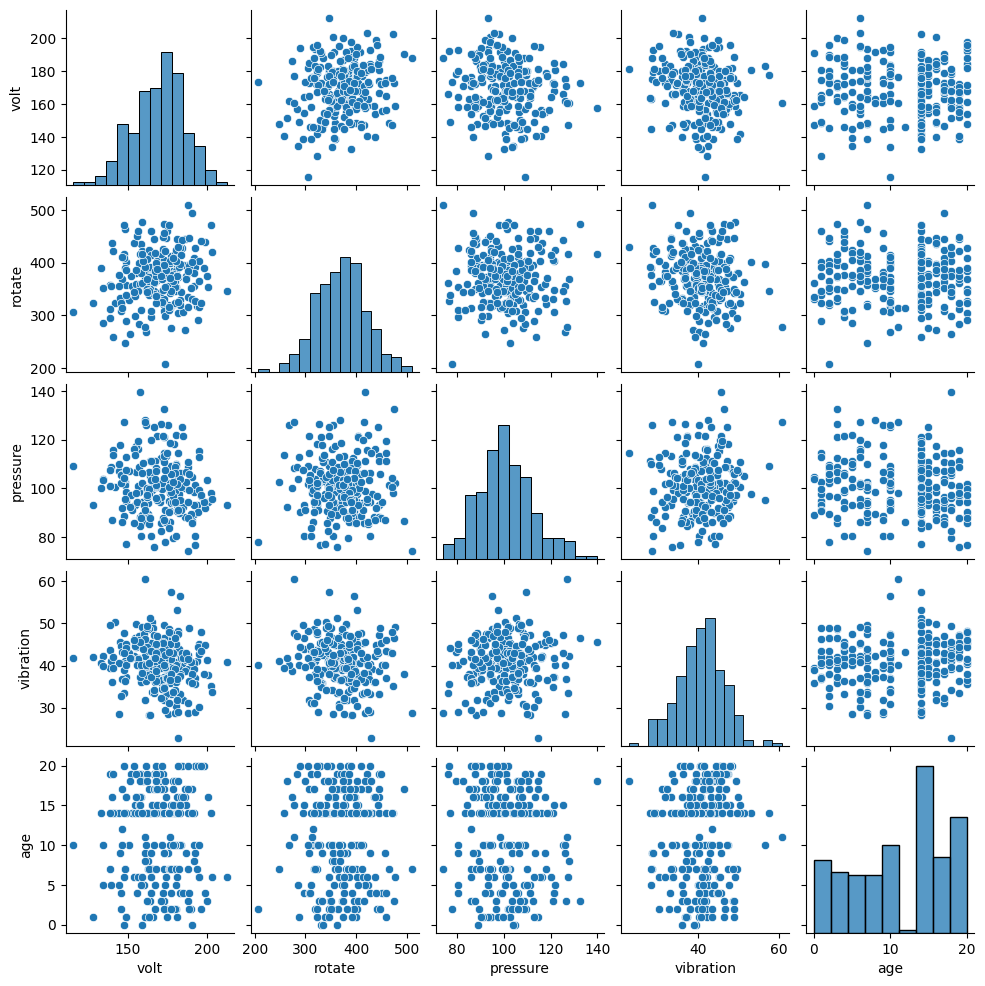

In [ ]:
sns.pairplot(df_final[df_final['fail_comp2'] == 1][columns], height=2, aspect=1)

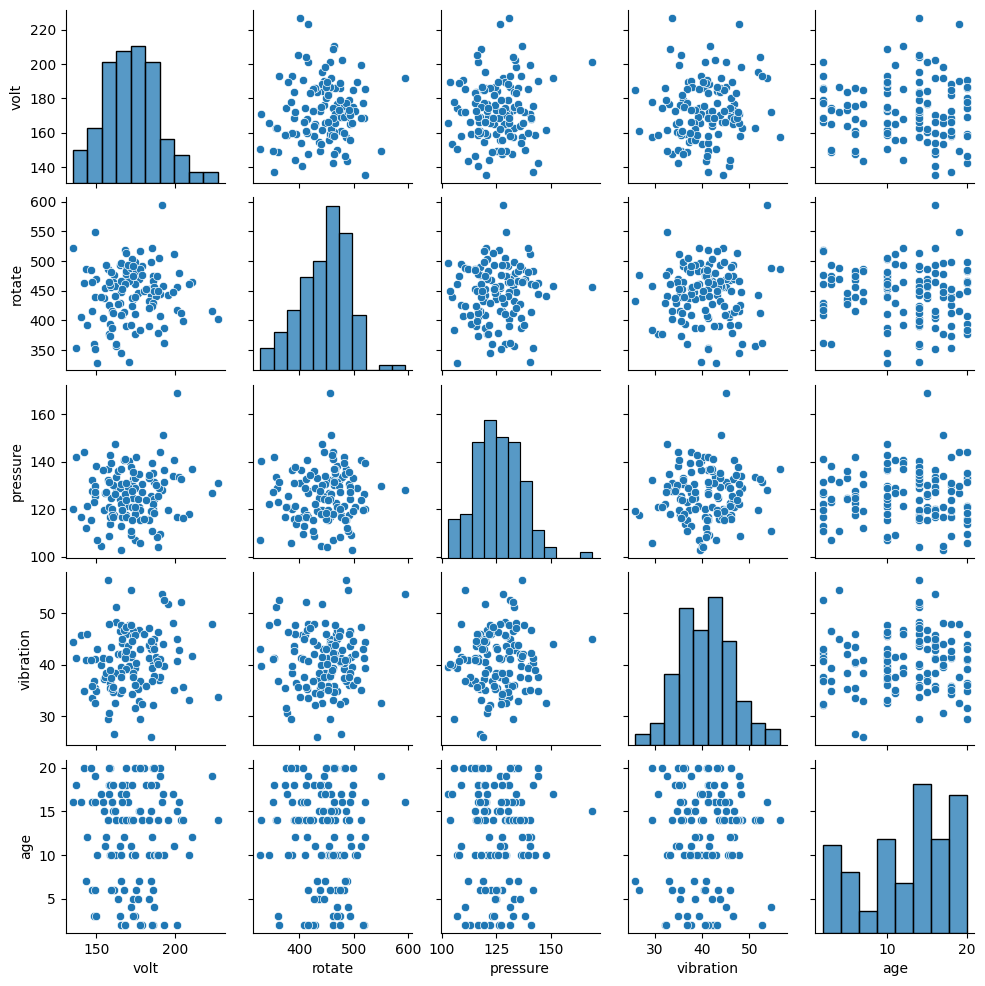

In [ ]:
sns.pairplot(df_final[df_final['fail_comp3'] == 1][columns], height=2, aspect=1)

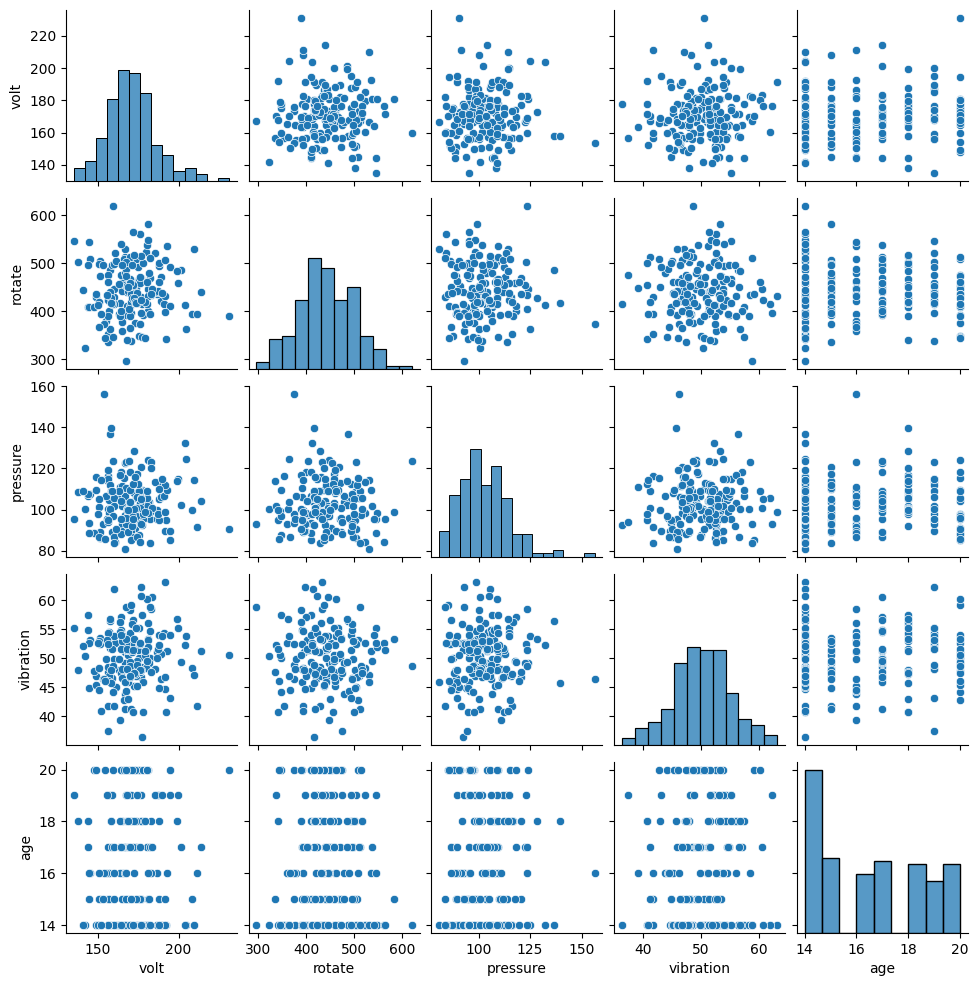

In [ ]:
sns.pairplot(df_final[df_final['fail_comp4'] == 1][columns], height=2, aspect=1)

Let's check the difference of the distributions of the features for the differnet failed and not failed components.

It can be noted that for the correlated features and components the mean of the distributions is shifted.

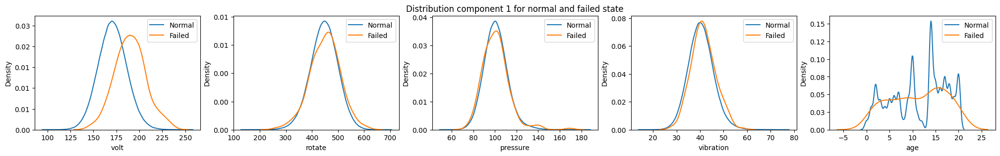

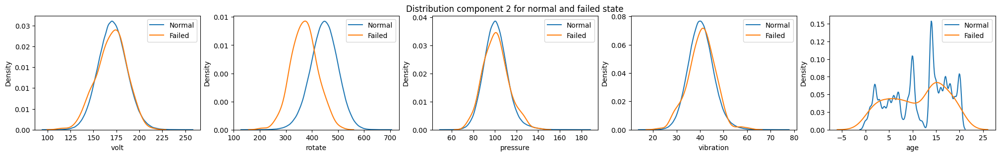

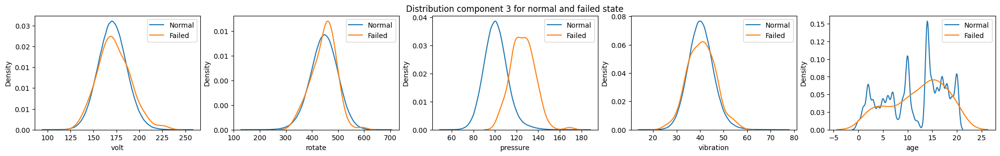

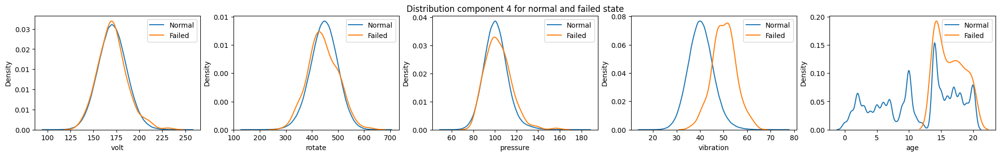

In [ ]:
def get_distrib_plot(sensor, df, comp, ax):

    # sensor values corrensponding machine status Normal
    match comp:
      case 1:
        normal = df[df['fail_comp1']==0][sensor].values # sensor values corrensponding machine status Normal
        broken = df[df['fail_comp1']==1][sensor].values # sensor values corrensponding machine status Broken
      case 2:
        normal = df[df['fail_comp2']==0][sensor].values # sensor values corrensponding machine status Normal
        broken = df[df['fail_comp2']==1][sensor].values # sensor values corrensponding machine status Broken
      case 3:
        normal = df[df['fail_comp3']==0][sensor].values # sensor values corrensponding machine status Normal
        broken = df[df['fail_comp3']==1][sensor].values # sensor values corrensponding machine status Broken
      case 4:
        normal = df[df['fail_comp4']==0][sensor].values # sensor values corrensponding machine status Normal
        broken = df[df['fail_comp4']==1][sensor].values # sensor values corrensponding machine status Broken


    #plt.figure(figsize=(10,3))
    sns.kdeplot(normal,  label="Normal", common_norm =False, ax=ax)# distribution for normal state
    sns.kdeplot(broken,  label="Failed", common_norm =False, ax=ax)# distribution for broken state
    ax.set_xlabel(f'{sensor}')
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.legend()


for i in range(1,5):
  fig, ax = plt.subplots(1,5, figsize=(25,3))
  for j, feature in enumerate(columns):
    get_distrib_plot(feature, df_final, comp = i, ax=ax[j])
  ax[2].set_title(f'Distribution component {i} for normal and failed state')
  plt.show()

In [ ]:
def plot_dataframe(data, labels=None, vmin=-1.96, vmax=1.96,
        figsize=None, s=4, columns = None):
    plt.figure(figsize=figsize)
    plt.imshow(data.T.iloc[:, :], aspect='auto',
            cmap='RdBu', vmin=vmin, vmax=vmax)
    if labels is not None:
        # nonzero = data.index[labels != 0]
        ncol = len(data.columns)
        lvl = - 0.05 * ncol
        # plt.scatter(nonzero, lvl*np.ones(len(nonzero)),
        #         s=s, color='tab:orange')
        plt.scatter(labels.index, np.ones(len(labels)) * lvl,
                s=s,
                color=plt.get_cmap('tab10')(np.mod(labels, 10)))
        plt.yticks(range(len(columns)), columns)
    plt.tight_layout()

In [ ]:
def standardise_data(df):

  columns = ['volt', 'rotate', 'pressure', 'vibration', 'age']
  trmean = df[columns].mean()
  trstd = df[columns].std().replace(to_replace=0, value=1) # handle static fields

  df_st = df.copy()
  df_st[columns] = (df[columns] - trmean) / trstd

  for comp in range(1,5):

    trmaxrul = df[f'rul_comp{comp}'].max()

    df_st[f'rul_comp{comp}'] = df[f'rul_comp{comp}'] / trmaxrul
    df_st[f'rul_comp{comp}'] = np.where(df_st[f'rul_comp{comp}'] < 0, -1, df_st[f'rul_comp{comp}'])


  return df_st

In [ ]:
df_st = standardise_data(df_final)

### Component 1

Let's inspect the values of the features over the cycles of a single machine for the first component.

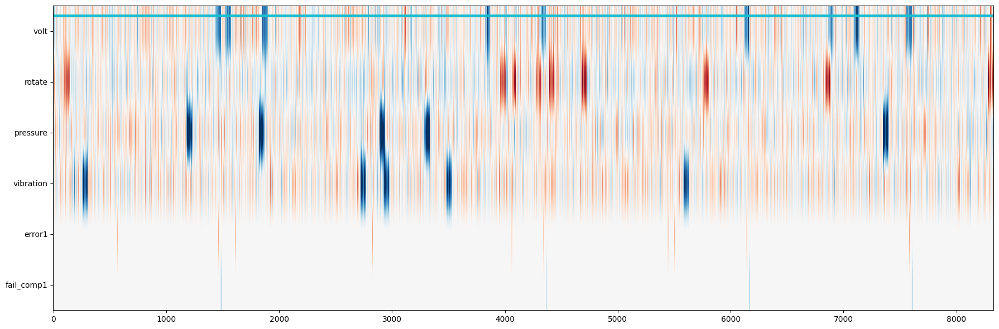

In [ ]:
comp = 1
columns = ['volt', 'rotate', 'pressure', 'vibration', 'error1', f'fail_comp{comp}']

machine = df_st[(df_st['machineID']==9)].reset_index(drop=True)
machine[f'fail_comp{comp}'] = np.where(machine[f'fail_comp{comp}'] == 1, machine[columns].max().max(), 0)
machine['error1'] = np.where(machine['error1'] != 0, machine[columns].min().min(), 0)

plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Component 2

Let's inspect the values of the features over the cycles of a single machine for the second component.

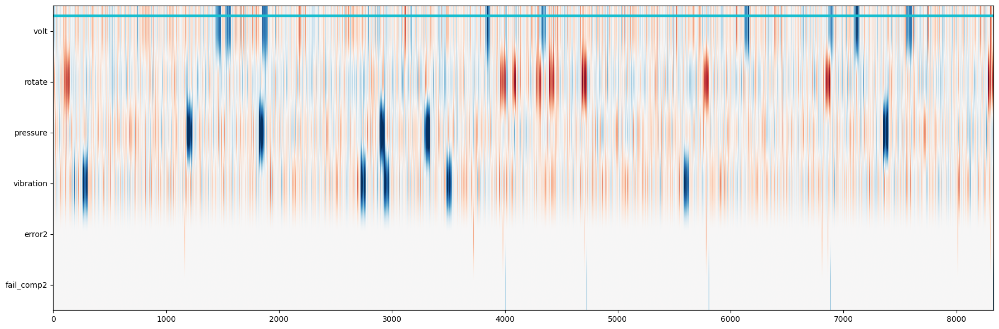

In [ ]:
comp = 2
columns = ['volt', 'rotate', 'pressure', 'vibration', 'error2', f'fail_comp{comp}']

machine = df_st[(df_st['machineID']==9)].reset_index(drop=True)
machine[f'fail_comp{comp}'] = np.where(machine[f'fail_comp{comp}'] == 1, machine[columns].max().max(), 0)
machine['error2'] = np.where(machine['error2'] != 0, machine[columns].min().min(), 0)

plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Component 3

Let's inspect the values of the features over the cycles of a single machine for the third component.

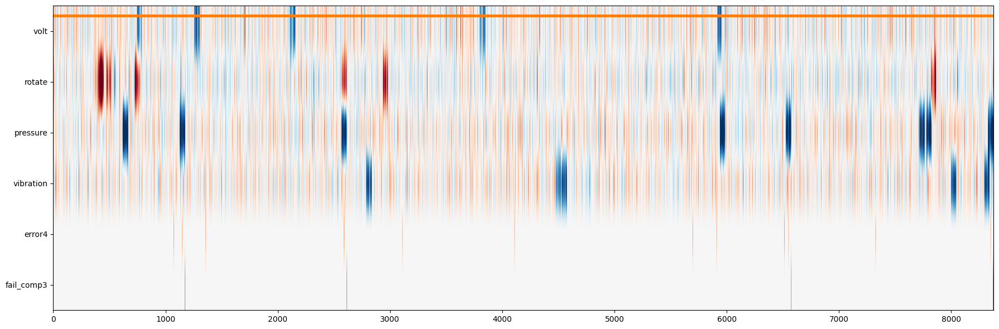

In [ ]:
comp = 3
columns = ['volt', 'rotate', 'pressure', 'vibration', 'error4', f'fail_comp{comp}']

machine = df_st[(df_st['machineID']==11)].reset_index(drop=True)
machine[f'fail_comp{comp}'] = np.where(machine[f'fail_comp{comp}'] == 1, machine[columns].max().max(), 0)
machine['error4'] = np.where(machine['error4'] != 0, machine[columns].min().min(), 0)

plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Component 4

Let's inspect the values of the features over the cycles of a single machine for the fourth component.

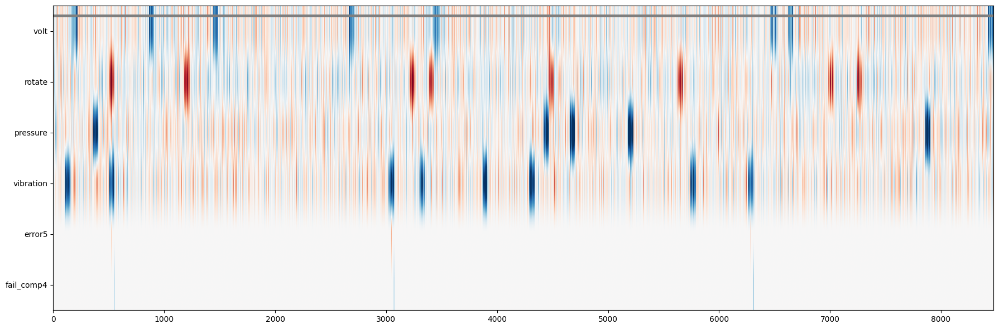

In [ ]:
comp = 4
columns = ['volt', 'rotate', 'pressure', 'vibration', 'error5', f'fail_comp{comp}']

machine = df_st[(df_st['machineID']==7)].reset_index(drop=True)
machine[f'fail_comp{comp}'] = np.where(machine[f'fail_comp{comp}'] == 1, machine[columns].max().max(), 0)
machine['error5'] = np.where(machine['error5'] != 0, machine[columns].min().min(), 0)

plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

## Data aggregation

Let's analyze how the distribution of the data changes aggreagating the values of the features considening intervals of 6, 12, 24 and 48 hours.

Indeed data aggragation can help with:

1. **Generalization**: Aggregating data can help improve the generalization ability of your NN. When you have a lot of data points that are very similar, training on the aggregated data can help the network learn a more robust representation that generalizes better to unseen examples.

2. **Data Imbalance**: If your dataset has class imbalances, aggregating data from underrepresented classes can help balance the training data, preventing the NN from being biased towards the majority class.

3. **Computation and Memory Efficiency**: Aggregating data can reduce the computational and memory requirements for training a neural network. This can be especially important when working with limited computational resources.

In [ ]:
df_agg = df_st.copy()
df_agg = df_agg.drop(['rm_comp1', 'rm_comp2', 'rm_comp3', 'rm_comp4',
                      'rul_comp1', 'max_rul_comp1', 'rul_comp2', 'max_rul_comp2',
                      'rul_comp3', 'max_rul_comp3', 'rul_comp4', 'max_rul_comp4'], axis = 1)

### Aggregation 6H

Aggregating and inspecting the data in intervals of 6 hours



In [ ]:
df_agg_6 = df_agg.reset_index(drop=True).groupby('machineID').resample('6H', on='datetime').agg({'volt':'mean',
                                                                                'rotate':'mean',
                                                                                'pressure':'mean',
                                                                                'vibration':'mean',
                                                                                'age':'mean',
                                                                                'model':'mean',
                                                                                'binary_failure':'sum',
                                                                                'fail_comp1':'sum',
                                                                                'fail_comp2':'sum',
                                                                                'fail_comp3':'sum',
                                                                                'fail_comp4':'sum',
                                                                                'error1': 'sum',
                                                                                'error2': 'sum',
                                                                                'error3': 'sum',
                                                                                'error4': 'sum',
                                                                                'error5': 'sum'}).reset_index()
df_agg_6

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01 06:00:00,-0.239028,-0.373324,-0.066390,-0.525338,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-01 12:00:00,-0.257476,-0.252315,0.350142,0.073846,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-01 18:00:00,-0.130555,0.288720,-0.921464,0.252019,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-02 00:00:00,0.346949,0.241279,-0.836268,0.182341,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-02 06:00:00,-0.157612,-0.276189,-0.026967,-0.798724,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125819,100,2015-12-08 06:00:00,-0.070790,-1.935190,0.128300,0.109225,-1.100331,4.0,0,0,0,0,0,0,1,1,0,0
125820,100,2015-12-08 12:00:00,-0.241106,-1.438555,-0.417650,-0.211201,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
125821,100,2015-12-08 18:00:00,0.150950,-1.128251,0.043925,0.555730,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
125822,100,2015-12-09 00:00:00,0.150935,-1.229189,-0.257503,-0.190878,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0


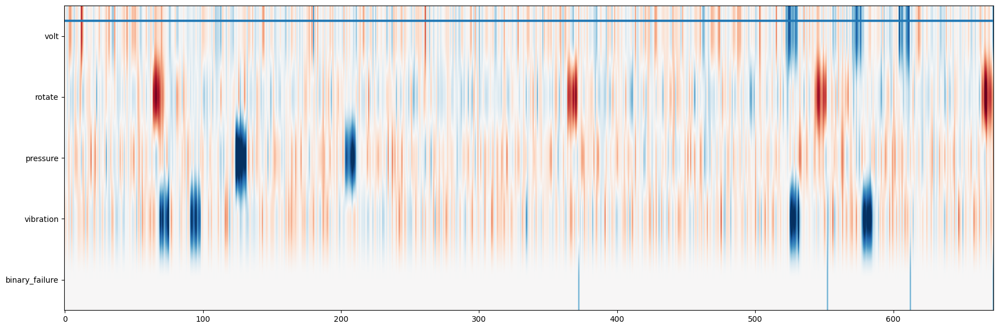

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_6[(df_agg_6['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

Aggregating and inspecting the standard deviation of the aggregated data in intervals of 6 hours


In [ ]:
df_agg_6_std = df_agg.reset_index(drop=True).groupby('machineID').resample('6H', on='datetime').agg({'volt':'std',
                                                                                      'rotate':'std',
                                                                                      'pressure':'std',
                                                                                      'vibration':'std',
                                                                                      'age':'std',
                                                                                      'model':'mean',
                                                                                      'binary_failure':'sum',
                                                                                      'fail_comp1':'sum',
                                                                                      'fail_comp2':'sum',
                                                                                      'fail_comp3':'sum',
                                                                                      'fail_comp4':'sum',
                                                                                      'error1': 'sum',
                                                                                      'error2': 'sum',
                                                                                      'error3': 'sum',
                                                                                      'error4': 'sum',
                                                                                      'error5': 'sum'}).reset_index()
df_agg_6_std

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01 06:00:00,0.461791,1.116263,1.308528,1.317598,0.0,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-01 12:00:00,0.463705,0.832404,0.522274,0.660387,0.0,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-01 18:00:00,0.883882,0.874969,0.346552,1.131134,0.0,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-02 00:00:00,0.954208,0.897511,0.594839,1.229468,0.0,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-02 06:00:00,1.094109,0.655425,0.978067,0.813108,0.0,3.0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125819,100,2015-12-08 06:00:00,1.302352,0.781864,1.205283,0.564133,0.0,4.0,0,0,0,0,0,0,1,1,0,0
125820,100,2015-12-08 12:00:00,0.596751,1.076902,1.177766,0.935593,0.0,4.0,0,0,0,0,0,0,0,0,0,0
125821,100,2015-12-08 18:00:00,1.036030,1.205519,1.114688,0.694467,0.0,4.0,0,0,0,0,0,0,0,0,0,0
125822,100,2015-12-09 00:00:00,0.893944,0.636601,1.031214,0.654632,0.0,4.0,0,0,0,0,0,0,0,0,0,0


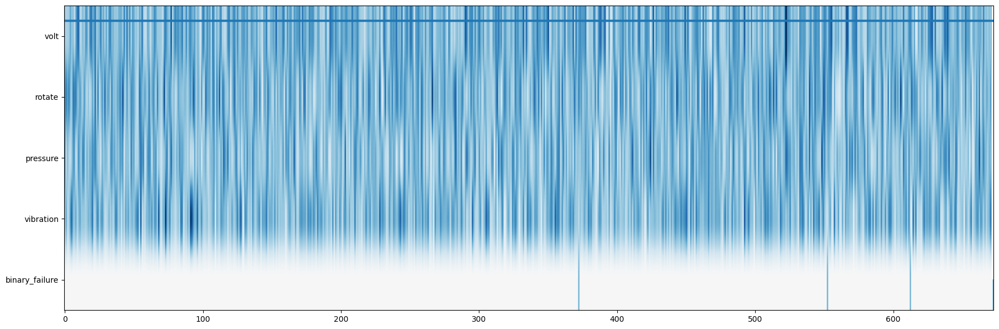

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_6_std[(df_agg_6_std['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Aggregation 12H

Aggregating and inspecting the data in intervals of 12 hours



In [ ]:
df_agg_12 = df_agg.reset_index(drop=True).groupby('machineID').resample('12H', on='datetime').agg({'volt':'mean',
                                                                                'rotate':'mean',
                                                                                'pressure':'mean',
                                                                                'vibration':'mean',
                                                                                'age':'mean',
                                                                                'model':'mean',
                                                                                'binary_failure':'sum',
                                                                                'fail_comp1':'sum',
                                                                                'fail_comp2':'sum',
                                                                                'fail_comp3':'sum',
                                                                                'fail_comp4':'sum',
                                                                                'error1': 'sum',
                                                                                'error2': 'sum',
                                                                                'error3': 'sum',
                                                                                'error4': 'sum',
                                                                                'error5': 'sum'}).reset_index()
df_agg_12

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01 00:00:00,-0.239028,-0.373324,-0.066390,-0.525338,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-01 12:00:00,-0.194016,0.018203,-0.285661,0.162932,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-02 00:00:00,0.094669,-0.017455,-0.431617,-0.308191,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-02 12:00:00,-0.226741,0.032279,-0.005767,-0.113262,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-03 00:00:00,0.327047,0.630994,-0.202742,0.728483,1.109908,3.0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62955,100,2015-12-07 00:00:00,-0.142946,-0.711057,0.310266,0.066163,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
62956,100,2015-12-07 12:00:00,-0.014086,-1.933120,-0.656465,0.783668,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
62957,100,2015-12-08 00:00:00,0.163811,-1.926713,0.063008,0.198129,-1.100331,4.0,0,0,0,0,0,0,1,1,0,0
62958,100,2015-12-08 12:00:00,-0.045078,-1.283403,-0.186863,0.172264,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0


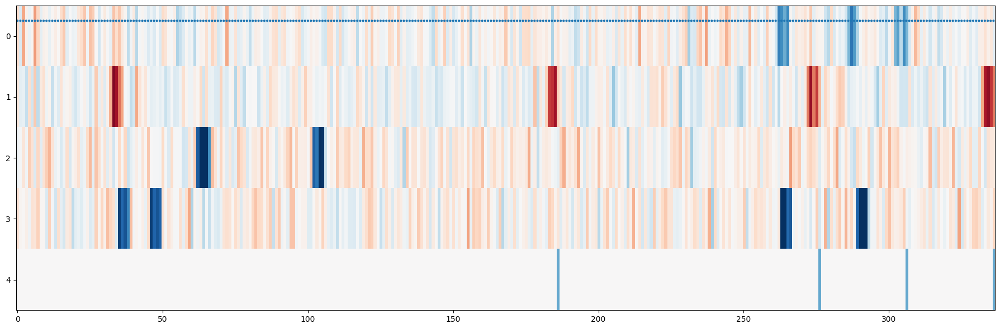

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_12[(df_agg_12['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

Aggregating and inspecting the standard deviation of the aggregated data in intervals of 12 hours


In [ ]:
df_agg_12_std = df_agg.reset_index(drop=True).groupby('machineID').resample('12H', on='datetime').agg({'volt':'std',
                                                                                      'rotate':'std',
                                                                                      'pressure':'std',
                                                                                      'vibration':'std',
                                                                                      'age':'std',
                                                                                      'model':'mean',
                                                                                      'binary_failure':'sum',
                                                                                      'fail_comp1':'sum',
                                                                                      'fail_comp2':'sum',
                                                                                      'fail_comp3':'sum',
                                                                                      'fail_comp4':'sum',
                                                                                      'error1': 'sum',
                                                                                      'error2': 'sum',
                                                                                      'error3': 'sum',
                                                                                      'error4': 'sum',
                                                                                      'error5': 'sum'}).reset_index()
df_agg_12_std

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01 00:00:00,0.461791,1.116263,1.308528,1.317598,0.0,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-01 12:00:00,0.676197,0.861842,0.787128,0.887955,0.0,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-02 00:00:00,1.013620,0.796518,0.879935,1.118080,0.0,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-02 12:00:00,1.033050,0.703328,1.206861,0.983135,0.0,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-03 00:00:00,0.702271,0.859443,0.720998,1.410285,0.0,3.0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62955,100,2015-12-07 00:00:00,0.666420,1.287220,1.151060,0.697480,0.0,4.0,0,0,0,0,0,0,0,0,0,0
62956,100,2015-12-07 12:00:00,1.003480,1.085891,0.958358,0.810264,0.0,4.0,0,0,0,0,0,0,0,0,0,0
62957,100,2015-12-08 00:00:00,1.142926,0.698159,1.049429,0.655404,0.0,4.0,0,0,0,0,0,0,1,1,0,0
62958,100,2015-12-08 12:00:00,0.831673,1.101810,1.119556,0.881767,0.0,4.0,0,0,0,0,0,0,0,0,0,0


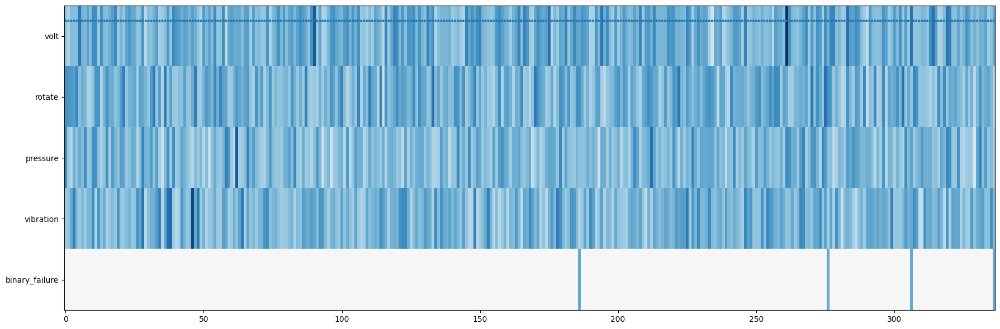

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_12_std[(df_agg_12_std['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Aggregation 24H

Aggregating and inspecting the data in intervals of 24 hours



In [ ]:
df_agg_24 = df_agg.reset_index(drop=True).groupby('machineID').resample('24H', on='datetime').agg({'volt':'mean',
                                                                                'rotate':'mean',
                                                                                'pressure':'mean',
                                                                                'vibration':'mean',
                                                                                'age':'mean',
                                                                                'model':'mean',
                                                                                'binary_failure':'sum',
                                                                                'fail_comp1':'sum',
                                                                                'fail_comp2':'sum',
                                                                                'fail_comp3':'sum',
                                                                                'fail_comp4':'sum',
                                                                                'error1': 'sum',
                                                                                'error2': 'sum',
                                                                                'error3': 'sum',
                                                                                'error4': 'sum',
                                                                                'error5': 'sum'}).reset_index()
df_agg_24

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01,-0.209020,-0.112306,-0.212570,-0.066491,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-02,-0.066036,0.007412,-0.218692,-0.210727,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-03,0.067107,0.241871,-0.259939,1.421231,1.109908,3.0,0,0,0,0,0,1,0,1,0,0
3,1,2015-01-04,0.255897,0.043618,0.052232,2.184363,1.109908,3.0,0,0,0,0,0,0,0,0,0,1
4,1,2015-01-05,0.012738,0.158830,0.134554,0.541743,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31524,100,2015-12-05,-0.269551,-0.059147,-0.254923,-0.157901,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
31525,100,2015-12-06,0.000396,0.323975,-0.012937,-0.068249,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
31526,100,2015-12-07,-0.078516,-1.322089,-0.173100,0.424915,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
31527,100,2015-12-08,0.059366,-1.605058,-0.061927,0.185197,-1.100331,4.0,0,0,0,0,0,0,1,1,0,0


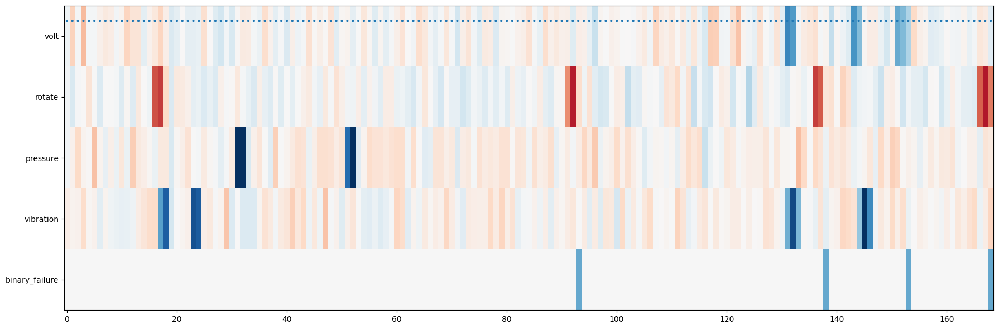

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_24[(df_agg_24['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

Aggregating and inspecting the standard deviation of the aggregated data in intervals of 24 hours


In [ ]:
df_agg_24_std = df_agg.reset_index(drop=True).groupby('machineID').resample('24H', on='datetime').agg({'volt':'std',
                                                                                      'rotate':'std',
                                                                                      'pressure':'std',
                                                                                      'vibration':'std',
                                                                                      'age':'std',
                                                                                      'model':'mean',
                                                                                      'binary_failure':'sum',
                                                                                      'fail_comp1':'sum',
                                                                                      'fail_comp2':'sum',
                                                                                      'fail_comp3':'sum',
                                                                                      'fail_comp4':'sum',
                                                                                      'error1': 'sum',
                                                                                      'error2': 'sum',
                                                                                      'error3': 'sum',
                                                                                      'error4': 'sum',
                                                                                      'error5': 'sum'}).reset_index()
df_agg_24_std

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01,0.599217,0.939771,0.956981,1.064073,0.0,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-02,1.014260,0.735293,1.055562,1.034434,0.0,3.0,0,0,0,0,0,0,0,0,0,0
2,1,2015-01-03,0.720506,0.898036,0.802994,1.519325,0.0,3.0,0,0,0,0,0,1,0,1,0,0
3,1,2015-01-04,1.238636,0.644476,0.976781,0.942056,0.0,3.0,0,0,0,0,0,0,0,0,0,1
4,1,2015-01-05,1.153325,0.905913,0.964601,1.499340,0.0,3.0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31524,100,2015-12-05,0.708388,1.073741,0.642990,0.735142,0.0,4.0,0,0,0,0,0,0,0,0,0,0
31525,100,2015-12-06,0.841680,1.019039,0.927077,0.857857,0.0,4.0,0,0,0,0,0,0,0,0,0,0
31526,100,2015-12-07,0.835661,1.321357,1.147487,0.825199,0.0,4.0,0,0,0,0,0,0,0,0,0,0
31527,100,2015-12-08,0.983325,0.960041,1.068856,0.759913,0.0,4.0,0,0,0,0,0,0,1,1,0,0


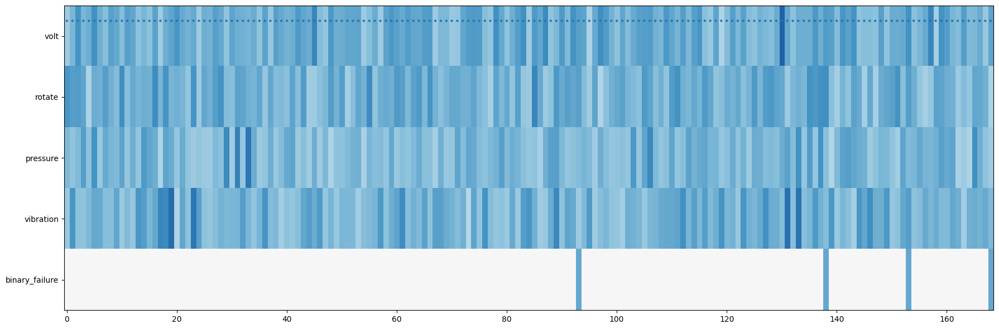

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_24_std[(df_agg_24_std['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

### Aggregation 48H

Aggregating and inspecting the data in intervals of 48 hours



In [ ]:
df_agg_48 = df_agg.reset_index(drop=True).groupby('machineID').resample('48H', on='datetime').agg({'volt':'mean',
                                                                                'rotate':'mean',
                                                                                'pressure':'mean',
                                                                                'vibration':'mean',
                                                                                'age':'mean',
                                                                                'model':'mean',
                                                                                'binary_failure':'sum',
                                                                                'fail_comp1':'sum',
                                                                                'fail_comp2':'sum',
                                                                                'fail_comp3':'sum',
                                                                                'fail_comp4':'sum',
                                                                                'error1': 'sum',
                                                                                'error2': 'sum',
                                                                                'error3': 'sum',
                                                                                'error4': 'sum',
                                                                                'error5': 'sum'}).reset_index()
df_agg_48

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01,-0.127315,-0.043896,-0.216069,-0.148911,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-03,0.161502,0.142745,-0.103853,1.802797,1.109908,3.0,0,0,0,0,0,1,0,1,0,1
2,1,2015-01-05,0.012952,0.156855,0.135211,0.372717,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-07,0.149282,-0.022917,-0.134520,0.015595,1.109908,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-09,-0.041399,0.281385,-0.087676,-0.227637,1.109908,3.0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15786,100,2015-12-01,-0.122992,0.000494,-0.093041,-0.237176,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
15787,100,2015-12-03,-0.084989,0.001397,-0.108395,-0.156447,-1.100331,4.0,0,0,0,0,0,1,0,0,0,0
15788,100,2015-12-05,-0.134577,0.132414,-0.133930,-0.113075,-1.100331,4.0,0,0,0,0,0,0,0,0,0,0
15789,100,2015-12-07,-0.009575,-1.463573,-0.117513,0.305056,-1.100331,4.0,0,0,0,0,0,0,1,1,0,0


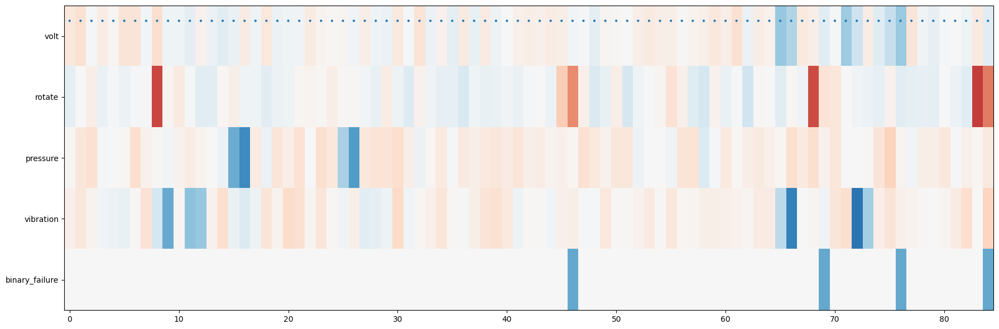

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_48[(df_agg_48['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

Aggregating and inspecting the standard deviation of the aggregated data in intervals of 48 hours


In [ ]:
df_agg_48_std = df_agg.reset_index(drop=True).groupby('machineID').resample('48H', on='datetime').agg({'volt':'std',
                                                                                'rotate' : 'std',                                                                  'rotate':'mean',
                                                                                'pressure':'std',
                                                                                'vibration':'std',
                                                                                'age':'std',
                                                                                'model':'mean',
                                                                                'binary_failure':'sum',
                                                                                'fail_comp1':'sum',
                                                                                'fail_comp2':'sum',
                                                                                'fail_comp3':'sum',
                                                                                'fail_comp4':'sum',
                                                                                'error1': 'sum',
                                                                                'error2': 'sum',
                                                                                'error3': 'sum',
                                                                                'error4': 'sum',
                                                                                'error5': 'sum'}).reset_index()
df_agg_48_std

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,fail_comp2,fail_comp3,fail_comp4,error1,error2,error3,error4,error5
0,1,2015-01-01,0.855042,-0.043896,1.002388,1.036804,0.0,3.0,0,0,0,0,0,0,0,0,0,0
1,1,2015-01-03,1.006941,0.142745,0.898511,1.308664,0.0,3.0,0,0,0,0,0,1,0,1,0,1
2,1,2015-01-05,1.132202,0.156855,0.864246,1.200013,0.0,3.0,0,0,0,0,0,0,0,0,0,0
3,1,2015-01-07,0.788382,-0.022917,0.938922,0.952043,0.0,3.0,0,0,0,0,0,0,0,0,0,0
4,1,2015-01-09,0.866826,0.281385,0.789632,0.932461,0.0,3.0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15786,100,2015-12-01,1.042913,0.000494,1.079300,1.027411,0.0,4.0,0,0,0,0,0,0,0,0,0,0
15787,100,2015-12-03,1.107240,0.001397,0.886452,0.988623,0.0,4.0,0,0,0,0,0,1,0,0,0,0
15788,100,2015-12-05,0.781569,0.132414,0.798663,0.791612,0.0,4.0,0,0,0,0,0,0,0,0,0,0
15789,100,2015-12-07,0.905410,-1.463573,1.098446,0.794037,0.0,4.0,0,0,0,0,0,0,1,1,0,0


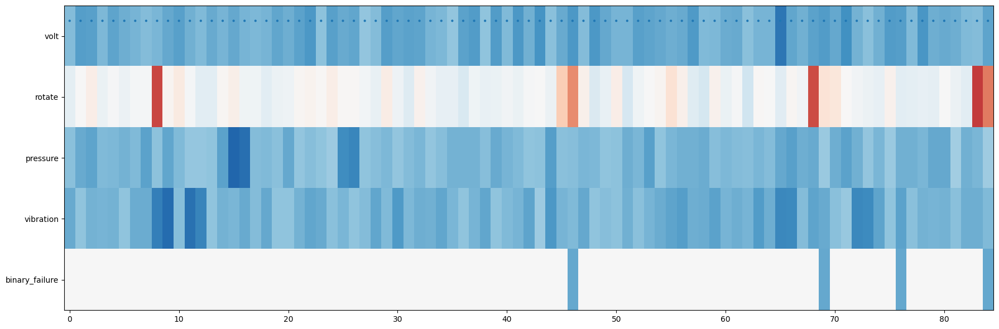

In [ ]:
columns = ['volt', 'rotate', 'pressure', 'vibration', 'binary_failure']
machine = df_agg_48_std[(df_agg_48_std['machineID']==10)].reset_index(drop=True)
plot_dataframe(machine[columns], labels=machine['machineID'], figsize=(18, 6), columns = columns)

# RUL prediction

The first task in this project consists in predictin g the Ramaining Useful Life of the considered componente of a machine. This kind of problem can be seen as a regression problem where the output of the model consists in an integer.

In other words the model predicts how many cicles are left before the given component is going to fail.

This is a fundamental problem in the field of predictive mainteinance due to the fact that the machine can be stop only when the considered component is near to a failure.

## Component 1

The component 1 is selected between the 4 components and the data are splitted in 5 different folds.

In [ ]:
# Select component 1
comp = 1

# Generate 5 folds
df_final_folds =  utils.generate_k_folds(df_final, 5, 'machineID', comp)
df_final_folds.groupby(['fold'])['machineID'].nunique()

fold
0    17
1    18
2    16
3    16
4    18
Name: machineID, dtype: int64

In [ ]:
# Split data in train and test
df_train, df_test = utils.split_data_fold(df_final_folds, fold = 0)
df_train.shape, df_test.shape

((371524, 35), (91770, 35))

In [ ]:
# Sanity check
set(df_train['machineID'].unique()) & set(df_test['machineID'].unique())

set()

In [ ]:
# Standardize data
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

The data are aggregated in 6 hours windows and the labels for the RUL of the component are generated.

In [ ]:
# 6 hours aggregation
df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

# Recompute RUL after aggregation
df_train = generate_rul(df_agg_6_train, comp=comp)
df_test = generate_rul(df_agg_6_test, comp=comp)

# Standardize RUL
df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)

In [ ]:
df_train_st

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp1,error1,error2,error3,error4,error5,rul_comp1,max_rul_comp1
0,3,2015-01-01 06:00:00,-0.211518,0.231130,0.049168,-1.011224,-0.511648,3,0,0,0,0,0,0,0,0.108761,144
1,3,2015-01-01 12:00:00,-0.228937,-0.034272,-0.233114,-0.992281,-0.511648,3,0,0,0,0,0,0,0,0.108006,144
2,3,2015-01-01 18:00:00,0.049785,0.234299,0.071435,-0.289190,-0.511648,3,0,0,0,0,0,0,0,0.107251,144
3,3,2015-01-02 00:00:00,0.162658,0.660496,0.338962,0.500730,-0.511648,3,0,0,0,0,0,0,0,0.106495,144
4,3,2015-01-02 06:00:00,-0.453885,0.233875,-0.745287,-0.361115,-0.511648,3,0,0,0,0,0,0,0,0.105740,144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61978,100,2015-09-09 06:00:00,1.956640,0.490567,-0.021793,0.069732,-1.031599,4,0,0,1,0,0,0,0,0.003021,839
61979,100,2015-09-09 12:00:00,1.511900,-0.028717,-0.055143,0.170241,-1.031599,4,0,0,0,0,0,0,0,0.002266,839
61980,100,2015-09-09 18:00:00,1.373433,0.154209,-0.536161,-0.321614,-1.031599,4,0,0,0,0,0,0,0,0.001511,839
61981,100,2015-09-10 00:00:00,1.358443,-0.109104,0.031141,0.331068,-1.031599,4,0,0,0,0,0,0,0,0.000755,839


After the features selection step, a sequence of data with a window of 7 days is created.

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 1
sequence_length = time_steps

Data Shape:  (60147, 28, 11)
Label Shape:  (60147,)
Data Shape:  (14851, 28, 11)
Label Shape:  (14851,)


### CNN

The first model to address the RUL prediction problem is a Convolutional Neural Network composed by four CONV1D layers and one Dense layer.


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
cnn = models.build_CNN(columns, nb_out)
cnn.compile(optimizer, 'mse', ['Precision', 'Recall'])

print(cnn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 27, 32)            736       
                                                                 
 conv1d_1 (Conv1D)           (None, 26, 128)           8320      
                                                                 
 conv1d_2 (Conv1D)           (None, 25, 128)           32896     
                                                                 
 conv1d_3 (Conv1D)           (None, 24, 64)            16448     
                                                                 
 max_pooling1d (MaxPooling1  (None, 12, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 768)               0         
                                                        

In [ ]:
history = cnn.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=30, batch_size=64)

Epoch 1/30
940/940 [==============================] - 14s 10ms/step - loss: 0.0360 - precision: 1.0000 - recall: 4.9997e-04 - val_loss: 0.0576 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
940/940 [==============================] - 5s 6ms/step - loss: 0.0333 - precision: 1.0000 - recall: 8.6661e-04 - val_loss: 0.0608 - val_precision: 1.0000 - val_recall: 6.7485e-04
Epoch 3/30
940/940 [==============================] - 6s 7ms/step - loss: 0.0248 - precision: 0.9991 - recall: 0.0194 - val_loss: 0.0706 - val_precision: 0.9955 - val_recall: 0.0150
Epoch 4/30
940/940 [==============================] - 6s 6ms/step - loss: 0.0102 - precision: 1.0000 - recall: 0.0673 - val_loss: 0.0746 - val_precision: 0.9961 - val_recall: 0.0174
Epoch 5/30
940/940 [==============================] - 7s 7ms/step - loss: 0.0040 - precision: 1.0000 - recall: 0.0862 - val_loss: 0.0743 - val_precision: 0.9920 - val_recall: 0.0084
Epoch 6/30
940/940 [==============================] - 6s 6ms/step - 

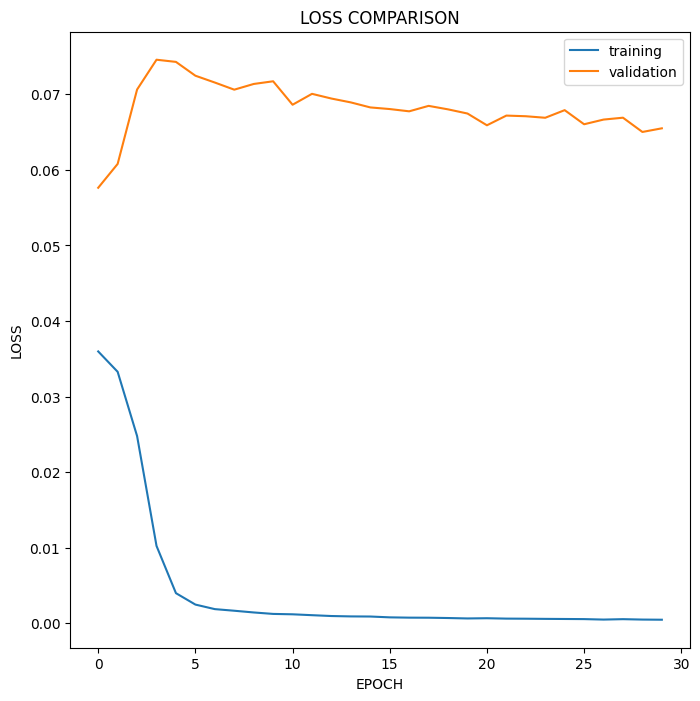

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 1 should be done.

In [ ]:
y_pred_test = cnn.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

465/465 [==============================] - 1s 2ms/step
Test R2 score -0.13160432488570795


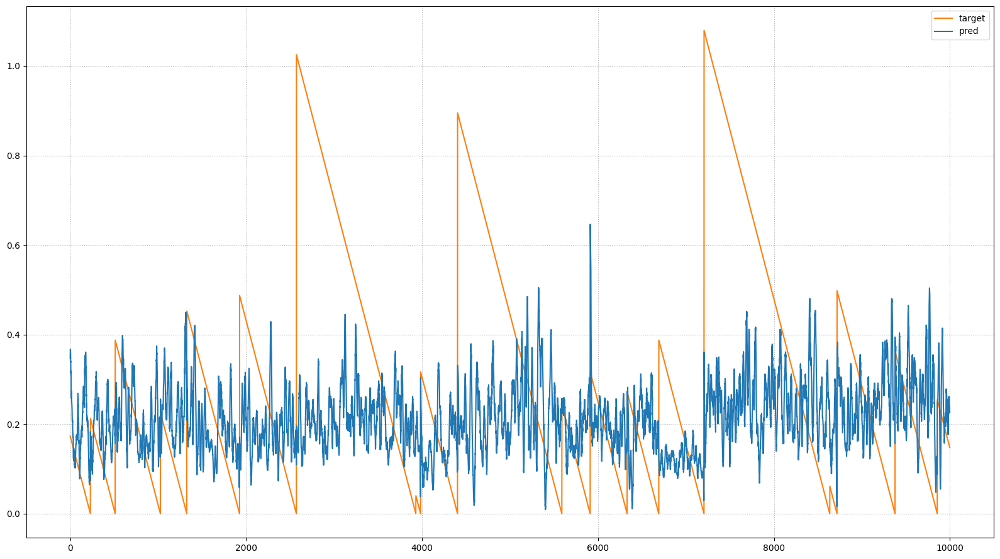

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = cnn.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

1880/1880 [==============================] - 4s 2ms/step
Train R2 score 0.9873582856122288


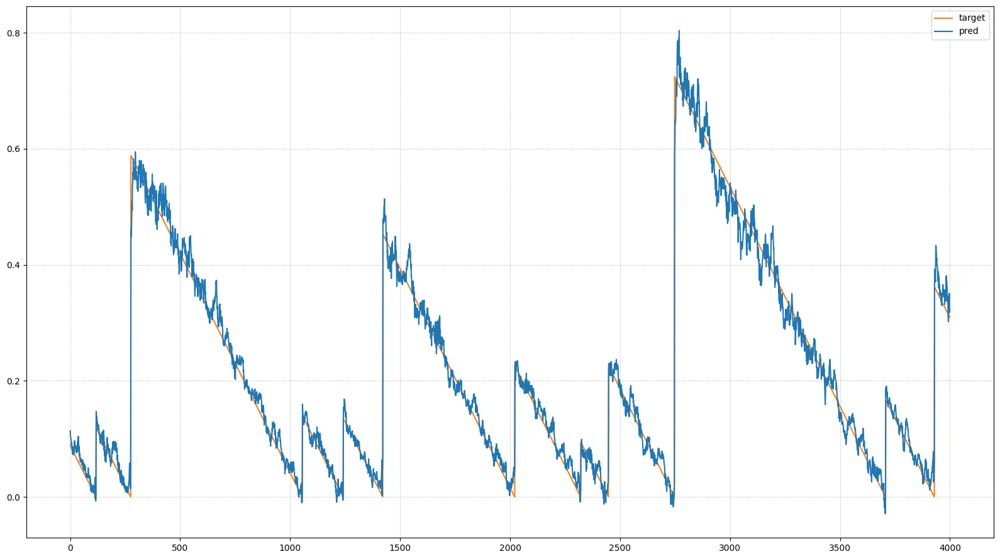

In [ ]:
stop = 4000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM simple

The second model to address the RUL prediction problem is a Recurrent Neural Network composed by three LSTM layers and three Dense layers.


In [ ]:
lstm = models.build_LSTM_simple(time_steps, columns, nb_out)
lstm.compile(loss = "mse", optimizer = keras.optimizers.Adam(learning_rate=0.001))
print(lstm.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 28, 128)           71680     
                                                                 
 lstm_1 (LSTM)               (None, 28, 64)            49408     
                                                                 
 lstm_2 (LSTM)               (None, 32)                12416     
                                                                 
 dense_1 (Dense)             (None, 96)                3168      
                                                                 
 dense_2 (Dense)             (None, 128)               12416     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 149217 (582.88 KB)
Trainable params: 149

In [ ]:
history = lstm.fit(x_train, y_train, epochs = 20, #60
                    validation_data = (x_test, y_test),
                    batch_size = 128)

Epoch 1/20
470/470 [==============================] - 13s 15ms/step - loss: 0.0355 - val_loss: 0.0580
Epoch 2/20
470/470 [==============================] - 5s 11ms/step - loss: 0.0346 - val_loss: 0.0589
Epoch 3/20
470/470 [==============================] - 5s 10ms/step - loss: 0.0338 - val_loss: 0.0596
Epoch 4/20
470/470 [==============================] - 6s 13ms/step - loss: 0.0330 - val_loss: 0.0636
Epoch 5/20
470/470 [==============================] - 5s 10ms/step - loss: 0.0320 - val_loss: 0.0596
Epoch 6/20
470/470 [==============================] - 5s 11ms/step - loss: 0.0307 - val_loss: 0.0601
Epoch 7/20
470/470 [==============================] - 5s 12ms/step - loss: 0.0289 - val_loss: 0.0608
Epoch 8/20
470/470 [==============================] - 6s 12ms/step - loss: 0.0268 - val_loss: 0.0637
Epoch 9/20
470/470 [==============================] - 6s 13ms/step - loss: 0.0238 - val_loss: 0.0629
Epoch 10/20
470/470 [==============================] - 5s 10ms/step - loss: 0.0201 - val_l

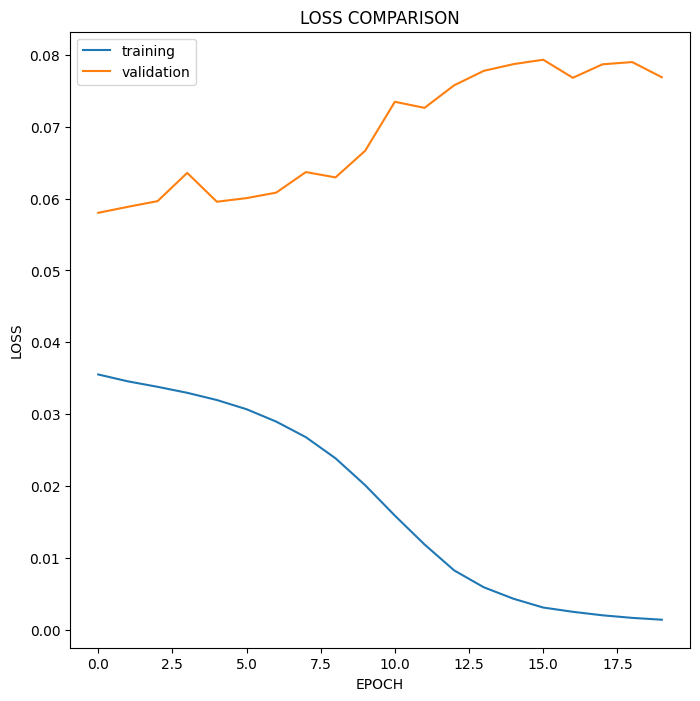

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 1 should be done.

In [ ]:
y_pred_test = lstm.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

465/465 [==============================] - 3s 4ms/step
Test R2 score -0.32845718813634783


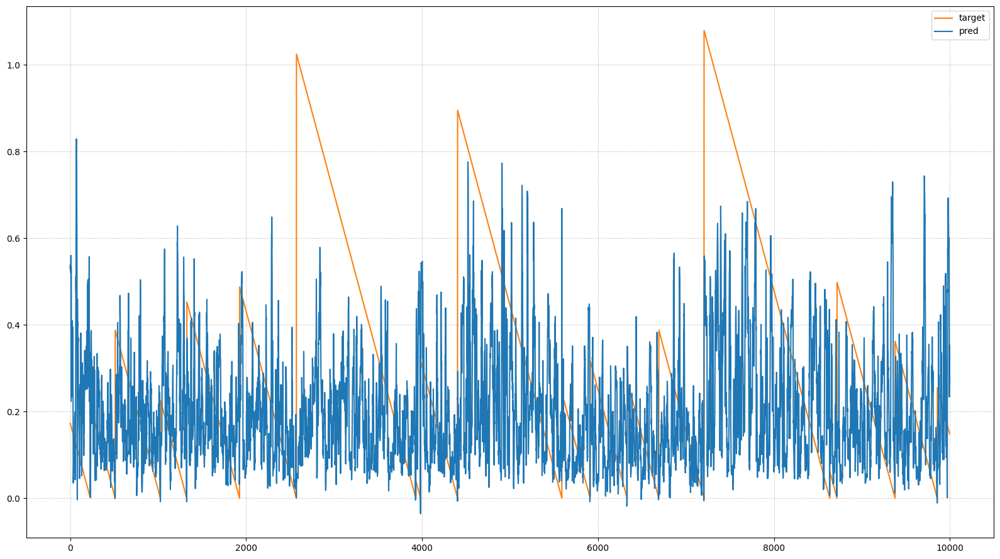

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In [ ]:
y_pred_train = lstm.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

1880/1880 [==============================] - 7s 4ms/step
Train R2 score 0.9663776279080938


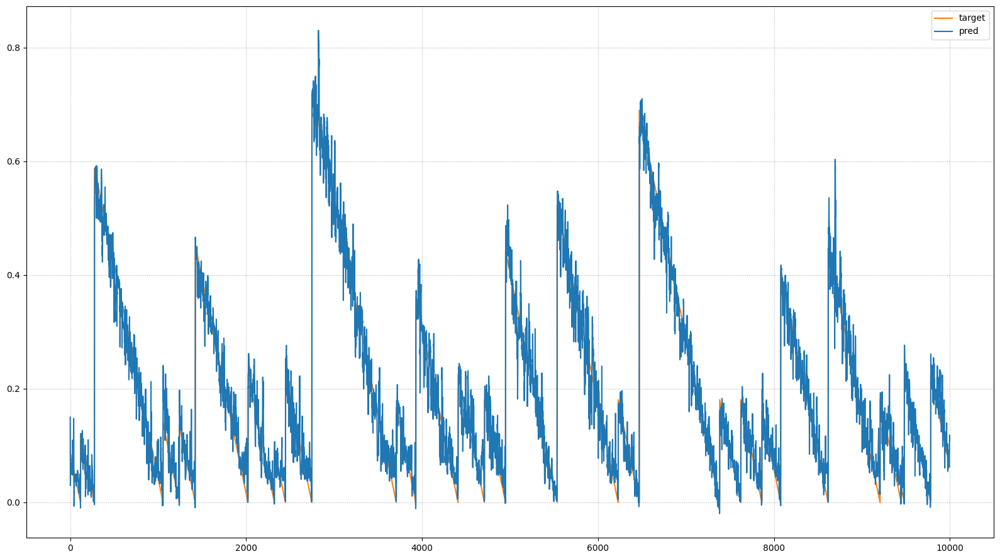

In [ ]:
stop = 10000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM multihead

The third model to address the RUL prediction problem is a Multihaed Neural Network composed by LSTM, Convolutional and Dense layers.

This model processes the input features singularly, then after this initial phase the layers are merged togheter in order to have the final prediction.

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps,1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps,1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm_mh = models.build_LSTM_multihead(nb_features, sequence_length, nb_out)

lstm_mh.compile(loss=keras.losses.Huber(),
              optimizer=optimizer)

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=150,
        validation_data=(test_sample_multihead, y_test) )

Epoch 1/100
59/59 [==============================] - 10s 166ms/step - loss: 0.0121 - rmse: 0.0293 - k_score: 2.1159 - val_loss: 0.0540 - val_rmse: 0.2713 - val_k_score: 18.3893
Epoch 2/100
59/59 [==============================] - 10s 167ms/step - loss: 0.0120 - rmse: 0.0288 - k_score: 2.0833 - val_loss: 0.0542 - val_rmse: 0.2714 - val_k_score: 18.3611
Epoch 3/100
59/59 [==============================] - 10s 167ms/step - loss: 0.0121 - rmse: 0.0290 - k_score: 2.0945 - val_loss: 0.0540 - val_rmse: 0.2754 - val_k_score: 18.8557
Epoch 4/100
59/59 [==============================] - 10s 163ms/step - loss: 0.0120 - rmse: 0.0274 - k_score: 1.9830 - val_loss: 0.0537 - val_rmse: 0.2723 - val_k_score: 18.5799
Epoch 5/100
59/59 [==============================] - 10s 165ms/step - loss: 0.0120 - rmse: 0.0285 - k_score: 2.0645 - val_loss: 0.0542 - val_rmse: 0.2779 - val_k_score: 19.1991
Epoch 6/100
59/59 [==============================] - 10s 165ms/step - loss: 0.0120 - rmse: 0.0282 - k_score: 2.0460

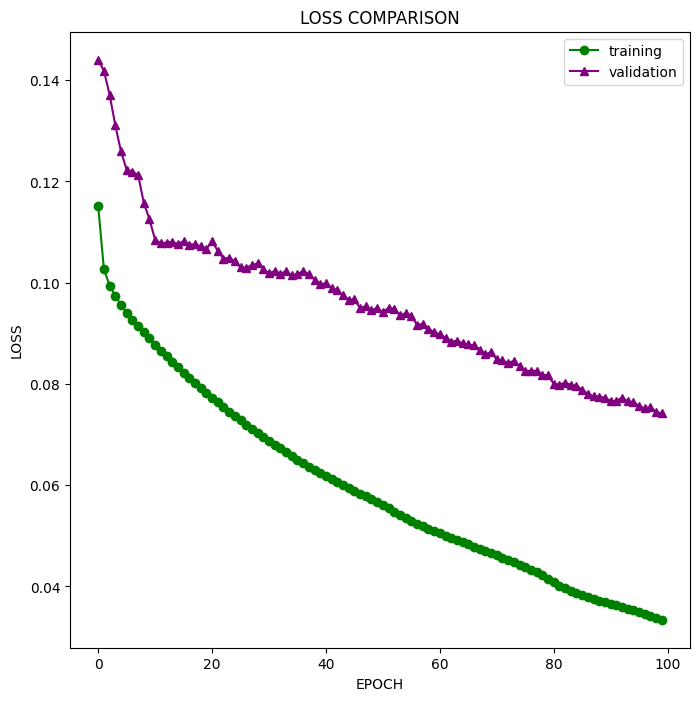

In [ ]:
utils.get_loss_plot(train_history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 1 should be done.

In [ ]:
tr_pred_test = lstm_mh.predict(test_sample_multihead, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, tr_pred_test)}')

465/465 [==============================] - 17s 22ms/step


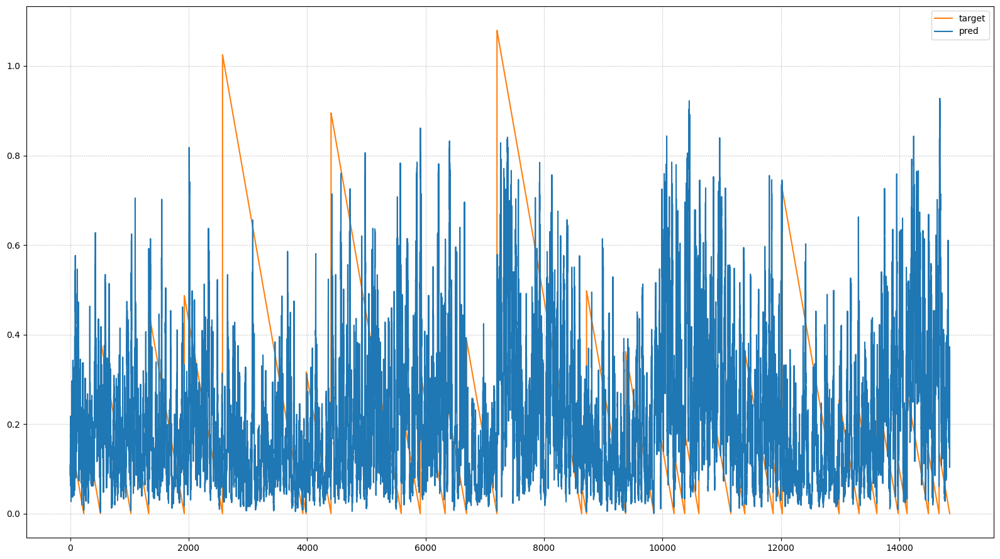

In [ ]:
stop = 20000
utils.plot_rul(tr_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In [ ]:
tr_pred_train = lstm_mh.predict(training_sample_multihead, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

305/305 [==============================] - 5s 16ms/step


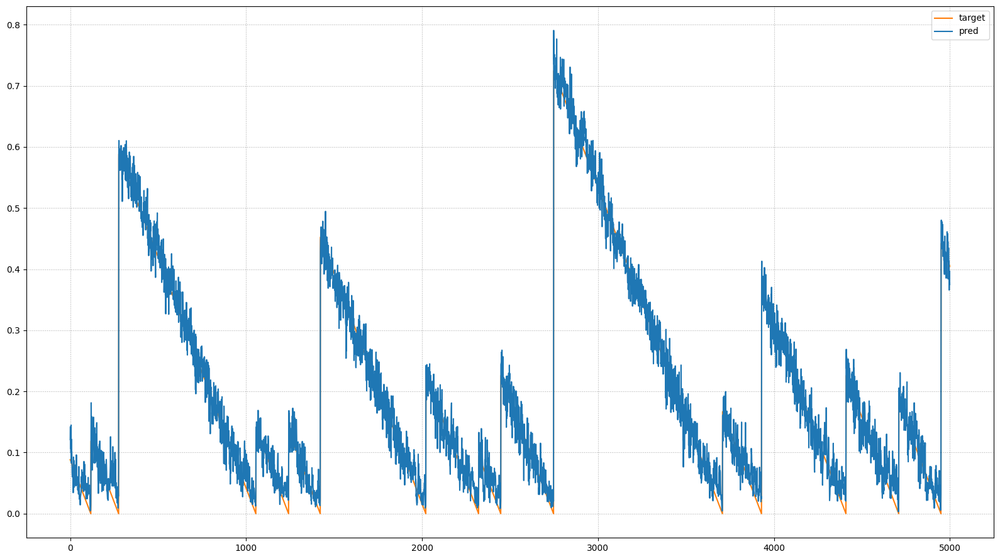

In [ ]:
stop = 5000
utils.plot_rul(tr_pred_train[:stop], y_train[:stop], figsize=(16,9))

### Neuro models

The fourth model to address the RUL prediction problem is a probablity Neural Network composed by three LSTMand three Dense layers.

This model predicts the value and the standard deviation of the RUL of the component 1.

In [ ]:
tr_rul_std = df_train_st[f'rul_comp{comp}'].std()
nnp = models.build_NN(input_shape=(x_train.shape[1], x_train.shape[2]), stddev_guess=tr_rul_std)
print(nnp.summary())

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(None, 28, 11)]          0         
                                                                 
 lstm_42 (LSTM)              (None, 28, 128)           71680     
                                                                 
 lstm_43 (LSTM)              (None, 28, 64)            49408     
                                                                 
 lstm_44 (LSTM)              (None, 32)                12416     
                                                                 
 dense_16 (Dense)            (None, 96)                3168      
                                                                 
 dense_17 (Dense)            (None, 128)               12416     
                                                                 
 dense_18 (Dense)            (None, 2)                 258 

In [ ]:
negloglikelihood = lambda y_true, dist: -dist.log_prob(y_true)
# Compile the model
nnp.compile(optimizer='Adam', loss=negloglikelihood)

In [ ]:
# Train the model
call_backs = [callbacks.EarlyStopping(patience=10, restore_best_weights=True)]
history = nnp.fit(x_train, y_train, callbacks =call_backs, epochs=20, verbose=1, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/10
1880/1880 [==============================] - 27s 14ms/step - loss: -0.7738 - val_loss: 4.9360
Epoch 2/10
1880/1880 [==============================] - 20s 11ms/step - loss: -0.8509 - val_loss: 7.2217
Epoch 3/10
1880/1880 [==============================] - 20s 11ms/step - loss: -0.9495 - val_loss: 12.9593
Epoch 4/10
1880/1880 [==============================] - 22s 12ms/step - loss: -1.0023 - val_loss: 7.4410
Epoch 5/10
1880/1880 [==============================] - 21s 11ms/step - loss: -1.0121 - val_loss: 18.1413
Epoch 6/10
1880/1880 [==============================] - 20s 11ms/step - loss: -1.1802 - val_loss: 17.2500
Epoch 7/10
1880/1880 [==============================] - 21s 11ms/step - loss: -1.2950 - val_loss: 18.4444
Epoch 8/10
1880/1880 [==============================] - 19s 10ms/step - loss: -1.3436 - val_loss: 32.9801
Epoch 9/10
1880/1880 [==============================] - 22s 12ms/step - loss: -1.3875 - val_loss: 42.1058
Epoch 10/10
1880/1880 [==========================

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 1 should be done.

In [ ]:
nn_pred_ts = nnp(x_test) # simply call the model to obtain a distribution object
np_pred_ts_mean = nn_pred_ts.mean().numpy().ravel()
np_pred_ts_std = nn_pred_ts.stddev().numpy().ravel()

print(f'Test R2 score {r2_score(y_test, np_pred_ts_mean)}')

Test R2 score -0.2933360954372881


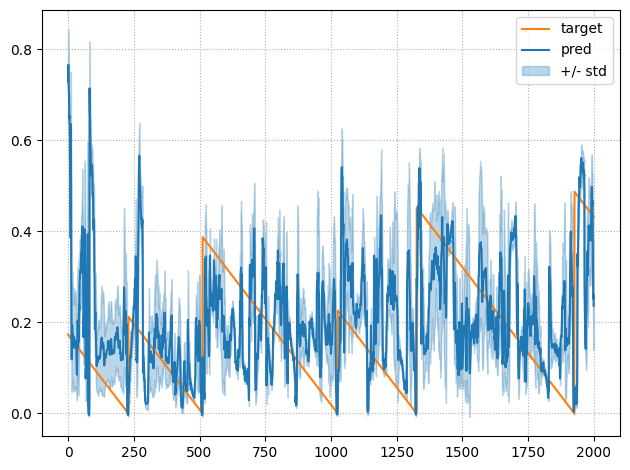

In [ ]:
stop = 2000
utils.plot_rul(target=y_test[:stop], pred=np_pred_ts_mean[:stop],
              stddev=np_pred_ts_std[:stop])

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In addition the prediction of the standard deviation does not help having  a more accurate and less noisy prediction of the RUL.

In [ ]:
nn_pred_tr = nnp(x_train) # simply call the model to obtain a distribution object
np_pred_tr_mean = nn_pred_tr.mean().numpy().ravel()
np_pred_tr_std = nn_pred_tr.stddev().numpy().ravel()

print(f'Train R2 score {r2_score(y_train, np_pred_tr_mean)}')

Train R2 score 0.6922806051594104


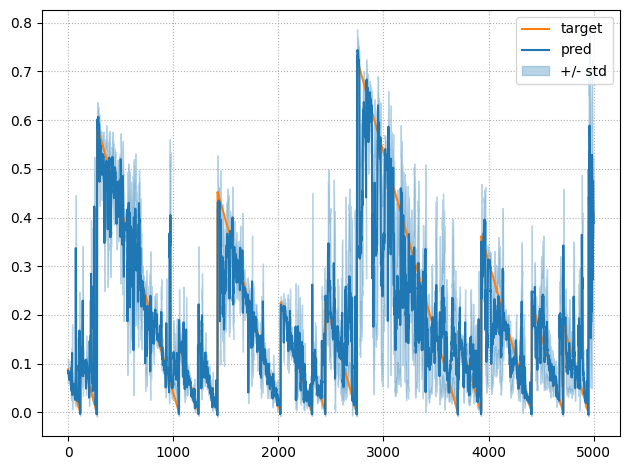

In [ ]:
stop = 5000
utils.plot_rul(target=y_train[:stop], pred=np_pred_tr_mean[:stop], stddev=np_pred_tr_std[:stop])

## Component 2

The component 2 is selected between the 4 components and the data are splitted in 5 different folds.

In [ ]:
# Select component 2
comp = 2

# Generate 5 folds
df_final_folds =  utils.generate_k_folds(df_final, 5, 'machineID', comp)
df_final_folds.groupby(['fold'])['machineID'].nunique()

fold
0    17
1    17
2    18
3    20
4    18
Name: machineID, dtype: int64

In [ ]:
# Split data in train and test
df_train, df_test = utils.split_data_fold(df_final_folds, fold = 0)
df_train.shape, df_test.shape

((472259, 35), (114730, 35))

In [ ]:
# Sanity check
set(df_train['machineID'].unique()) & set(df_test['machineID'].unique())

set()

In [ ]:
# Standardize data
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

The data are aggregated in 6 hours windows and the labels for the RUL of the component are generated.

In [ ]:
# 6 hours aggregation
df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

# Recompute RUL after aggregation
df_train = generate_rul(df_agg_6_train, comp=comp)
df_test = generate_rul(df_agg_6_test, comp=comp)

# Standardize RUL
df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)

In [ ]:
df_train_st

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp2,error1,error2,error3,error4,error5,rul_comp2,max_rul_comp2
0,1,2015-01-01 06:00:00,-0.238642,-0.367236,-0.062373,-0.524951,1.189179,3,0,0,0,0,0,0,0,0.318713,436
1,1,2015-01-01 12:00:00,-0.257130,-0.246542,0.356113,0.075950,1.189179,3,0,0,0,0,0,0,0,0.317982,436
2,1,2015-01-01 18:00:00,-0.129936,0.293086,-0.921461,0.254633,1.189179,3,0,0,0,0,0,0,0,0.317251,436
3,1,2015-01-02 00:00:00,0.348594,0.245768,-0.835865,0.184756,1.189179,3,0,0,0,0,0,0,0,0.316520,436
4,1,2015-01-02 06:00:00,-0.157051,-0.270354,-0.022766,-0.799120,1.189179,3,0,0,0,0,0,0,0,0.315789,436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78770,100,2015-12-08 06:00:00,-0.070043,-1.925037,0.133230,0.111431,-0.948806,4,0,0,0,1,1,0,0,0.002924,1368
78771,100,2015-12-08 12:00:00,-0.240724,-1.429694,-0.415283,-0.209913,-0.948806,4,0,0,0,0,0,0,0,0.002193,1368
78772,100,2015-12-08 18:00:00,0.152174,-1.120198,0.048459,0.559214,-0.948806,4,0,0,0,0,0,0,0,0.001462,1368
78773,100,2015-12-09 00:00:00,0.152159,-1.220873,-0.254384,-0.189533,-0.948806,4,0,0,0,0,0,0,0,0.000731,1368


After the features selection step, a sequence of data with a window of 7 days is created.

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 1
sequence_length = time_steps

Data Shape:  (76804, 28, 11)
Label Shape:  (76804,)
Data Shape:  (18678, 28, 11)
Label Shape:  (18678,)


### CNN

The first model to address the RUL prediction problem is a Convolutional Neural Network composed by four CONV1D layers and one Dense layer.


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
cnn = models.build_CNN(columns, nb_out)
cnn.compile(optimizer, 'mse', ['Precision', 'Recall'])

print(cnn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 27, 32)            736       
                                                                 
 conv1d_1 (Conv1D)           (None, 26, 128)           8320      
                                                                 
 conv1d_2 (Conv1D)           (None, 25, 128)           32896     
                                                                 
 conv1d_3 (Conv1D)           (None, 24, 64)            16448     
                                                                 
 max_pooling1d (MaxPooling1  (None, 12, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 768)               0         
                                                        

In [ ]:
history = cnn.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=30, batch_size=64)

Epoch 1/30
1201/1201 [==============================] - 20s 6ms/step - loss: 0.0339 - precision: 1.0000 - recall: 9.1366e-04 - val_loss: 0.0444 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
1201/1201 [==============================] - 6s 5ms/step - loss: 0.0293 - precision: 1.0000 - recall: 0.0040 - val_loss: 0.0470 - val_precision: 1.0000 - val_recall: 0.0028
Epoch 3/30
1201/1201 [==============================] - 7s 6ms/step - loss: 0.0235 - precision: 1.0000 - recall: 0.0221 - val_loss: 0.0625 - val_precision: 1.0000 - val_recall: 0.0498
Epoch 4/30
1201/1201 [==============================] - 7s 6ms/step - loss: 0.0143 - precision: 1.0000 - recall: 0.0478 - val_loss: 0.0620 - val_precision: 1.0000 - val_recall: 0.0115
Epoch 5/30
1201/1201 [==============================] - 7s 6ms/step - loss: 0.0069 - precision: 1.0000 - recall: 0.0693 - val_loss: 0.0634 - val_precision: 1.0000 - val_recall: 0.0276
Epoch 6/30
1201/1201 [==============================] - 7s 6ms/step

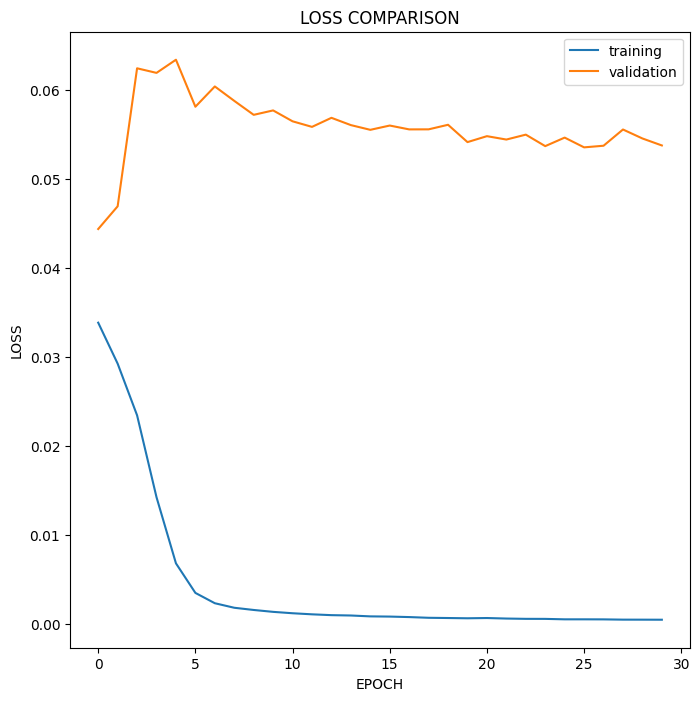

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 2 should be done.

In [ ]:
y_pred_test = cnn.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

584/584 [==============================] - 2s 3ms/step
Test R2 score -0.37322280775175143


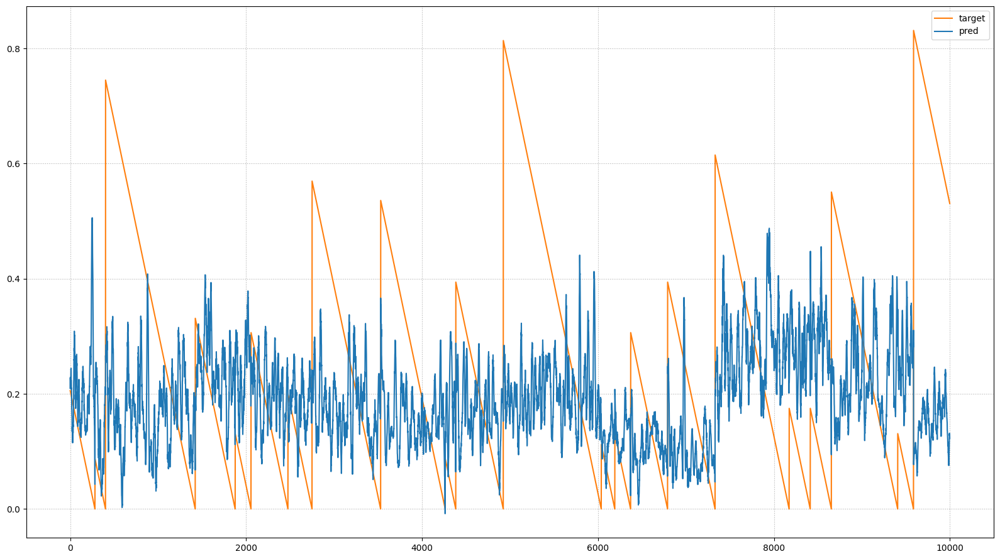

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = cnn.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

2401/2401 [==============================] - 5s 2ms/step
Train R2 score 0.9841614148367802


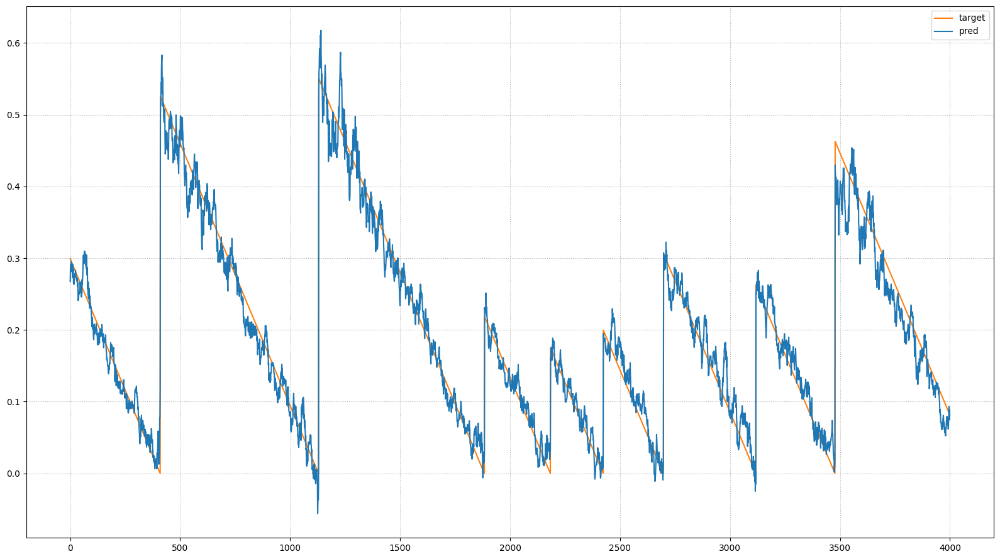

In [ ]:
stop = 4000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM simple

The second model to address the RUL prediction problem is a Recurrent Neural Network composed by three LSTM layers and three Dense layers.


In [ ]:
lstm = models.build_LSTM_simple(time_steps, columns, nb_out)
lstm.compile(loss = "mse", optimizer = keras.optimizers.Adam(learning_rate=0.001))
print(lstm.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 28, 128)           71680     
                                                                 
 lstm_4 (LSTM)               (None, 28, 64)            49408     
                                                                 
 lstm_5 (LSTM)               (None, 32)                12416     
                                                                 
 dense_4 (Dense)             (None, 96)                3168      
                                                                 
 dense_5 (Dense)             (None, 128)               12416     
                                                                 
 dense_6 (Dense)             (None, 1)                 129       
                                                                 
Total params: 149217 (582.88 KB)
Trainable params: 149

In [ ]:
history = lstm.fit(x_train, y_train, epochs = 20, #60
                    validation_data = (x_test, y_test),
                    batch_size = 128)

Epoch 1/20
601/601 [==============================] - 20s 17ms/step - loss: 0.0338 - val_loss: 0.0453
Epoch 2/20
601/601 [==============================] - 7s 11ms/step - loss: 0.0306 - val_loss: 0.0584
Epoch 3/20
601/601 [==============================] - 6s 11ms/step - loss: 0.0302 - val_loss: 0.0565
Epoch 4/20
601/601 [==============================] - 6s 10ms/step - loss: 0.0282 - val_loss: 0.0501
Epoch 5/20
601/601 [==============================] - 6s 11ms/step - loss: 0.0268 - val_loss: 0.0591
Epoch 6/20
601/601 [==============================] - 6s 10ms/step - loss: 0.0254 - val_loss: 0.0574
Epoch 7/20
601/601 [==============================] - 7s 12ms/step - loss: 0.0238 - val_loss: 0.0564
Epoch 8/20
601/601 [==============================] - 6s 10ms/step - loss: 0.0220 - val_loss: 0.0607
Epoch 9/20
601/601 [==============================] - 7s 12ms/step - loss: 0.0207 - val_loss: 0.0609
Epoch 10/20
601/601 [==============================] - 6s 10ms/step - loss: 0.0177 - val_l

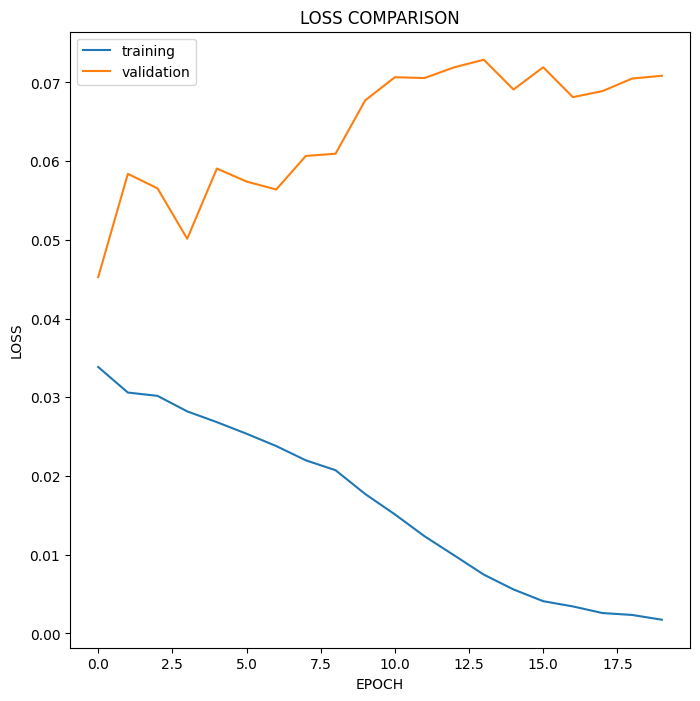

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 2 should be done.

In [ ]:
y_pred_test = lstm.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

584/584 [==============================] - 3s 6ms/step
Test R2 score -0.8081015993026757


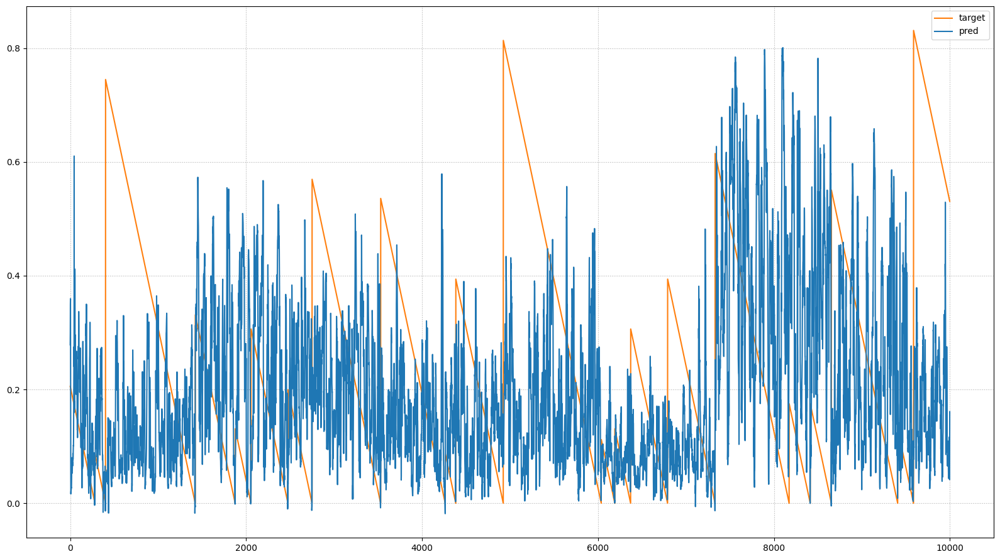

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = lstm.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

2401/2401 [==============================] - 11s 4ms/step
Train R2 score 0.9575942625646916


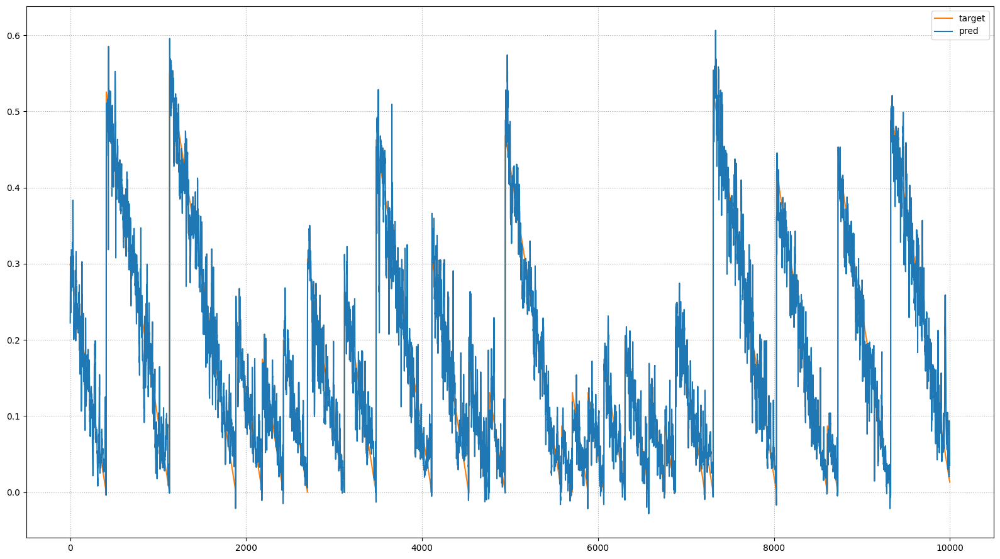

In [ ]:
stop = 10000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM multihead

The third model to address the RUL prediction problem is a Multihaed Neural Network composed by LSTM, Convolutional and Dense layers.

This model processes the input features singularly, then after this initial phase the layers are merged togheter in order to have the final prediction.

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps,1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps,1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm_mh = build_LSTM_multihead(nb_features, sequence_length, nb_out) #models.

lstm_mh.compile(loss=keras.losses.Huber(),
              optimizer=optimizer)

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=150,
        validation_data=(test_sample_multihead, y_test) )

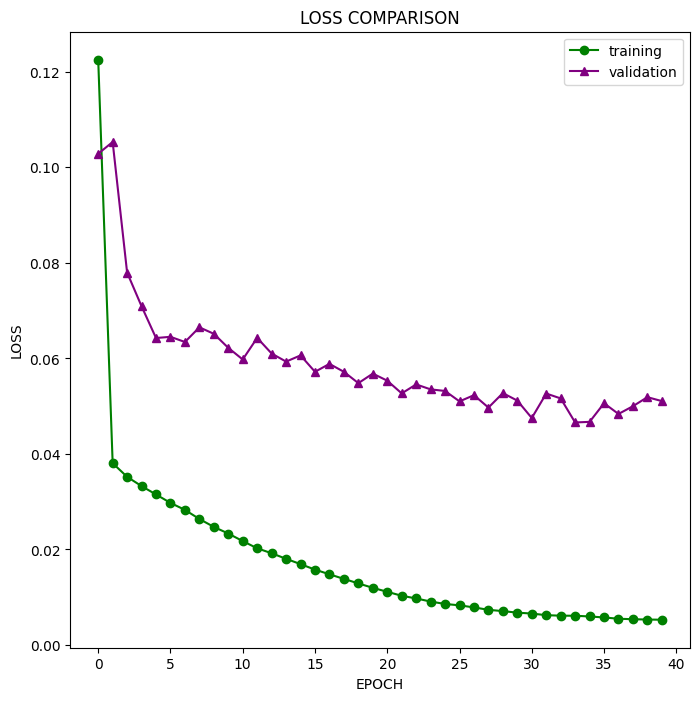

In [ ]:
utils.get_loss_plot(train_history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 2 should be done.

In [ ]:
tr_pred_test = lstm_mh.predict(test_sample_multihead, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, tr_pred_test)}')

584/584 [==============================] - 11s 19ms/step
Test R2 score -0.7084053787891358


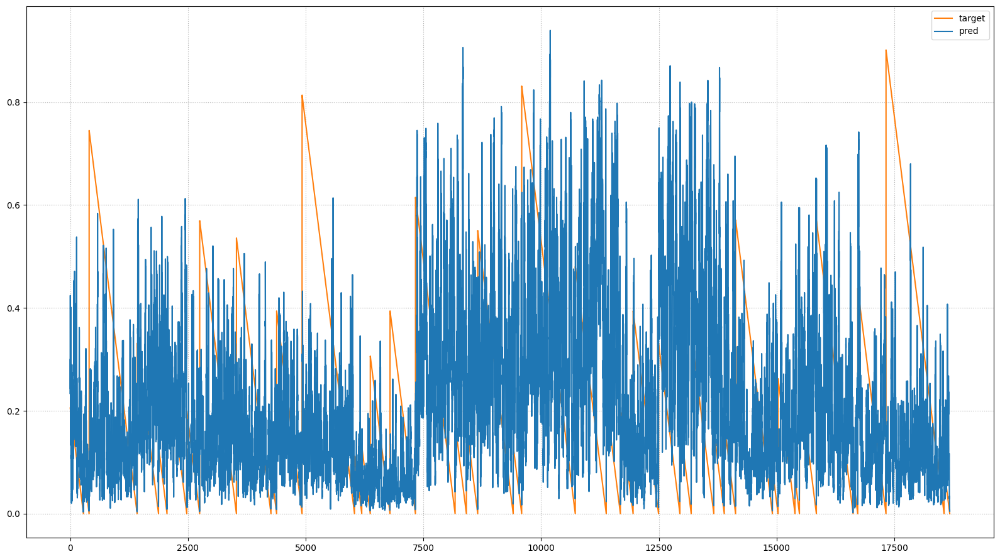

In [ ]:
stop = 20000
utils.plot_rul(tr_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
tr_pred_train = lstm_mh.predict(training_sample_multihead, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, tr_pred_train)}')

2401/2401 [==============================] - 42s 17ms/step
Train R2 score 0.8244467302324787


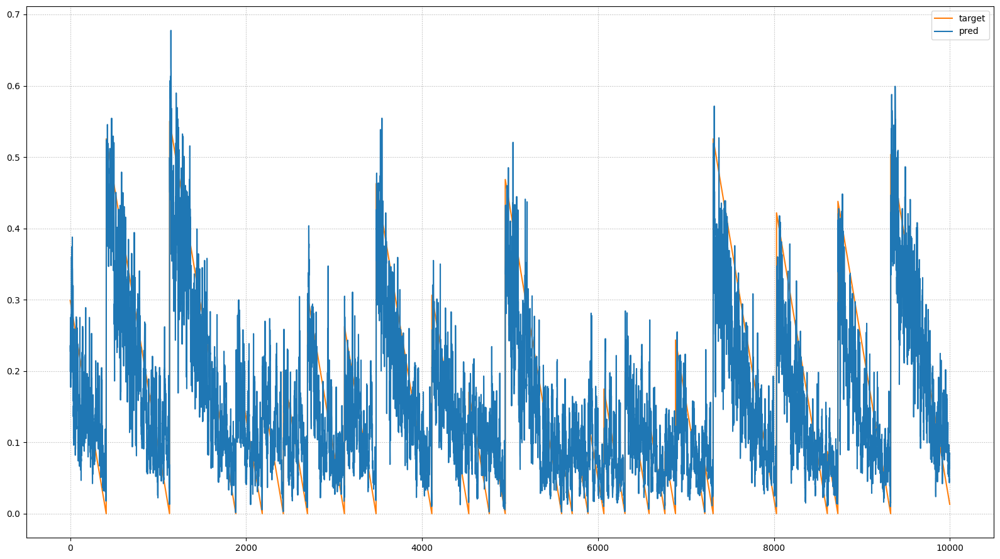

In [ ]:
stop = 10000
utils.plot_rul(tr_pred_train[:stop], y_train[:stop], figsize=(16,9))

### Neuro models

The fourth model to address the RUL prediction problem is a probablity Neural Network composed by three LSTMand three Dense layers.

This model predicts the value and the standard deviation of the RUL of the component 1.

In [ ]:
tr_rul_std = df_train_st[f'rul_comp{comp}'].std()
nnp = models.build_NN(input_shape=(x_train.shape[1], x_train.shape[2]), stddev_guess=tr_rul_std)
print(nnp.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 11)]          0         
                                                                 
 lstm (LSTM)                 (None, 28, 128)           71680     
                                                                 
 lstm_1 (LSTM)               (None, 28, 64)            49408     
                                                                 
 lstm_2 (LSTM)               (None, 32)                12416     
                                                                 
 dense (Dense)               (None, 96)                3168      
                                                                 
 dense_1 (Dense)             (None, 128)               12416     
                                                                 
 dense_2 (Dense)             (None, 2)                 258   

In [ ]:
negloglikelihood = lambda y_true, dist: -dist.log_prob(y_true)
# Compile the model
nnp.compile(optimizer='Adam', loss=negloglikelihood)

In [ ]:
# Train the model
history = nnp.fit(x_train, y_train, epochs=20, verbose=1, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/20
2401/2401 [==============================] - 39s 12ms/step - loss: -0.2778 - val_loss: -0.1057
Epoch 2/20
2401/2401 [==============================] - 27s 11ms/step - loss: -0.3868 - val_loss: 0.0824
Epoch 3/20
2401/2401 [==============================] - 27s 11ms/step - loss: -0.4647 - val_loss: 0.6065
Epoch 4/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.4948 - val_loss: 0.5657
Epoch 5/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.5186 - val_loss: 0.8214
Epoch 6/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.5354 - val_loss: 1.1240
Epoch 7/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.5761 - val_loss: 0.7769
Epoch 8/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.6083 - val_loss: 1.9293
Epoch 9/20
2401/2401 [==============================] - 26s 11ms/step - loss: -0.5893 - val_loss: 2.8646
Epoch 10/20
2401/2401 [==============================]

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 2 should be done.

In [ ]:
nn_pred_ts = nnp(x_test) # simply call the model to obtain a distribution object
np_pred_ts_mean = nn_pred_ts.mean().numpy().ravel()
np_pred_ts_std = nn_pred_ts.stddev().numpy().ravel()

print(f'Test R2 score {r2_score(y_test, np_pred_ts_mean)}')

Test R2 score -0.7182773688883728


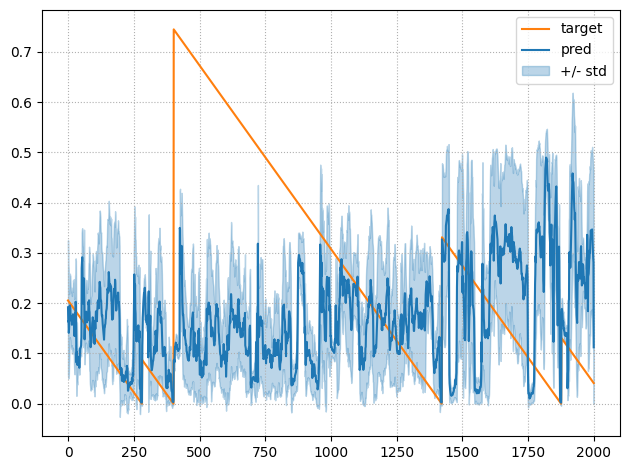

In [ ]:
stop = 2000
utils.plot_rul(target=y_test[:stop], pred=np_pred_ts_mean[:stop], stddev=np_pred_ts_std[:stop])

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In addition the prediction of the standard deviation does not help having  a more accurate and less noisy prediction of the RUL.

In [ ]:
nn_pred_tr = nnp(x_train) # simply call the model to obtain a distribution object
np_pred_tr_mean = nn_pred_tr.mean().numpy().ravel()
np_pred_tr_std = nn_pred_tr.stddev().numpy().ravel()

print(f'Train R2 score {r2_score(y_train, np_pred_tr_mean)}')

Train R2 score 0.29420262359790517


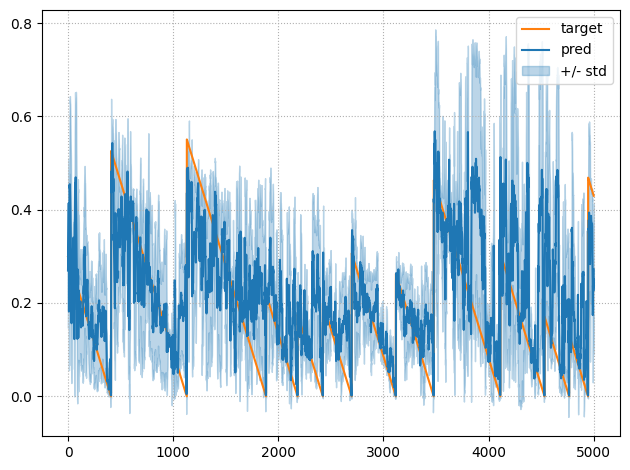

In [ ]:
stop = 5000
utils.plot_rul(target=y_train[:stop], pred=np_pred_tr_mean[:stop], stddev=np_pred_tr_std[:stop])

## Component 3

The component 3 is selected between the 4 components and the data are splitted in 5 different folds.

In [ ]:
# Select component 3
comp = 3

# Generate 5 folds
df_final_folds = utils.generate_k_folds(df_final, 5, 'machineID', comp)
df_final_folds.groupby(['fold'])['machineID'].nunique()

fold
0    6
1    6
2    6
3    7
4    8
Name: machineID, dtype: int64

In [ ]:
# Split data in train and test
df_train, df_test = utils.split_data_fold(df_final_folds, fold = 0)
df_train.shape, df_test.shape

((192459, 35), (44986, 35))

In [ ]:
# Sanity check
set(df_train['machineID'].unique()) & set(df_test['machineID'].unique())

set()

In [ ]:
# Standardize data
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

The data are aggregated in 6 hours windows and the labels for the RUL of the component are generated.

In [ ]:
# 6 hours aggregation
df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

# Recompute RUL after aggregation
df_train = generate_rul(df_agg_6_train, comp=comp)
df_test = generate_rul(df_agg_6_test, comp=comp)

# Standardize RUL
df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)

In [ ]:
df_train_st

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp3,error1,error2,error3,error4,error5,rul_comp3,max_rul_comp3
0,11,2015-01-01 06:00:00,-0.631457,-0.413075,-0.211714,-0.737969,-1.123309,2,0,0,0,0,0,0,0,0.218020,196
1,11,2015-01-01 12:00:00,0.579238,-0.731213,-0.555128,-0.179297,-1.123309,2,0,0,0,0,0,0,0,0.216908,196
2,11,2015-01-01 18:00:00,-1.192718,0.554071,-0.082323,0.730659,-1.123309,2,0,0,0,0,0,0,0,0.215795,196
3,11,2015-01-02 00:00:00,-0.311153,0.188138,0.369930,-0.240826,-1.123309,2,0,0,0,0,0,0,0,0.214683,196
4,11,2015-01-02 06:00:00,0.718271,0.421123,-0.475003,-0.998345,-1.123309,2,0,0,0,0,0,0,0,0.213571,196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32095,98,2015-11-25 06:00:00,-0.270206,-0.358641,1.571669,-0.179811,1.366102,2,0,0,0,0,0,1,0,0.004449,479
32096,98,2015-11-25 12:00:00,-0.076610,-0.152679,2.093558,0.546416,1.366102,2,0,0,0,0,0,0,0,0.003337,479
32097,98,2015-11-25 18:00:00,0.588877,-0.189919,1.940103,0.379293,1.366102,2,0,0,0,0,0,0,0,0.002225,479
32098,98,2015-11-26 00:00:00,-0.013651,0.033016,2.418014,0.522988,1.366102,2,0,0,0,0,0,0,0,0.001112,479


After the features selection step, a sequence of data with a window of 7 days is created.

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 1
sequence_length = time_steps

Data Shape:  (31371, 28, 11)
Label Shape:  (31371,)
Data Shape:  (7342, 28, 11)
Label Shape:  (7342,)


### CNN

The first model to address the RUL prediction problem is a Convolutional Neural Network composed by four CONV1D layers and one Dense layer.


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
cnn = models.build_CNN(columns, nb_out)
cnn.compile(optimizer, 'mse', ['Precision', 'Recall'])

print(cnn.summary())

In [ ]:
history = cnn.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=30, batch_size=64)

Epoch 1/30


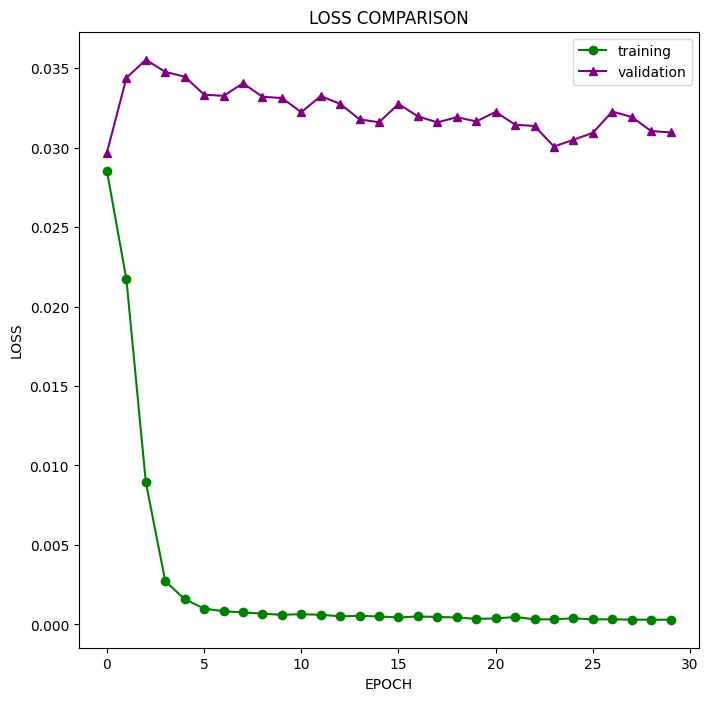

In [ ]:
get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 3 should be done.

In [ ]:
y_pred_test = cnn.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

230/230 [==============================] - 1s 2ms/step
Test R2 score 0.014371529434635155


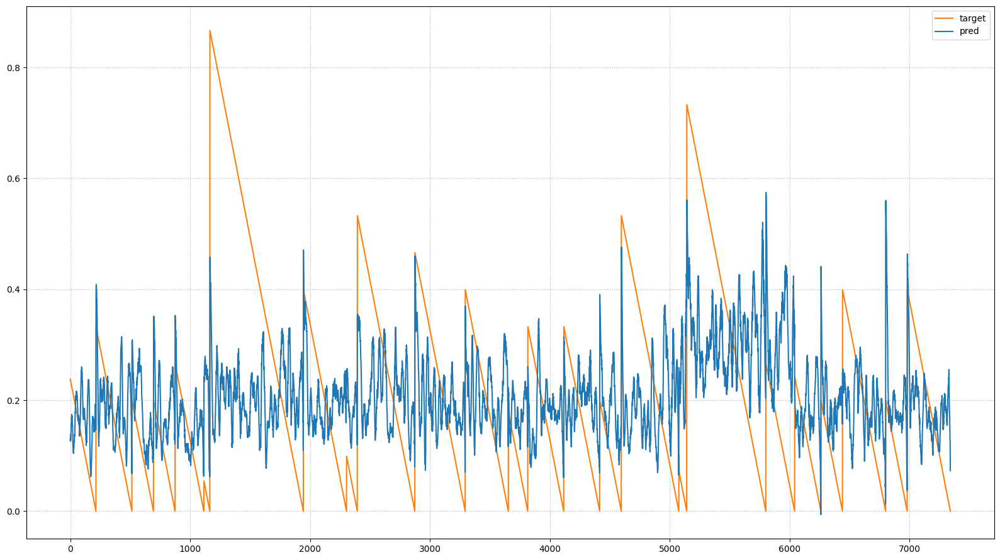

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = cnn.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

981/981 [==============================] - 2s 2ms/step
Train R2 score 0.9894909682789205


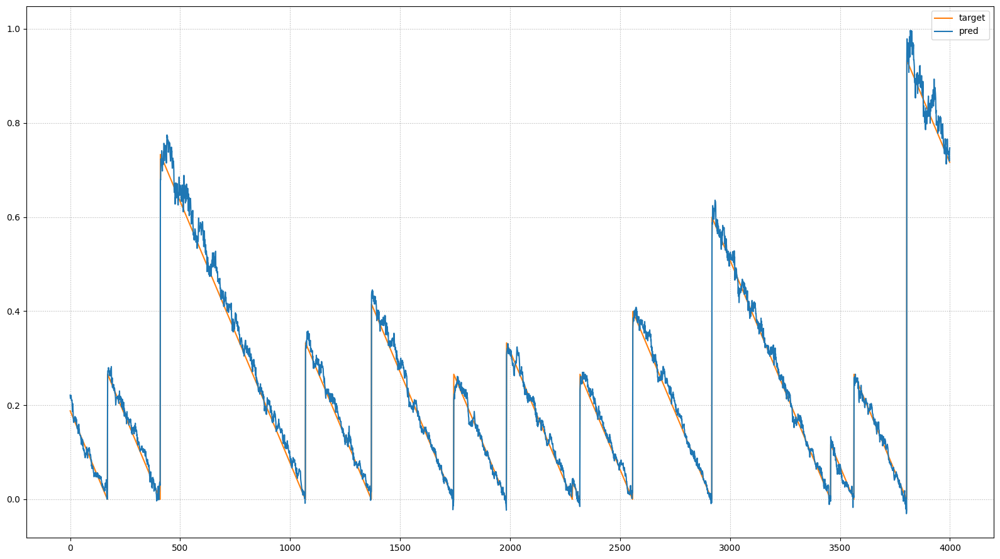

In [ ]:
stop = 4000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM simple

The second model to address the RUL prediction problem is a Recurrent Neural Network composed by three LSTM layers and three Dense layers.


In [ ]:
lstm = models.build_LSTM_simple(time_steps, columns, nb_out)
lstm.compile(loss = "mse", optimizer = keras.optimizers.Adam(learning_rate=0.001))
print(lstm.summary())

In [ ]:
history = lstm.fit(x_train, y_train, epochs = 20, #60
                    validation_data = (x_test, y_test),
                    batch_size = 128)

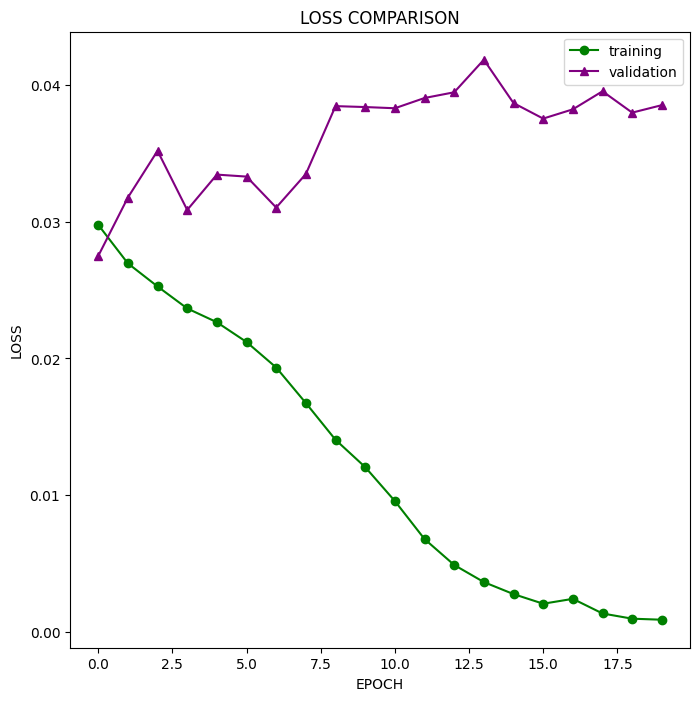

In [ ]:
get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 3 should be done.

In [ ]:
y_pred_test = lstm.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

230/230 [==============================] - 2s 4ms/step
Test R2 score -0.22732749315482392


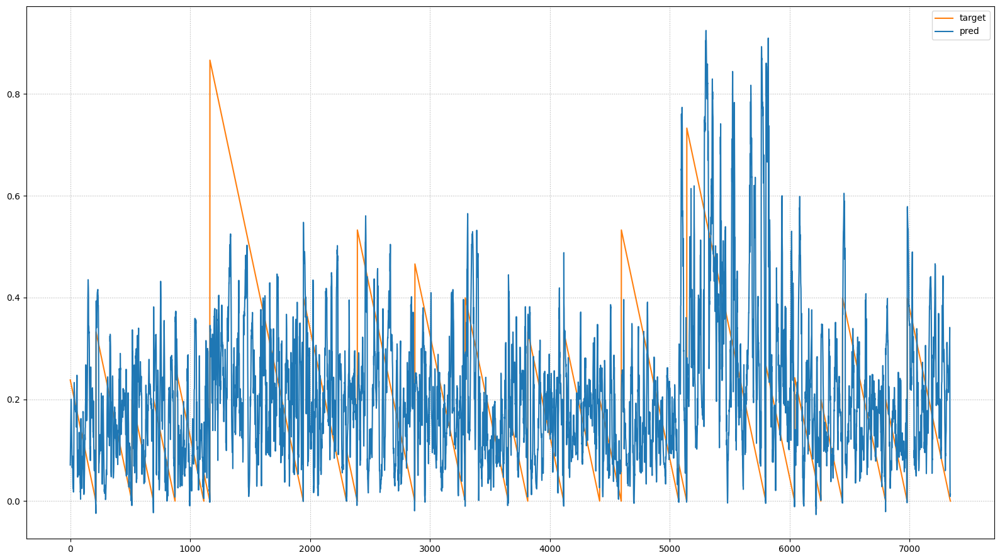

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = lstm.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

981/981 [==============================] - 4s 5ms/step
Train R2 score 0.9768420669061558


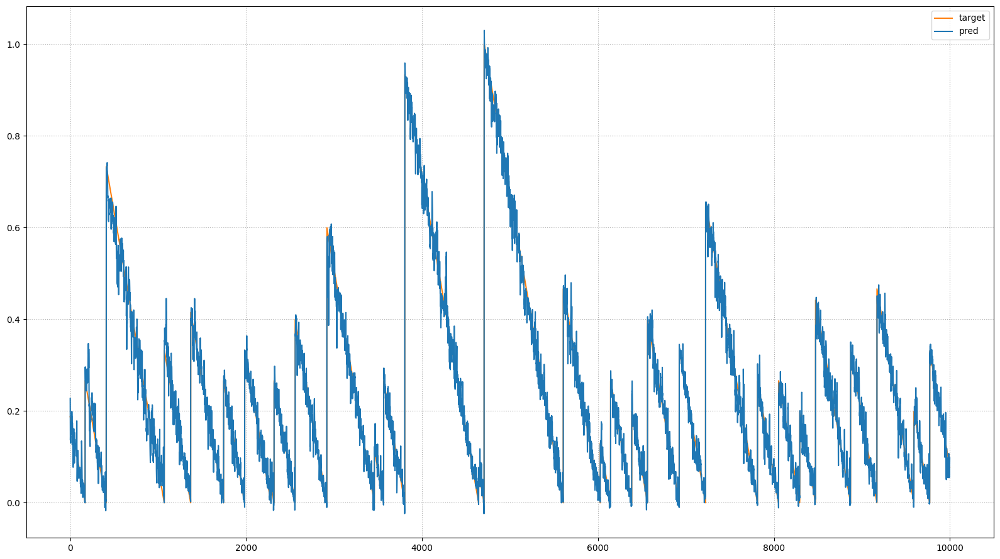

In [ ]:
stop = 10000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM multihead

The third model to address the RUL prediction problem is a Multihaed Neural Network composed by LSTM, Convolutional and Dense layers.

This model processes the input features singularly, then after this initial phase the layers are merged togheter in order to have the final prediction.

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps,1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps,1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm_mh = models.build_LSTM_multihead(nb_features, sequence_length, nb_out)

lstm_mh.compile(loss=keras.losses.Huber(),
              optimizer=optimizer)

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=150,  # 20 epochs
        validation_data=(test_sample_multihead, y_test) )

Epoch 1/150
31/31 [==============================] - 76s 391ms/step - loss: 0.1251 - rmse: 0.2588 - k_score: 18.7686 - val_loss: 0.1450 - val_rmse: 0.3581 - val_k_score: 30.1002
Epoch 2/150
31/31 [==============================] - 5s 158ms/step - loss: 0.1042 - rmse: 0.1945 - k_score: 12.8405 - val_loss: 0.1492 - val_rmse: 0.3703 - val_k_score: 31.2780
Epoch 3/150
31/31 [==============================] - 5s 162ms/step - loss: 0.1002 - rmse: 0.1808 - k_score: 12.3470 - val_loss: 0.1529 - val_rmse: 0.3807 - val_k_score: 32.3143
Epoch 4/150
31/31 [==============================] - 5s 170ms/step - loss: 0.0979 - rmse: 0.1728 - k_score: 11.9102 - val_loss: 0.1560 - val_rmse: 0.3892 - val_k_score: 33.1586
Epoch 5/150
31/31 [==============================] - 5s 163ms/step - loss: 0.0962 - rmse: 0.1672 - k_score: 11.5648 - val_loss: 0.1591 - val_rmse: 0.3977 - val_k_score: 33.9866
Epoch 6/150
31/31 [==============================] - 5s 162ms/step - loss: 0.0948 - rmse: 0.1622 - k_score: 11.257

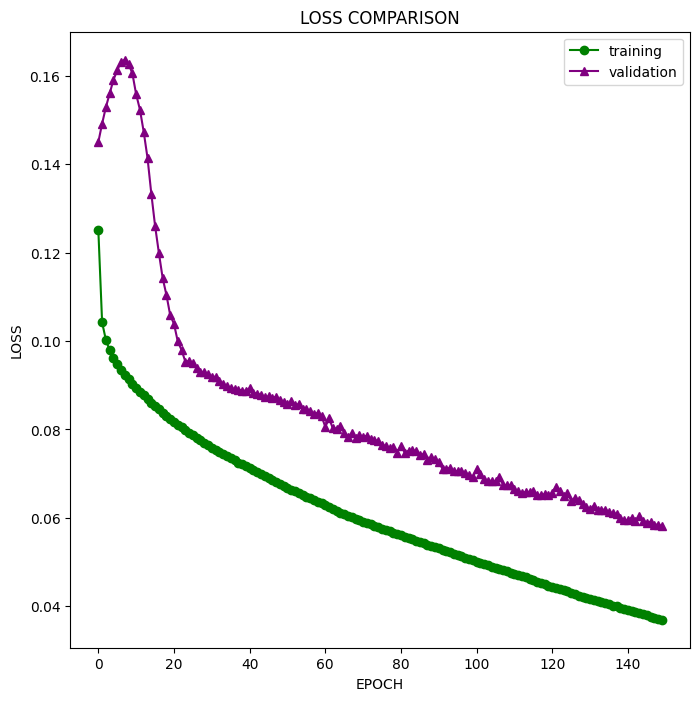

In [ ]:
get_loss_plot(train_history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 3 should be done.

In [ ]:
tr_pred_test = lstm_mh.predict(test_sample_multihead, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

230/230 [==============================] - 9s 17ms/step
Test R2 score -0.22732749315482392


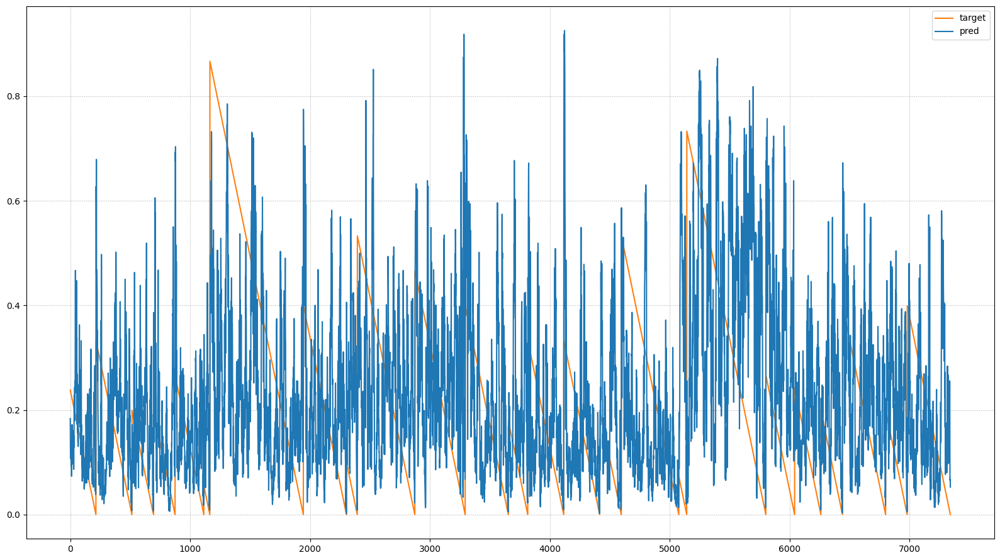

In [ ]:
stop = 20000
utils.plot_rul(tr_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
tr_pred_train = lstm_mh.predict(training_sample_multihead, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

981/981 [==============================] - 18s 18ms/step
Train R2 score 0.9768420669061558


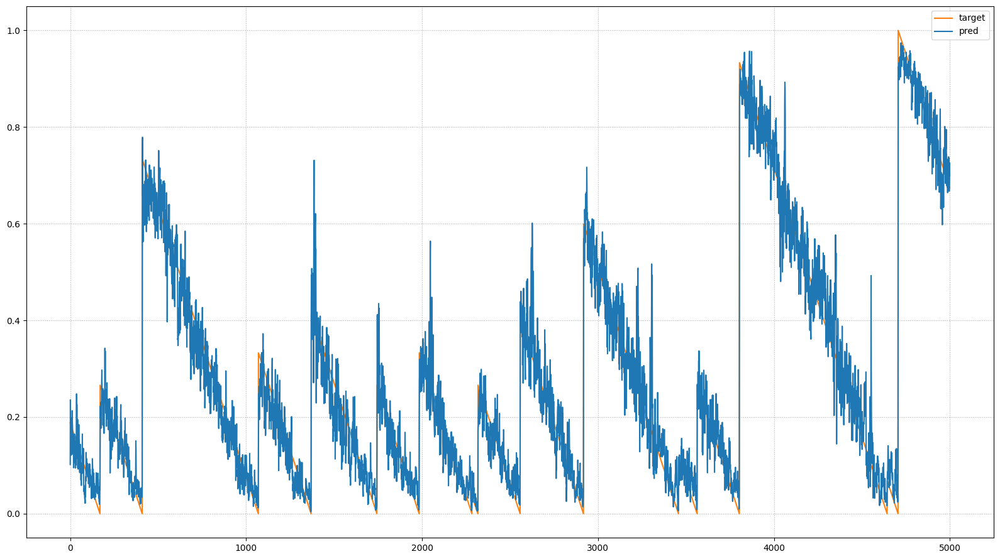

In [ ]:
stop = 5000
utils.plot_rul(tr_pred_train[:stop], y_train[:stop], figsize=(16,9))

### Neuro models

The fourth model to address the RUL prediction problem is a probablity Neural Network composed by three LSTMand three Dense layers.

This model predicts the value and the standard deviation of the RUL of the component 1.

In [ ]:
tr_rul_std = df_train_st[f'rul_comp{comp}'].std()
nnp = models.build_NN(input_shape=(x_train.shape[1], x_train.shape[2]), stddev_guess=tr_rul_std)
print(nnp.summary())

In [ ]:
negloglikelihood = lambda y_true, dist: -dist.log_prob(y_true)
# Compile the model
nnp.compile(optimizer='Adam', loss=negloglikelihood)

In [ ]:
# Train the model
call_backs = [callbacks.EarlyStopping(patience=10, restore_best_weights=True)]
history = nnp.fit(x_train, y_train, callbacks=call_backs, epochs=20, verbose=1, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/10
1584/1584 [==============================] - 25s 12ms/step - loss: -0.2354 - val_loss: -0.0699
Epoch 2/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2361 - val_loss: -0.0765
Epoch 3/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2361 - val_loss: -0.0566
Epoch 4/10
1584/1584 [==============================] - 18s 11ms/step - loss: -0.2367 - val_loss: -0.0802
Epoch 5/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2362 - val_loss: -0.0795
Epoch 6/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2360 - val_loss: -0.0594
Epoch 7/10
1584/1584 [==============================] - 18s 11ms/step - loss: -0.2362 - val_loss: -0.0754
Epoch 8/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2363 - val_loss: -0.0609
Epoch 9/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2366 - val_loss: -0.0721
Epoch 10/10
1584/1584 [=======================

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 3 should be done.

In [ ]:
nn_pred_ts = nnp(x_test) # simply call the model to obtain a distribution object
np_pred_ts_mean = nn_pred_ts.mean().numpy().ravel()
np_pred_ts_std = nn_pred_ts.stddev().numpy().ravel()

print(f'Test R2 score {r2_score(y_test, np_pred_ts_mean)}')

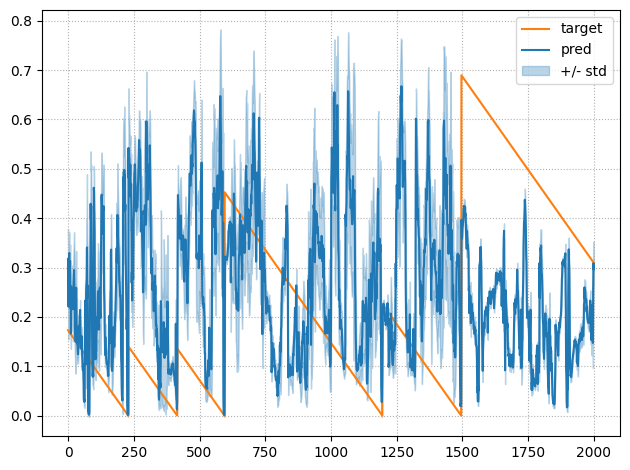

In [ ]:
stop = 2000
utils.plot_rul(target=y_test[:stop], pred=np_pred_ts_mean[:stop],
              stddev=np_pred_ts_std[:stop])

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In addition the prediction of the standard deviation does not help having  a more accurate and less noisy prediction of the RUL.

In [ ]:
nn_pred_tr = nnp(x_train) # simply call the model to obtain a distribution object
np_pred_tr_mean = nn_pred_tr.mean().numpy().ravel()
np_pred_tr_std = nn_pred_tr.stddev().numpy().ravel()

print(f'Train R2 score {r2_score(y_train, np_pred_tr_mean)}')

Train R2 score 0.6677700591429938


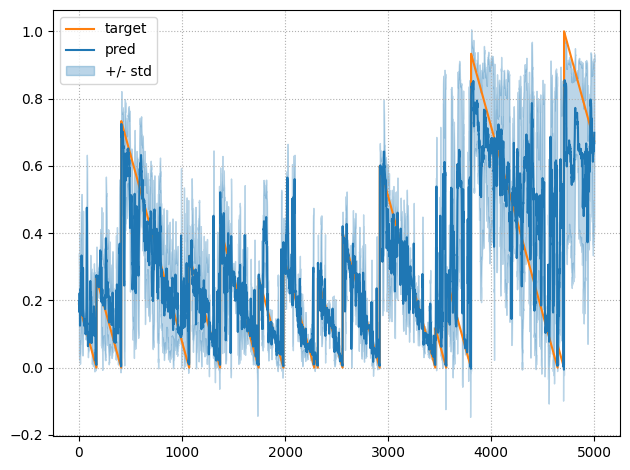

In [ ]:
stop = 5000
plot_rul(target=y_train[:stop], pred=np_pred_tr_mean[:stop], stddev=np_pred_tr_std[:stop])

## Component 4

The component 4 is selected between the 4 components and the data are splitted in 5 different folds.

In [ ]:
# Select component 4
comp = 4

# Generate 5 folds
df_final_folds =  utils.generate_k_folds(df_final, 5, 'machineID', comp)
df_final_folds.groupby(['fold'])['machineID'].nunique()

fold
0    10
1     9
2    10
3    10
4    10
Name: machineID, dtype: int64

In [ ]:
# Split data in train and test
df_train, df_test = utils.split_data_fold(df_final_folds, fold = 0)
df_train.shape, df_test.shape

((275774, 35), (73284, 35))

In [ ]:
# Sanity check
set(df_train['machineID'].unique()) & set(df_test['machineID'].unique())

set()

In [ ]:
# Standardize data
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

The data are aggregated in 6 hours windows and the labels for the RUL of the component are generated.

In [ ]:
# 6 hours aggregation
df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

# Recompute RUL after aggregation
df_train = generate_rul(df_agg_6_train, comp=comp)
df_test = generate_rul(df_agg_6_test, comp=comp)

# Standardize RUL
df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)

In [ ]:
df_train_st

,machineID,datetime,volt,rotate,pressure,vibration,age,model,binary_failure,fail_comp4,error1,error2,error3,error4,error5,rul_comp4,max_rul_comp4
0,1,2015-01-05 06:00:00,-0.380788,0.030256,0.682702,-0.476264,0.809986,3,0,0,0,0,0,0,0,0.579456,660
1,1,2015-01-05 12:00:00,0.742447,0.137165,-0.011835,-0.272525,0.809986,3,0,0,0,0,0,0,0,0.578578,660
2,1,2015-01-05 18:00:00,-0.241553,0.698185,0.206859,0.078471,0.809986,3,0,0,0,0,0,0,0,0.577700,660
3,1,2015-01-06 00:00:00,-0.120267,0.636823,0.353441,-0.162561,0.809986,3,0,0,0,0,0,0,0,0.576822,660
4,1,2015-01-06 06:00:00,0.696741,-0.185721,-0.319411,0.213733,0.809986,3,0,0,0,0,0,0,0,0.575944,660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45991,99,2015-12-13 06:00:00,0.585662,-1.170638,2.225636,1.232960,-1.060191,1,0,0,0,0,0,0,1,0.003512,179
45992,99,2015-12-13 12:00:00,0.309837,-1.333978,1.923032,1.924199,-1.060191,1,0,0,0,0,0,0,0,0.002634,179
45993,99,2015-12-13 18:00:00,-0.332695,-1.005304,2.358052,1.942996,-1.060191,1,0,0,0,0,0,0,0,0.001756,179
45994,99,2015-12-14 00:00:00,0.199596,-1.003800,1.667393,1.803171,-1.060191,1,0,0,0,0,0,0,0,0.000878,179


After the features selection step, a sequence of data with a window of 7 days is created.

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 1
sequence_length = time_steps

Data Shape:  (44943, 28, 11)
Label Shape:  (44943,)
Data Shape:  (11954, 28, 11)
Label Shape:  (11954,)


### CNN

The first model to address the RUL prediction problem is a Convolutional Neural Network composed by four CONV1D layers and one Dense layer.


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
cnn = models.build_CNN(columns, nb_out)
cnn.compile(optimizer, 'mse', ['Precision', 'Recall'])

print(cnn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 27, 32)            736       
                                                                 
 conv1d_1 (Conv1D)           (None, 26, 128)           8320      
                                                                 
 conv1d_2 (Conv1D)           (None, 25, 128)           32896     
                                                                 
 conv1d_3 (Conv1D)           (None, 24, 64)            16448     
                                                                 
 max_pooling1d (MaxPooling1  (None, 12, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 768)               0         
                                                        

In [ ]:
history = cnn.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=30, batch_size=64)

Epoch 1/30
703/703 [==============================] - 13s 8ms/step - loss: 0.0227 - precision: 1.0000 - recall: 8.9276e-05 - val_loss: 0.0434 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
703/703 [==============================] - 4s 6ms/step - loss: 0.0198 - precision: 1.0000 - recall: 0.0011 - val_loss: 0.0485 - val_precision: 1.0000 - val_recall: 0.0169
Epoch 3/30
703/703 [==============================] - 4s 6ms/step - loss: 0.0131 - precision: 1.0000 - recall: 0.0159 - val_loss: 0.0484 - val_precision: 1.0000 - val_recall: 0.0196
Epoch 4/30
703/703 [==============================] - 5s 7ms/step - loss: 0.0055 - precision: 1.0000 - recall: 0.0339 - val_loss: 0.0476 - val_precision: 1.0000 - val_recall: 0.0064
Epoch 5/30
703/703 [==============================] - 4s 6ms/step - loss: 0.0026 - precision: 1.0000 - recall: 0.0389 - val_loss: 0.0481 - val_precision: 1.0000 - val_recall: 0.0017
Epoch 6/30
703/703 [==============================] - 4s 6ms/step - loss: 0.0

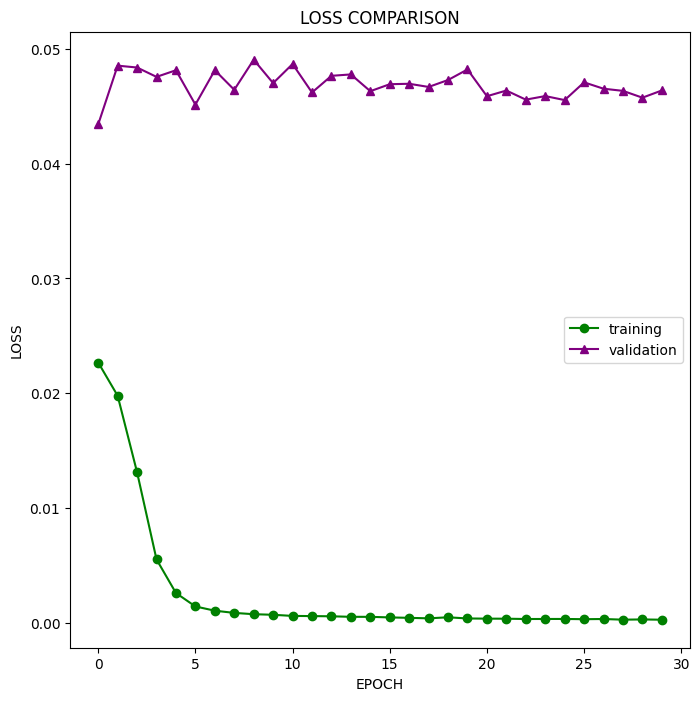

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 4 should be done.

In [ ]:
y_pred_test = cnn.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

374/374 [==============================] - 1s 3ms/step
Test R2 score -0.15456295029775635


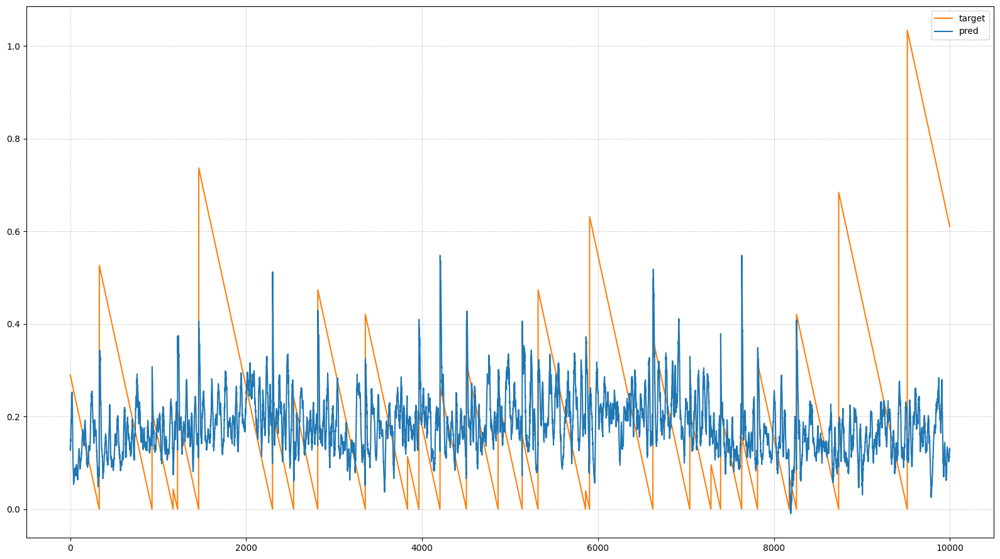

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = cnn.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

1405/1405 [==============================] - 3s 2ms/step
Train R2 score 0.9877675449257722


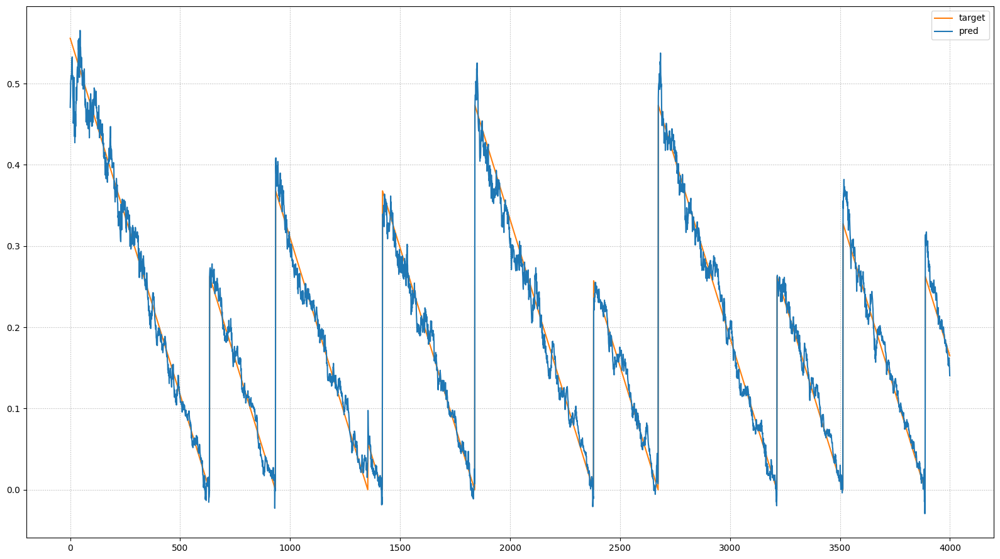

In [ ]:
stop = 4000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM simple

The second model to address the RUL prediction problem is a Recurrent Neural Network composed by three LSTM layers and three Dense layers.


In [ ]:
lstm = models.build_LSTM_simple(time_steps, columns, nb_out)
lstm.compile(loss = "mse", optimizer = keras.optimizers.Adam(learning_rate=0.001))
print(lstm.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 28, 128)           71680     
                                                                 
 lstm_1 (LSTM)               (None, 28, 64)            49408     
                                                                 
 lstm_2 (LSTM)               (None, 32)                12416     
                                                                 
 dense_1 (Dense)             (None, 96)                3168      
                                                                 
 dense_2 (Dense)             (None, 128)               12416     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 149217 (582.88 KB)
Trainable params: 149

In [ ]:
history = lstm.fit(x_train, y_train, epochs = 20, #60
                    validation_data = (x_test, y_test),
                    batch_size = 128)

Epoch 1/20
352/352 [==============================] - 12s 15ms/step - loss: 0.0225 - val_loss: 0.0439
Epoch 2/20
352/352 [==============================] - 5s 13ms/step - loss: 0.0212 - val_loss: 0.0460
Epoch 3/20
352/352 [==============================] - 4s 10ms/step - loss: 0.0204 - val_loss: 0.0430
Epoch 4/20
352/352 [==============================] - 4s 11ms/step - loss: 0.0196 - val_loss: 0.0429
Epoch 5/20
352/352 [==============================] - 5s 13ms/step - loss: 0.0187 - val_loss: 0.0435
Epoch 6/20
352/352 [==============================] - 4s 12ms/step - loss: 0.0174 - val_loss: 0.0461
Epoch 7/20
352/352 [==============================] - 4s 11ms/step - loss: 0.0167 - val_loss: 0.0452
Epoch 8/20
352/352 [==============================] - 4s 12ms/step - loss: 0.0152 - val_loss: 0.0456
Epoch 9/20
352/352 [==============================] - 4s 12ms/step - loss: 0.0133 - val_loss: 0.0481
Epoch 10/20
352/352 [==============================] - 4s 10ms/step - loss: 0.0115 - val_l

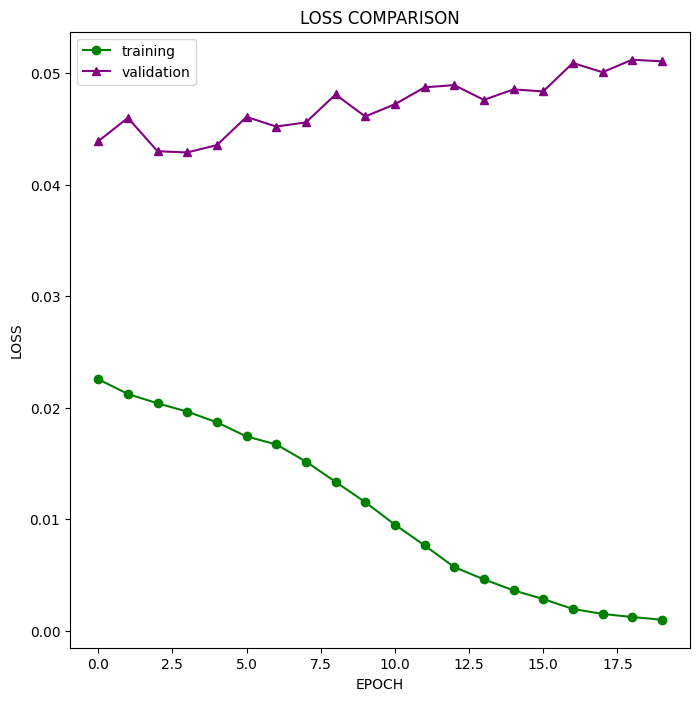

In [ ]:
utils.get_loss_plot(history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 4 should be done.

In [ ]:
y_pred_test = lstm.predict(x_test, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

374/374 [==============================] - 4s 5ms/step
Test R2 score -0.2711586649180451


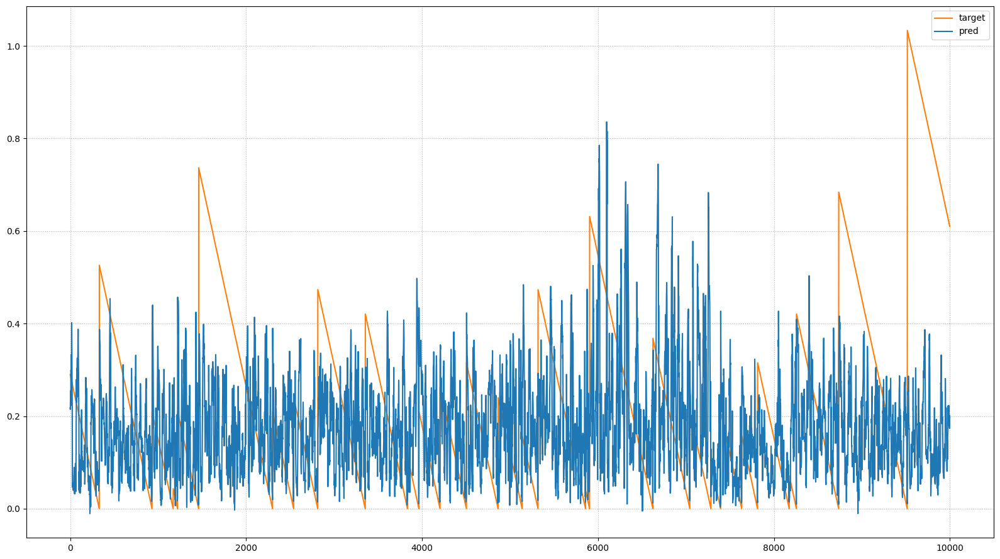

In [ ]:
stop = 10000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
y_pred_train = lstm.predict(x_train, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

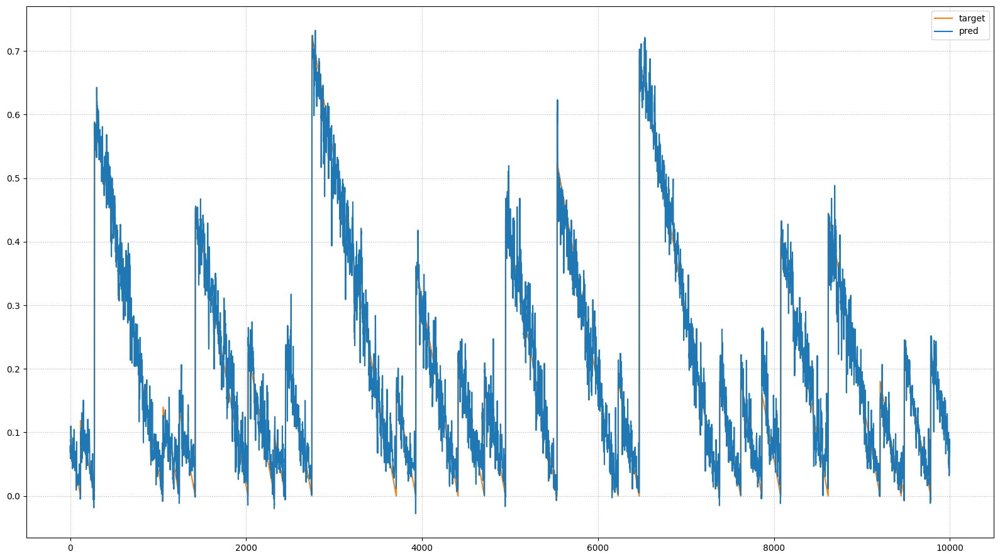

In [ ]:
stop = 10000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

### LSTM multihead

The third model to address the RUL prediction problem is a Multihaed Neural Network composed by LSTM, Convolutional and Dense layers.

This model processes the input features singularly, then after this initial phase the layers are merged togheter in order to have the final prediction.

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps,1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps,1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm_mh = models.build_LSTM_multihead(nb_features, sequence_length, nb_out)

lstm_mh.compile(loss=keras.losses.Huber(),
              optimizer=optimizer)

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=150,  # 20 epochs
        validation_data=(test_sample_multihead, y_test) )

Epoch 1/150
44/44 [==============================] - 75s 291ms/step - loss: 0.1255 - rmse: 0.2615 - k_score: 16.0109 - val_loss: 0.1230 - val_rmse: 0.2476 - val_k_score: 16.0364
Epoch 2/150
44/44 [==============================] - 7s 163ms/step - loss: 0.1150 - rmse: 0.2402 - k_score: 14.7850 - val_loss: 0.1222 - val_rmse: 0.2462 - val_k_score: 16.0035
Epoch 3/150
44/44 [==============================] - 7s 157ms/step - loss: 0.1136 - rmse: 0.2402 - k_score: 14.7831 - val_loss: 0.1220 - val_rmse: 0.2468 - val_k_score: 16.1356
Epoch 4/150
44/44 [==============================] - 8s 171ms/step - loss: 0.1124 - rmse: 0.2401 - k_score: 14.7817 - val_loss: 0.1217 - val_rmse: 0.2460 - val_k_score: 16.2006
Epoch 5/150
44/44 [==============================] - 7s 164ms/step - loss: 0.1113 - rmse: 0.2402 - k_score: 14.7849 - val_loss: 0.1223 - val_rmse: 0.2473 - val_k_score: 16.3848
Epoch 6/150
44/44 [==============================] - 7s 160ms/step - loss: 0.1105 - rmse: 0.2401 - k_score: 14.780

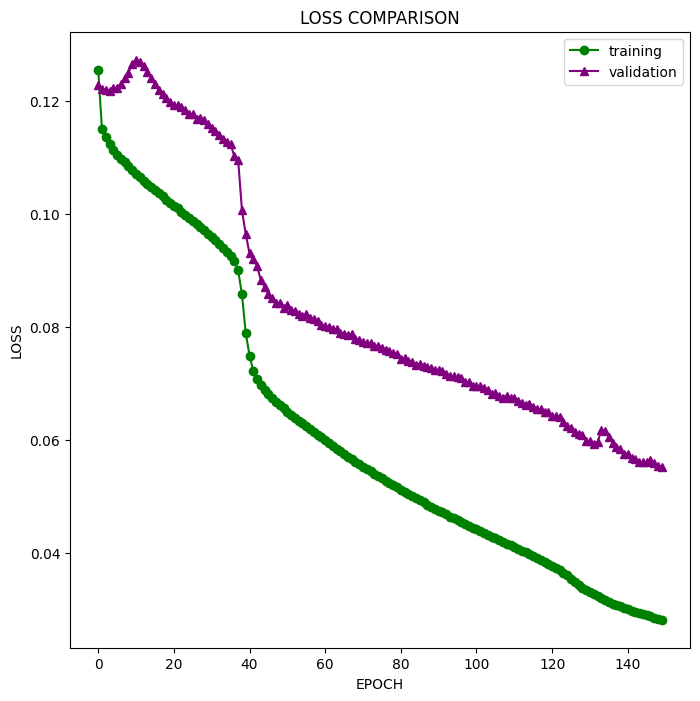

In [ ]:
get_loss_plot(train_history)

From the obtained results on the test set it si possible to notice how the model cannot generalize well. Indeed the the RUL prediction on the test set cannot be used to estimate when the mainteninace of the componet 4 should be done.

In [ ]:
tr_pred_test = lstm_mh.predict(test_sample_multihead, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, tr_pred_test)}')

374/374 [==============================] - 10s 28ms/step
Test R2 score -0.40806257802377766


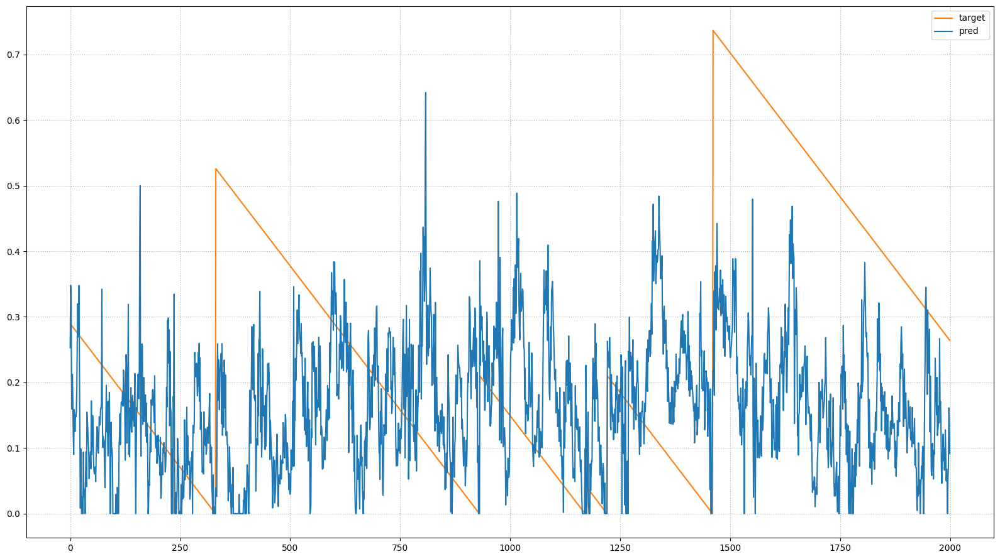

In [ ]:
stop = 2000
plot_rul(tr_pred_test[:stop], y_test[:stop], figsize=(16,9))

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is overfitting the training data.

In [ ]:
tr_pred_train = lstm_mh.predict(training_sample_multihead, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, tr_pred_train)}')

1405/1405 [==============================] - 43s 31ms/step
Train R2 score 0.9024054796304865


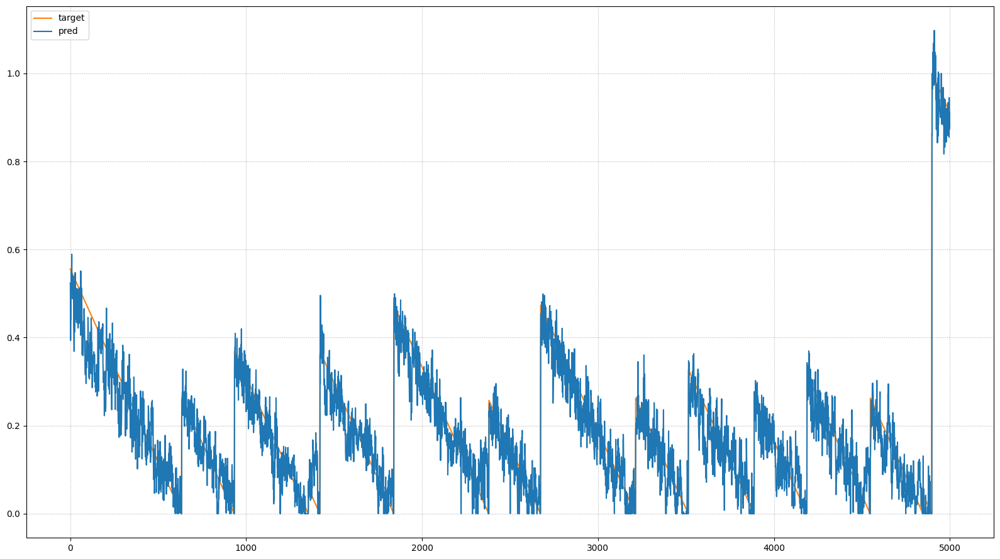

In [ ]:
stop = 5000
plot_rul(tr_pred_train[:stop], y_train[:stop], figsize=(16,9))

### Neuro models

The fourth model to address the RUL prediction problem is a probablity Neural Network composed by three LSTMand three Dense layers.

This model predicts the value and the standard deviation of the RUL of the component 1.

In [ ]:
tr_rul_std = df_train_st[f'rul_comp{comp}'].std()
nnp = models.build_NN(input_shape=(x_train.shape[1], x_train.shape[2]), stddev_guess=tr_rul_std)
print(nnp.summary())

In [ ]:
negloglikelihood = lambda y_true, dist: -dist.log_prob(y_true)
# Compile the model
nnp.compile(optimizer='Adam', loss=negloglikelihood)

In [ ]:
# Train the model
history = nnp.fit(x_train, y_train, epochs=20, verbose=1, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/10
1584/1584 [==============================] - 25s 12ms/step - loss: -0.2354 - val_loss: -0.0699
Epoch 2/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2361 - val_loss: -0.0765
Epoch 3/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2361 - val_loss: -0.0566
Epoch 4/10
1584/1584 [==============================] - 18s 11ms/step - loss: -0.2367 - val_loss: -0.0802
Epoch 5/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2362 - val_loss: -0.0795
Epoch 6/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2360 - val_loss: -0.0594
Epoch 7/10
1584/1584 [==============================] - 18s 11ms/step - loss: -0.2362 - val_loss: -0.0754
Epoch 8/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2363 - val_loss: -0.0609
Epoch 9/10
1584/1584 [==============================] - 17s 11ms/step - loss: -0.2366 - val_loss: -0.0721
Epoch 10/10
1584/1584 [=======================

In [ ]:
nn_pred_ts = nnp(x_test) # simply call the model to obtain a distribution object
np_pred_ts_mean = nn_pred_ts.mean().numpy().ravel()
np_pred_ts_std = nn_pred_ts.stddev().numpy().ravel()

print(f'Test R2 score {r2_score(y_test, np_pred_ts_mean)}')

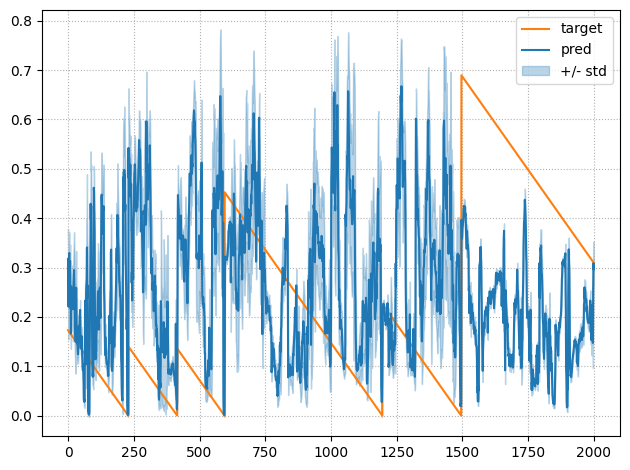

In [ ]:
stop = 2000
utils.plot_rul(target=y_test[:stop], pred=np_pred_ts_mean[:stop],
              stddev=np_pred_ts_std[:stop])

Considering the predictions on the training set however it is possible to notice how the model can learn but cannot generalize meaning that the model is clearly overfitting the training data.

In addition the prediction of the standard deviation does not help having  a more accurate and less noisy prediction of the RUL.

In [ ]:
nn_pred_tr = nnp(x_train) # simply call the model to obtain a distribution object
np_pred_tr_mean = nn_pred_tr.mean().numpy().ravel()
np_pred_tr_std = nn_pred_tr.stddev().numpy().ravel()

print(f'Train R2 score {r2_score(y_train, np_pred_tr_mean)}')

In [ ]:
stop = 2000
utils.plot_rul(target=y_train[:stop], pred=np_pred_tr_mean[:stop],
              stddev=np_pred_tr_std[:stop])

## Limited RUL with component 2 and LSTM multihead

RUL prediction experiments performed so far didn't achieve the desired results.

In principle, in RUL prediction we are more interested in having accurate predictions close to the failures and we don't care too much about the predictions at the beginning of each cycle. We therefore decided to manipulate the RUL values with the aim of making the model focus only on the predictions for the last period of the cycles, i.e. when the failure is actually approaching.

In order to achieve this, we assumed to be interested in accurate predictions when the failures were closer than 30 days, i.e. 24h*30 = 720 hours. So we "flattened" all RUL values greater than 720 by assigning them exactly the maximum value of 720.

Then, we trained the LSTM multihead only on component 2 to see whether this approach could lead to better results.

In [ ]:
# Select component 2
comp = 2

# Generate 5 folds
df_final_folds =  utils.generate_k_folds(df_final, 5, 'machineID', comp)
df_final_folds.groupby(['fold'])['machineID'].nunique()

fold
0    17
1    17
2    18
3    20
4    18
Name: machineID, dtype: int64

In [ ]:
# Split data in train and test
df_train, df_test = utils.split_data_fold(df_final_folds, 0)
df_train.shape, df_test.shape

((472259, 35), (114730, 35))

In [ ]:
# Standardize data
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

In [ ]:
# 6 hours aggregation
df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

# Recompute RUL after aggregation
limit_rul = 180 # 180 = 24 ore * 30gg / 4 per aggregation 6H
df_train = generate_rul(df_agg_6_train, limit_rul = limit_rul, comp=comp)
df_test = generate_rul(df_agg_6_test, limit_rul = limit_rul, comp=comp)

# Standardize RUL
df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 1
sequence_length = time_steps

Data Shape:  (76804, 28, 11)
Label Shape:  (76804,)
Data Shape:  (18678, 28, 11)
Label Shape:  (18678,)


### LSTM multihead

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps,1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps,1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm_mh = models.build_LSTM_multihead(nb_features, sequence_length, nb_out)

lstm_mh.compile(loss=keras.losses.Huber(),
              optimizer=optimizer)

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=150,
        validation_data=(test_sample_multihead, y_test) )

Epoch 1/150
76/76 [==============================] - 76s 249ms/step - loss: 0.2587 - val_loss: 0.4418
Epoch 2/150
76/76 [==============================] - 13s 174ms/step - loss: 0.1839 - val_loss: 0.4022
Epoch 3/150
76/76 [==============================] - 13s 172ms/step - loss: 0.1598 - val_loss: 0.3301
Epoch 4/150
76/76 [==============================] - 13s 174ms/step - loss: 0.1477 - val_loss: 0.2638
Epoch 5/150
76/76 [==============================] - 12s 162ms/step - loss: 0.1409 - val_loss: 0.2163
Epoch 6/150
76/76 [==============================] - 13s 167ms/step - loss: 0.1360 - val_loss: 0.1965
Epoch 7/150
76/76 [==============================] - 12s 161ms/step - loss: 0.1324 - val_loss: 0.1951
Epoch 8/150
76/76 [==============================] - 12s 162ms/step - loss: 0.1305 - val_loss: 0.1957
Epoch 9/150
76/76 [==============================] - 12s 163ms/step - loss: 0.1291 - val_loss: 0.1734
Epoch 10/150
76/76 [==============================] - 14s 187ms/step - loss: 0.127

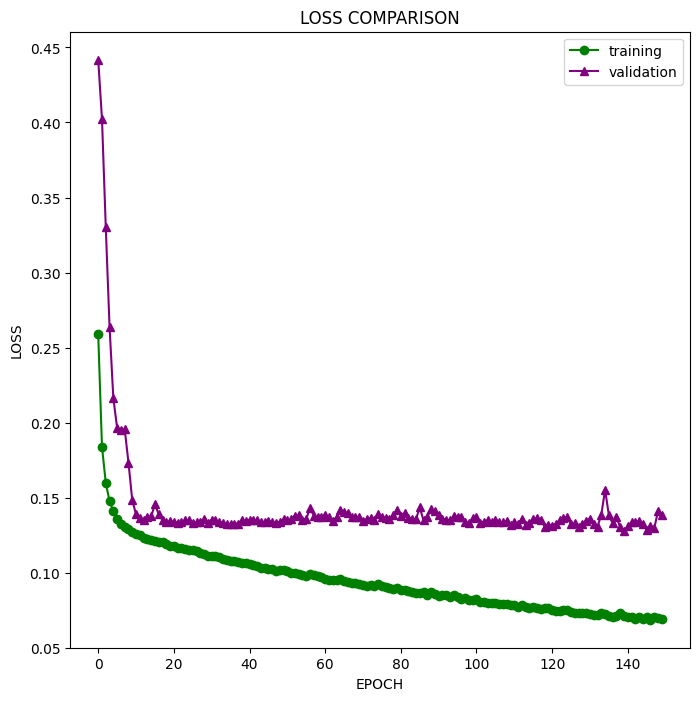

In [ ]:
utils.get_loss_plot(train_history)

In [ ]:
y_pred_test = lstm_mh.predict(test_sample_multihead, verbose=1).ravel()
print(f'Test R2 score {r2_score(y_test, y_pred_test)}')

584/584 [==============================] - 20s 19ms/step
Test R2 score -0.6917484636962108


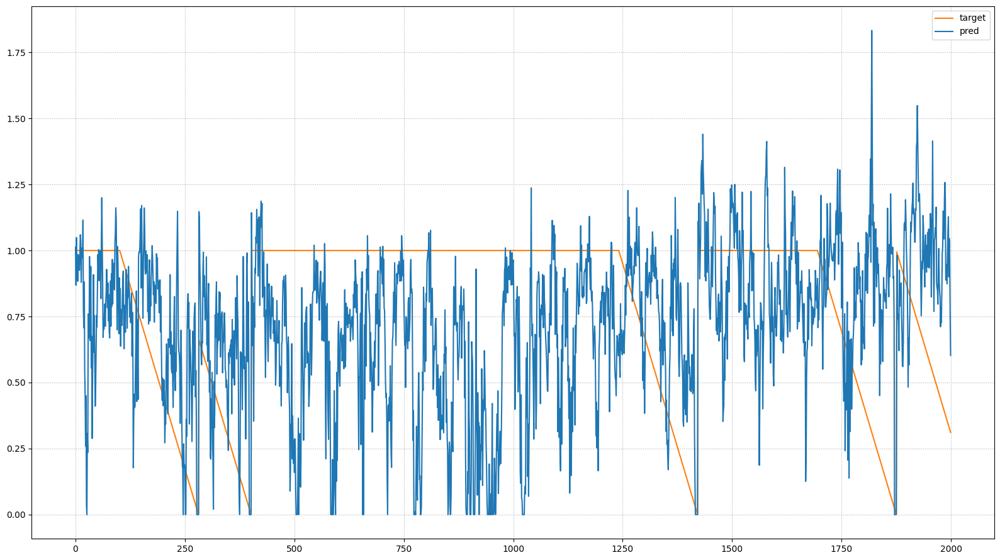

In [ ]:
stop = 2000
utils.plot_rul(y_pred_test[:stop], y_test[:stop], figsize=(16,9))

In [ ]:
y_pred_train = lstm_mh.predict(training_sample_multihead, verbose=1).ravel()
print(f'Train R2 score {r2_score(y_train, y_pred_train)}')

2401/2401 [==============================] - 49s 20ms/step
Train R2 score 0.6793693817413402


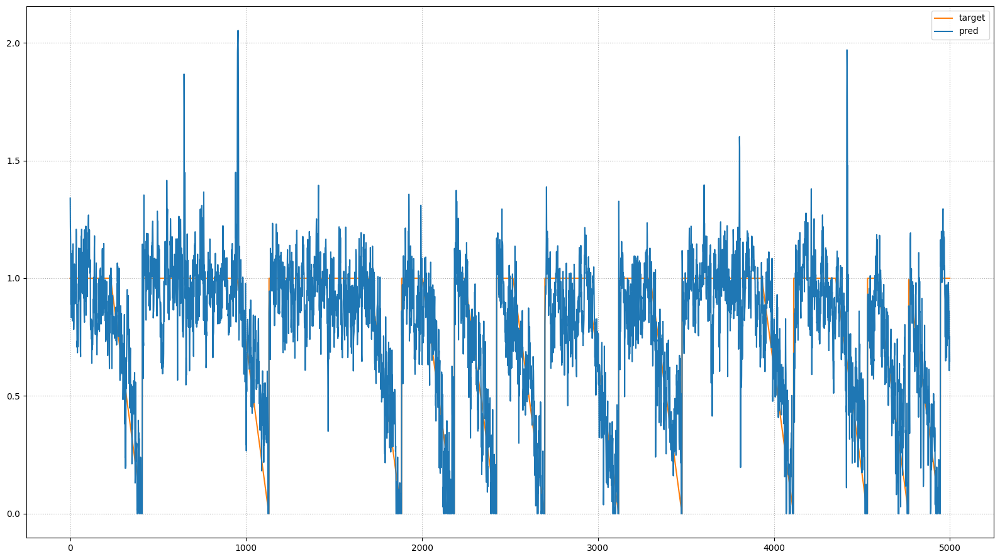

In [ ]:
stop = 5000
utils.plot_rul(y_pred_train[:stop], y_train[:stop], figsize=(16,9))

Unfortunately, the predictions on the test set didn't improve and the model still learnt only on the training set, without being able to generalize.

## Cross validation with component 2 and Neuro Model

All the experiments carried out so far were unsuccessful. They all have been performed on the same partition of the dataset, using always the same 4 folds for training and 1 fold for testing.

Thus, for being sure that we didn't unluckily pick a problematic test fold, we run a 5-folds cross validation, each time training and testing on different partitions of the dataset.

For computational reasons, we only run the cross-validation experiments on the component 2, using the Neuro Model.

In [ ]:
def train(model, x_train, y_train, x_test, y_test, epochs):

  negloglikelihood = lambda y_true, dist: -dist.log_prob(y_true)
  model.compile(optimizer='Adam', loss=negloglikelihood)

  history = model.fit(x_train, y_train, epochs=20, verbose=1, batch_size=32, validation_data=(x_test, y_test))

  return {'model': model}

def prepare_data(df, comp, fold):

    df_train, df_test = utils.split_data_fold(df, fold)
    df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test, comp)

    df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
    df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

    df_train = generate_rul(df_agg_6_train, comp=comp)
    df_test = generate_rul(df_agg_6_test, comp=comp)

    df_train_st, df_test_st = utils.standardise_rul_train_test(df_train, df_test, comp)


    return df_train_st, df_test_st

In [ ]:
comp = 2
columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

df_folds =  utils.generate_k_folds(df_final, 5, 'machineID', comp)
folds = df_folds['fold'].unique()

models_dict = {}
x_test_folds = {}
y_test_folds = {}

for fold in folds:

  # Get df_train and df_test already standardized
  df_train_st, df_test_st = prepare_data(df_folds, comp, fold)

  x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
  x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

  nb_timesteps = x_train.shape[1]
  nb_features = x_train.shape[2]
  nb_out = 1
  sequence_length = time_steps

  x_test_folds[fold] = x_test
  y_test_folds[fold] = y_test

  # Build Neuro model
  tr_rul_std = df_train_st[f'rul_comp{comp}'].std()
  nnp = models.build_NN(input_shape=(x_train.shape[1], x_train.shape[2]), stddev_guess=tr_rul_std)

  # Train
  output = train(nnp, x_train, y_train, x_test, y_test, epochs=20)

  models_dict[fold] = output['model']

Data Shape:  (76046, 28, 11)
Label Shape:  (76046,)
Data Shape:  (19436, 28, 11)
Label Shape:  (19436,)
Epoch 1/20
2377/2377 [==============================] - 45s 14ms/step - loss: -0.2444 - val_loss: -0.1972
Epoch 2/20
2377/2377 [==============================] - 36s 15ms/step - loss: -0.3054 - val_loss: -0.2815
Epoch 3/20
2377/2377 [==============================] - 25s 11ms/step - loss: -0.3963 - val_loss: -0.2193
Epoch 4/20
2377/2377 [==============================] - 25s 11ms/step - loss: -0.4301 - val_loss: -0.1994
Epoch 5/20
2377/2377 [==============================] - 25s 10ms/step - loss: -0.4566 - val_loss: -0.1453
Epoch 6/20
2377/2377 [==============================] - 25s 11ms/step - loss: -0.4784 - val_loss: -0.1297
Epoch 7/20
2377/2377 [==============================] - 26s 11ms/step - loss: -0.4973 - val_loss: -0.0534
Epoch 8/20
2377/2377 [==============================] - 25s 11ms/step - loss: -0.5314 - val_loss: 0.0988
Epoch 9/20
2377/2377 [===========================

In [ ]:
def get_plot_rul(pred=None, target=None, ax = None, fold = None):
    if target is not None:
        ax.plot(range(len(target)), target, label='target', color='tab:orange')
    if pred is not None:
        ax.plot(range(len(pred)), pred, label='pred',
                color='tab:blue')
    ax.legend()
    ax.grid(linestyle=':')
    ax.set_title(f'Test predictions fold {fold}')

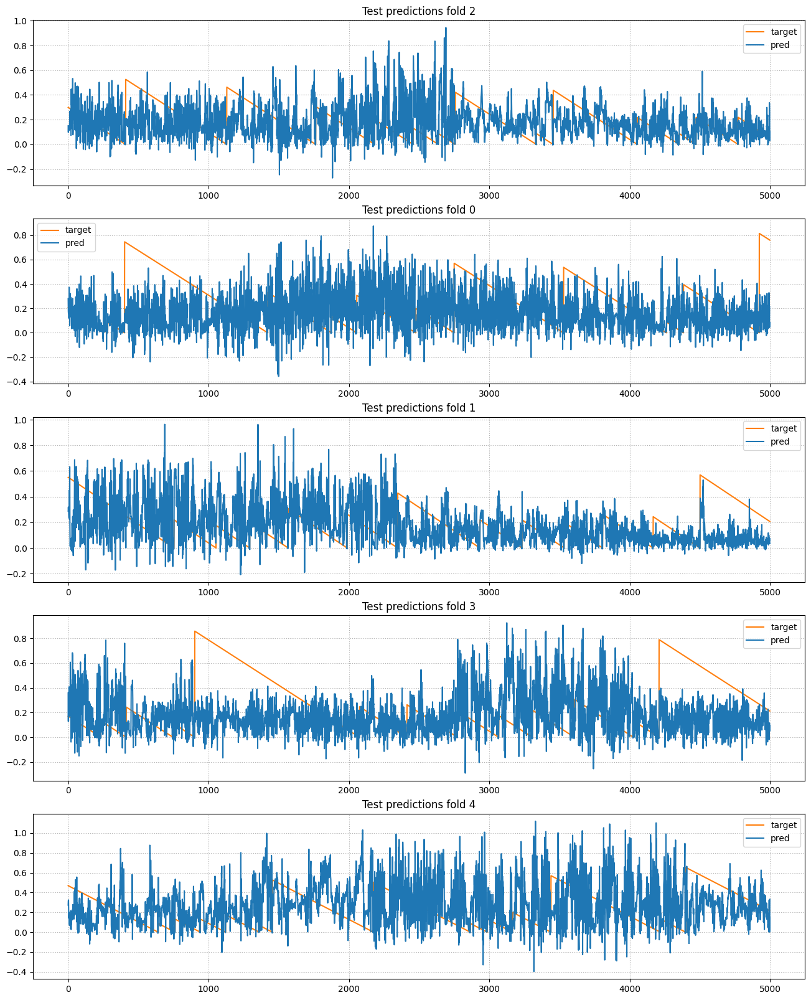

In [ ]:
fig, ax = plt.subplots(5,1, figsize=(16,20))

for i, fold in enumerate(folds):

  y_pred_test = models_dict[fold].predict(x_test_folds[fold][:5000], verbose=0).ravel()
  stop = 5000
  get_plot_rul(y_pred_test[:stop], y_test_folds[fold][:stop], ax=ax[i], fold=fold)

plt.show()

These results show that no matter which partition of the dataset we use, we always obtained very poor results on the test set.

# Failed components prediction

The second tested approach consists in, rather than predicting the RUL for each single component, predict if a component is going to fail in the next hours and in that case wich component is going to fail.

This alternative approach the problem is formulated as a classification task.

The data are splitted in train and test set and then standardized

In [ ]:
df_train, df_test = utils.split_data(df_final)

(527348,) (227095,)


In [ ]:
df_train_st, df_test_st = utils.standardise_data_train_test(df_train, df_test)

The data are aggregated in 6 hours windows and the labels for the RUL of the component are generated.

In [ ]:
# 6 hours aggregation

df_agg_6_train = utils.aggregation(df_train_st, comp, 6)
df_agg_6_test = utils.aggregation(df_test_st, comp, 6)

The labels for the classification task are generated in the :


1.   [0,0,0,0] if no failure occurs in the next 24 hours for all the components.
2.   [0,1,0,0] if a failure for component 2 occurs in the next 24 hours.
3.   [1,0,1,0] if a failure for components 1 and 3 occurs in the next 24 hours.



In [ ]:
# Generate labels for binary classification

w = 4 # 6*4 = 24 ore

df_train_st = utils.generate_label_classification(df_train_st, w)
df_test_st = utils.generate_label_classification(df_test_st, w)

After the features selection step, a sequence of data with a window of 7 days is created.

In [ ]:
# Create sequence data

columns = ['volt','rotate','pressure','vibration','model', 'age', 'error1','error2','error3','error4','error5']
time_steps = 28 # 7 days

x_train, y_train = utils.create_data_sequence(time_steps, df_train_st, comp, columns)
x_test, y_test = utils.create_data_sequence(time_steps, df_test_st, comp, columns)

nb_timesteps = x_train.shape[1]
nb_features = x_train.shape[2]
nb_out = 4
sequence_length = time_steps

## CNN

The first model to address the prediction of the possible failed components is a Convolutional Neural Network composed by four CONV1D layers and one Dense layer.


In [ ]:
cnn = models.build_CNN(nb_out, columns)
cnn.compile(loss = tf.nn.sigmoid_cross_entropy_with_logits, optimizer = keras.optimizers.AdamW(learning_rate=3e-5))

print(cnn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 27, 32)            736       
                                                                 
 conv1d_1 (Conv1D)           (None, 26, 128)           8320      
                                                                 
 conv1d_2 (Conv1D)           (None, 25, 128)           32896     
                                                                 
 conv1d_3 (Conv1D)           (None, 24, 64)            16448     
                                                                 
 max_pooling1d (MaxPooling1  (None, 12, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 768)               0         
                                                        

In [ ]:
history = cnn.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=30, batch_size=64)

Epoch 1/30
1346/1346 [==============================] - 20s 7ms/step - loss: 0.0890 - val_loss: 0.0446
Epoch 2/30
1346/1346 [==============================] - 13s 10ms/step - loss: 0.0394 - val_loss: 0.0365
Epoch 3/30
1346/1346 [==============================] - 11s 8ms/step - loss: 0.0287 - val_loss: 0.0270
Epoch 4/30
1346/1346 [==============================] - 11s 9ms/step - loss: 0.0211 - val_loss: 0.0225
Epoch 5/30
1346/1346 [==============================] - 9s 6ms/step - loss: 0.0176 - val_loss: 0.0204
Epoch 6/30
1346/1346 [==============================] - 10s 7ms/step - loss: 0.0158 - val_loss: 0.0186
Epoch 7/30
1346/1346 [==============================] - 8s 6ms/step - loss: 0.0144 - val_loss: 0.0177
Epoch 8/30
1346/1346 [==============================] - 9s 6ms/step - loss: 0.0133 - val_loss: 0.0165
Epoch 9/30
1346/1346 [==============================] - 9s 7ms/step - loss: 0.0124 - val_loss: 0.0153
Epoch 10/30
1346/1346 [==============================] - 8s 6ms/step - loss:

###Model evaluation


Let's predict the failures on the training set in order to optimize a threshold for the classification step

In [ ]:
tr_pred_train = model.predict(x_train, verbose=0) #.ravel()# * trmaxrul
tr_pred_train_as = tf.keras.activations.sigmoid(tr_pred_train)
best_thr, _ = utils.get_best_threshold(tr_pred_train_as, y_train)

tr_pred_train_as_th = np.where(tr_pred_train_as >= best_thr, 1, 0)

f1_score(y_train, tr_pred_train_as_th, average='weighted')

BEST THRESHOLD 0.37
F1 SCORE: 0.900356877312372


In [ ]:
tr_pred_test = model.predict(x_test, verbose=0)

In [ ]:
tr_pred_test_as = tf.keras.activations.sigmoid(tr_pred_test)

In [ ]:
tr_pred_test_as_th = np.where(tr_pred_test_as >= best_thr, 1, 0)

In [ ]:
f1_score(y_test, tr_pred_test_as_th, average='weighted')

0.8630243353265252

Let's visualize a the predictions for the component 1

In [ ]:
component = 0
pred_comp1 = tr_pred_test_as_th[:,component]
gt_comp1 = y_test[:,component]

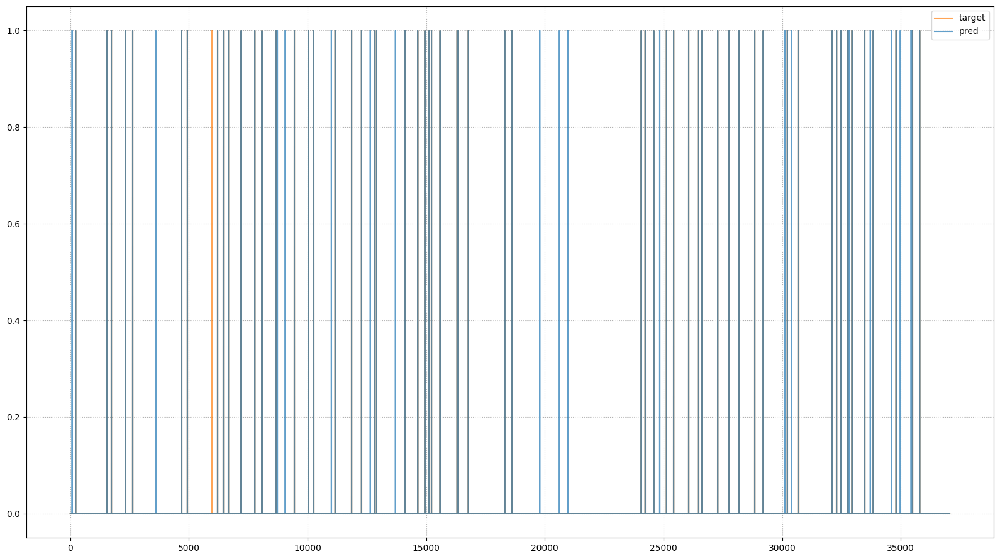

In [ ]:
utils.plot_rul(pred_comp1, gt_comp1, figsize=(16,9))

In [ ]:
true_labels, predicted_labels = utils.flatted_labels(y_test, tr_pred_test_as_th)

From the obtained results it can be noted that the majority of the cilecles do not contain any failure menaning that the dataset is hihgly unbalanced.

The confusion matrix below contains numbers different from zero only in the diagonal and in the fisrt row and clolumn. This is due to the fact that a component can be classified as 0 mening that is not going to fail in the next 48H or as 1 mening that in the next 48H is going to fail.

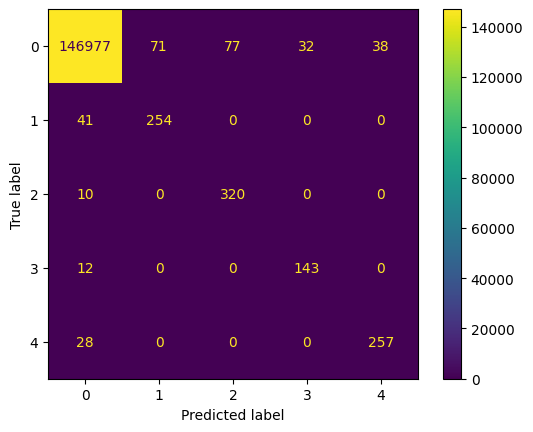

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix(true_labels, predicted_labels))
disp.plot()
plt.show()

## LSTM simple

The second model to address the RUL prediction problem is a Recurrent Neural Network composed by three LSTM layers and three Dense layers.


In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=3e-5)
lstm = models.build_LSTM_simple(time_steps, columns, nb_out)

lstm.compile(loss=tf.nn.sigmoid_cross_entropy_with_logits, optimizer=optimizer)

print(lstm.summary())

In [ ]:
history = lstm.fit(x_train, y_train, epochs = 40,
                    validation_data = (x_test, y_test),
                    batch_size = 256)

Epoch 1/40
337/337 [==============================] - 12s 15ms/step - loss: 0.3508 - val_loss: 0.0930
Epoch 2/40
337/337 [==============================] - 4s 12ms/step - loss: 0.0571 - val_loss: 0.0443
Epoch 3/40
337/337 [==============================] - 5s 14ms/step - loss: 0.0428 - val_loss: 0.0424
Epoch 4/40
337/337 [==============================] - 4s 11ms/step - loss: 0.0421 - val_loss: 0.0423
Epoch 5/40
337/337 [==============================] - 4s 11ms/step - loss: 0.0419 - val_loss: 0.0420
Epoch 6/40
337/337 [==============================] - 5s 14ms/step - loss: 0.0411 - val_loss: 0.0401
Epoch 7/40
337/337 [==============================] - 4s 11ms/step - loss: 0.0375 - val_loss: 0.0350
Epoch 8/40
337/337 [==============================] - 4s 11ms/step - loss: 0.0319 - val_loss: 0.0292
Epoch 9/40
337/337 [==============================] - 4s 13ms/step - loss: 0.0277 - val_loss: 0.0263
Epoch 10/40
337/337 [==============================] - 4s 13ms/step - loss: 0.0255 - val_l

### Model evaluation


Let's predict the failures on the training set in order to optimize a threshold for the classification step

In [ ]:
tr_pred_train = model.predict(x_train, verbose=0) #.ravel()# * trmaxrul
tr_pred_train_as = tf.keras.activations.sigmoid(tr_pred_train)
best_thr, _ = utils.get_best_threshold(tr_pred_train_as, y_train)

tr_pred_train_as_th = np.where(tr_pred_train_as >= best_thr, 1, 0)

f1_score(y_train, tr_pred_train_as_th, average='weighted')

BEST THRESHOLD 0.37
F1 SCORE: 0.900356877312372


In [ ]:
tr_pred_test = model.predict(x_test, verbose=0)

In [ ]:
tr_pred_test_as = tf.keras.activations.sigmoid(tr_pred_test)

In [ ]:
tr_pred_test_as_th = np.where(tr_pred_test_as >= best_thr, 1, 0)

In [ ]:
f1_score(y_test, tr_pred_test_as_th, average='weighted')

0.8630243353265252

Let's visualize a the predictions for the component 1

In [ ]:
component = 0
pred_comp1 = tr_pred_test_as_th[:, component]
gt_comp1 = y_test[:, component]

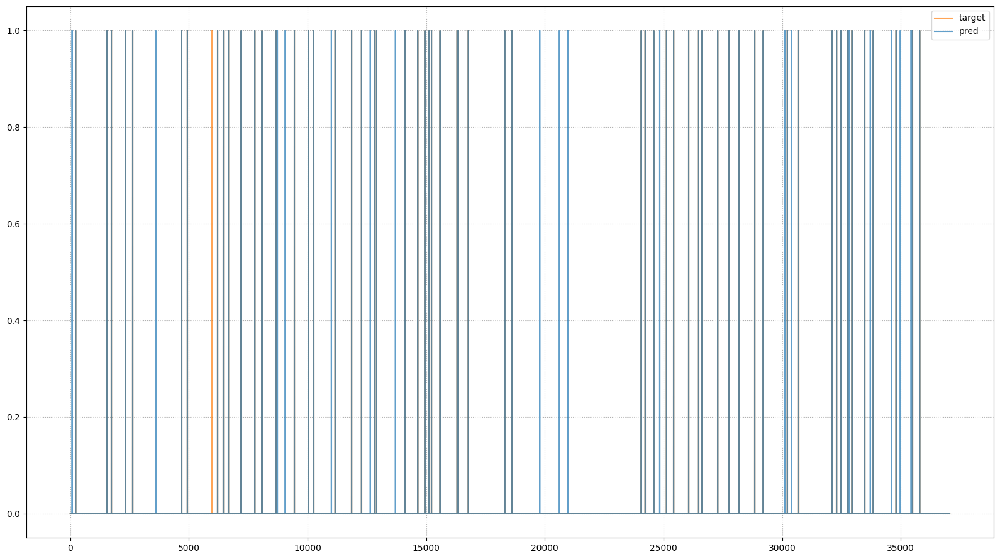

In [ ]:
utils.plot_rul(pred_comp1, gt_comp1, figsize=(16,9))

In [ ]:
true_labels, predicted_labels = utils.flatted_labels(y_test, tr_pred_test_as_th)

From the obtained results it can be noted that the majority of the cilecles do not contain any failure menaning that the dataset is hihgly unbalanced.

The confusion matrix below contains numbers different from zero only in the diagonal and in the fisrt row and clolumn. This is due to the fact that a component can be classified as 0 mening that is not going to fail in the next 48H or as 1 mening that in the next 48H is going to fail.

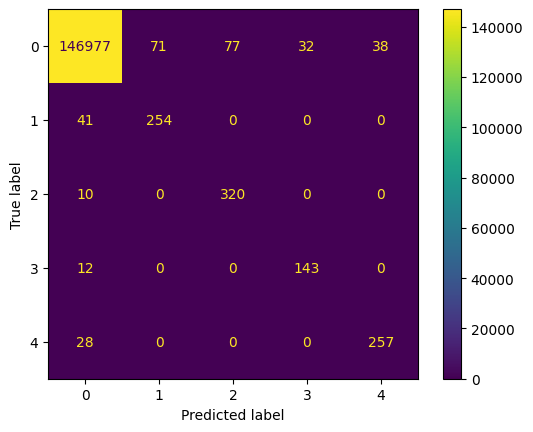

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix(true_labels, predicted_labels))
disp.plot()
plt.show()

## LSTM multihead

The third model to address the RUL prediction problem is a Multihaed Neural Network composed by LSTM, Convolutional and Dense layers.

This model processes the input features singularly, then after this initial phase the layers are merged togheter in order to have the final prediction.

In [ ]:
training_sample_multihead = [x_train[:,:,i].reshape((x_train.shape[0],nb_timesteps, 1)) for i in range(nb_features)]
test_sample_multihead = [x_test[:,:,i].reshape((x_test.shape[0],nb_timesteps, 1)) for i in range(nb_features)]

In [ ]:
optimizer = keras.optimizers.AdamW(learning_rate=0.001)
lstm_mh = models.build_LSTM_multihead(nb_features, sequence_length, nb_out)

lstm_mh.compile(loss=tf.nn.sigmoid_cross_entropy_with_logits,
              optimizer=optimizer)

print(lstm_mh.summary())

In [ ]:
train_history = lstm_mh.fit(training_sample_multihead, y_train, batch_size = 1024, epochs=30,
        validation_data=(test_sample_multihead, y_test))

Epoch 1/30
85/85 [==============================] - 73s 258ms/step - loss: 0.0970 - k_score: 10828.8105 - val_loss: 0.7093 - val_k_score: 115.9171
Epoch 2/30
85/85 [==============================] - 14s 169ms/step - loss: 0.0658 - k_score: 13268.5254 - val_loss: 0.7877 - val_k_score: 211.1760
Epoch 3/30
85/85 [==============================] - 15s 181ms/step - loss: 0.0530 - k_score: 15474.1562 - val_loss: 0.7320 - val_k_score: 344.5934
Epoch 4/30
85/85 [==============================] - 14s 168ms/step - loss: 0.0418 - k_score: 19180.0938 - val_loss: 0.5169 - val_k_score: 686.5697
Epoch 5/30
85/85 [==============================] - 15s 180ms/step - loss: 0.0319 - k_score: 22519.1289 - val_loss: 0.1508 - val_k_score: 1982.7692
Epoch 6/30
85/85 [==============================] - 15s 180ms/step - loss: 0.0266 - k_score: 25722.8594 - val_loss: 0.0642 - val_k_score: 5588.5796
Epoch 7/30
85/85 [==============================] - 14s 168ms/step - loss: 0.0227 - k_score: 32881.7500 - val_loss: 

### Model evaluation


Let's predict the failures on the training set in order to optimize a threshold for the classification step

In [ ]:
tr_pred_train =  lstm_mh.predict(training_sample_multihead, verbose=0)
tr_pred_train_as = tf.keras.activations.sigmoid(tr_pred_train)
best_thr, _ = utils.get_best_threshold(tr_pred_train_as, y_train)

tr_pred_train_as_th = np.where(tr_pred_train_as >= best_thr, 1, 0)

f1_score(y_train, tr_pred_train_as_th, average='weighted')

BEST THRESHOLD 0.11
F1 SCORE: 0.9987797916369345


In [ ]:
tr_pred_test = lstm_mh.predict(test_sample_multihead, verbose=0)#.ravel()# * trmaxrul

In [ ]:
tr_pred_test_as = tf.keras.activations.sigmoid(tr_pred_test)

In [ ]:
tr_pred_test_as_th = np.where(tr_pred_test_as >= best_thr, 1, 0)

In [ ]:
f1_score(y_test, tr_pred_test_as_th, average='weighted')

0.942490530270045

Let's visualize a the predictions for the component 1

In [ ]:
component = 0
pred_comp1 = tr_pred_test_as_th[:,component]
gt_comp1 = y_test[:,component]

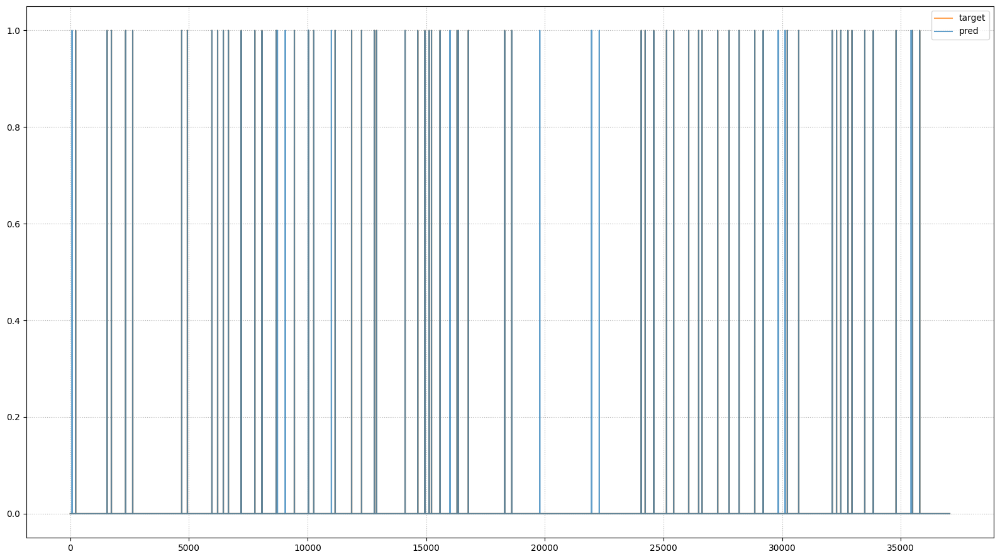

In [ ]:
utils.plot_rul(pred_comp1, gt_comp1, figsize=(16,9))

In [ ]:
true_labels, predicted_labels = utils.flatted_labels(y_test, tr_pred_test_as_th)

From the obtained results it can be noted that the majority of the cilecles do not contain any failure menaning that the dataset is hihgly unbalanced.

The confusion matrix below contains numbers different from zero only in the diagonal and in the fisrt row and clolumn. This is due to the fact that a component can be classified as 0 mening that is not going to fail in the next 48H or as 1 mening that in the next 48H is going to fail.

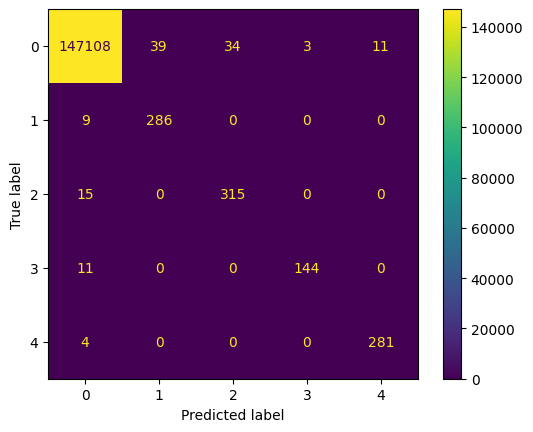

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix(true_labels, predicted_labels))
disp.plot()
plt.show()